<a href="https://colab.research.google.com/github/Ela-Na/Ryerson-cind860/blob/main/Ela_Project_cind860_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### <font color="purple"> CIND 860- Advanced Data Analytics Project </font>

 ### <font color="green"> Elaheh Najafi </font>


 # Diagnosis of Retina Abnormality from normal and the types of Anomalies 

## <font color="purple"> Introducing Data Set </font>

Dataset of validated OCT images for diagnosis of retinal diseases gathered by  Kermany et al. Images are split into a training set and a testing set of independent patients. Images are labeled as (disease)-(randomized patient ID) -(image number by this patient) and split into 4 directories: CNV, DME, DRUSEN, and NORMAL. CNV, DME are different types of Retinal diseases and NORMAL folder includes images of normal and healthy REtina. Originally there were  84,495 X-Ray images (JPEG), which for this project 10253 were used by reducing the number of images in train folder. 

## <font color="blue"> Reading Data Set and importing required libraries </font>

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
import os
print("current working dir", os.getcwd())

import numpy as np
print("np", np.__version__)

import sys

import keras
from tensorflow import keras

import tensorflow as tf
print("tf", tf.__version__)
print("tf.keras", tf.keras.__version__)

import pandas as pd

import matplotlib.pyplot as plt

from tensorflow.python.client import device_lib 

from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image # Module with imagepreprocessing utilities

# keras functions through tensorflow
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model

from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers

import pickle

current working dir /content
np 1.21.5
tf 2.8.0
tf.keras 2.8.0


In [ ]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 3975742827277616299
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 11320098816
locality {
  bus_id: 1
  links {
  }
}
incarnation: 9151461283804519374
physical_device_desc: "device: 0, name: Tesla K80, pci bus id: 0000:00:04.0, compute capability: 3.7"
xla_global_id: 416903419
]


In [ ]:
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
print("gpu_devices", gpu_devices)

gpu_devices [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
## check if gpu is there, if not it will raise error
## go to "Runtime/Change runtime type" to activate GPU
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

tf.config.experimental.set_memory_growth(gpu_devices[0], enable=True)

Found GPU at: /device:GPU:0


In [ ]:
#import shutil
#shutil.unpack_archive("/content/drive/MyDrive/OCT2017-Data.zip", "/content/drive/MyDrive")

In [3]:
train_dir = '/content/drive/MyDrive/OCT2017-Data/train'
train_normal = '/content/drive/MyDrive/OCT2017-Data/train/NORMAL'
train_cnv = '/content/drive/MyDrive/OCT2017-Data/train/CNV'
train_drusen = '/content/drive/MyDrive/OCT2017-Data/train/DRUSEN'
train_dme = '/content/drive/MyDrive/OCT2017-Data/train/DME'

In [4]:
validation_dir = '/content/drive/MyDrive/OCT2017-Data/val'
val_normal = '/content/drive/MyDrive/OCT2017-Data/val/NORMAL'
val_cnv = '/content/drive/MyDrive/OCT2017-Data/val/CNV'
val_drusen = '/content/drive/MyDrive/OCT2017-Data/val/DRUSEN'
val_dme = '/content/drive/MyDrive/OCT2017-Data/val/DME'

In [5]:
test_dir = '/content/drive/MyDrive/OCT2017-Data/test'
test_normal = '/content/drive/MyDrive/OCT2017-Data/test/NORMAL'
test_cnv = '/content/drive/MyDrive/OCT2017-Data/test/CNV'
test_drusen = '/content/drive/MyDrive/OCT2017-Data/test/DRUSEN'
test_dme = '/content/drive/MyDrive/OCT2017-Data/test/DME'

In [6]:
train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [7]:
train_generator1 = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=150,
    class_mode='binary')

val_generator1 = valid_datagen.flow_from_directory(
    validation_dir,
    target_size=(224, 224),
    batch_size=150,
    class_mode='binary')

test_generator1 = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=150,
    class_mode='binary')

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
for data_batch, labels_batch in train_generator1:
  print('data batch shape:', data_batch.shape)
  print('labels batch shape:', labels_batch.shape)
  break

data batch shape: (150, 150, 150, 3)
labels batch shape: (150,)


## <font color='blue'> Exploratory Image Data Analysis </font>

In [ ]:
sample_training_images, _ = next(train_generator1)


# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
def plotImages(images_arr):
    fig, axes = plt.subplots(10, 10, figsize=(100,100))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

plotImages(sample_training_images[:100])

In [ ]:
import matplotlib.pyplot as plt

def plotImages(images_arr):
    fig, axes = plt.subplots(10, 15, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

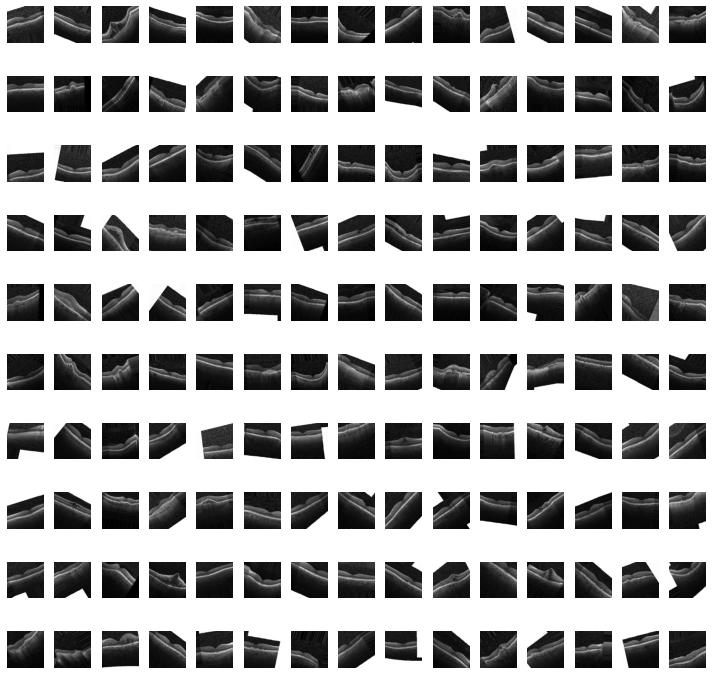

In [ ]:
images_tg = train_generator1[0][0]
images_arr = np.array(images_tg)
plotImages(images_arr)

In [ ]:
!pip install -q easyimages

     |████████████████████████████████| 88 kB 3.7 MB/s 


## <font color='purple'> Pandas Profiling to Explore Data </font>

In [ ]:
!pip install -q basic-image-eda


In [ ]:
# latest version
# pip install git+https://github.com/Soongja/basic-image-eda



found 26315 images.
Using 2 threads. (max:2)



100%|██████████| 26315/26315 [06:18<00:00, 69.51it/s]



*--------------------------------------------------------------------------------------*
number of images                         |  26315

dtype                                    |  uint8
channels                                 |  [1]
extensions                               |  ['jpeg']

min height                               |  496
max height                               |  512
mean height                              |  500.1326999809994
median height                            |  496

min width                                |  384
max width                                |  1536
mean width                               |  659.6706061181835
median width                             |  512

mean height/width ratio                  |  0.7581551994926965
median height/width ratio                |  0.96875
recommended input size(by mean)          |  [504 656] (h x w, multiples of 8)
recommended input size(by mean)          |  [496 656] (h x w, multiples of 16)
recommended input si

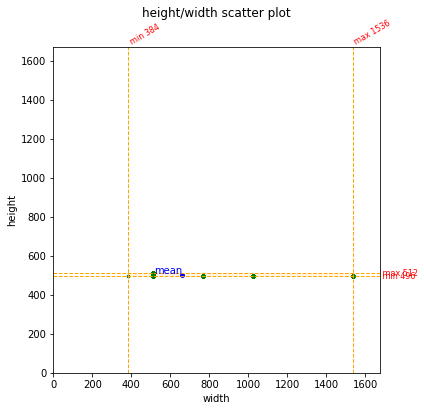

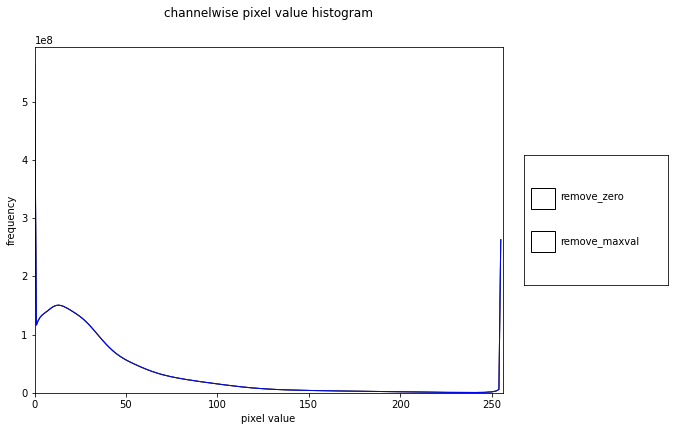


found 37205 images.
Using 2 threads. (max:2)



100%|██████████| 37205/37205 [09:26<00:00, 65.69it/s]



*--------------------------------------------------------------------------------------*
number of images                         |  37205

dtype                                    |  uint8
channels                                 |  [1]
extensions                               |  ['jpeg']

min height                               |  496
max height                               |  496
mean height                              |  496.0
median height                            |  496

min width                                |  384
max width                                |  1536
mean width                               |  736.3724230614165
median width                             |  512

mean height/width ratio                  |  0.6735722094778005
median height/width ratio                |  0.96875
recommended input size(by mean)          |  [496 736] (h x w, multiples of 8)
recommended input size(by mean)          |  [496 736] (h x w, multiples of 16)
recommended input size(by mean) 

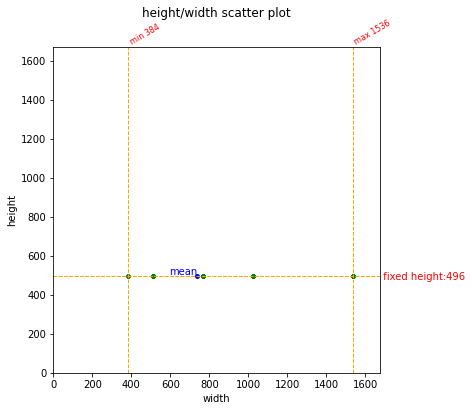

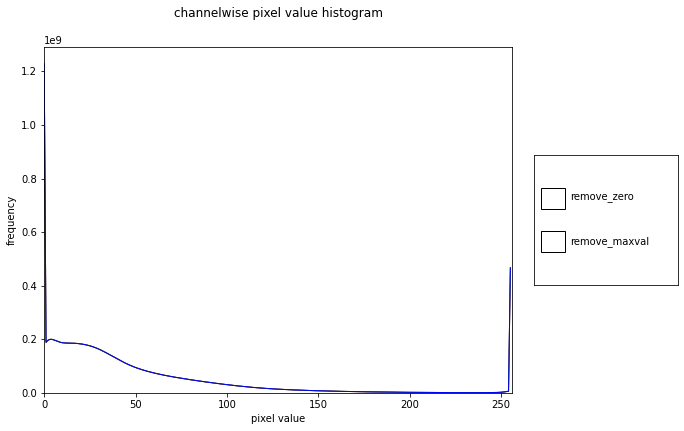


found 11348 images.
Using 2 threads. (max:2)



100%|██████████| 11348/11348 [02:32<00:00, 74.45it/s]



*--------------------------------------------------------------------------------------*
number of images                         |  11348

dtype                                    |  uint8
channels                                 |  [1]
extensions                               |  ['jpeg']

min height                               |  496
max height                               |  512
mean height                              |  508.20867113147693
median height                            |  512

min width                                |  512
max width                                |  1536
mean width                               |  564.7881565033487
median width                             |  512

mean height/width ratio                  |  0.8998217566703945
median height/width ratio                |  1.0
recommended input size(by mean)          |  [512 568] (h x w, multiples of 8)
recommended input size(by mean)          |  [512 560] (h x w, multiples of 16)
recommended input size(

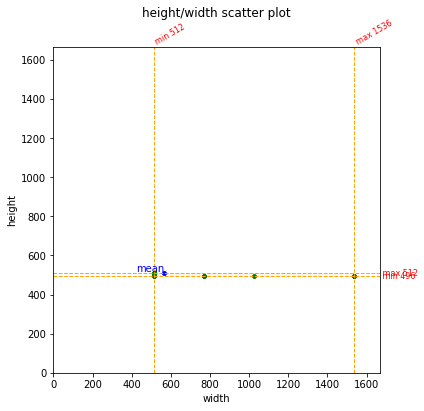

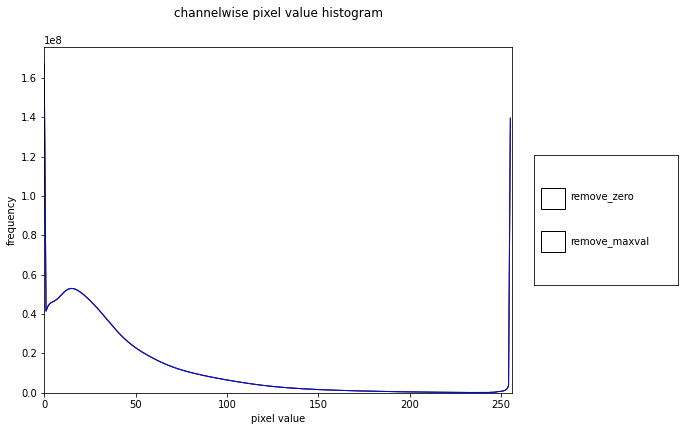


found 8616 images.
Using 2 threads. (max:2)



100%|██████████| 8616/8616 [01:53<00:00, 76.02it/s]



*--------------------------------------------------------------------------------------*
number of images                         |  8616

dtype                                    |  uint8
channels                                 |  [1]
extensions                               |  ['jpeg']

min height                               |  496
max height                               |  496
mean height                              |  496.0
median height                            |  496

min width                                |  512
max width                                |  1536
mean width                               |  670.6926648096564
median width                             |  512

mean height/width ratio                  |  0.7395339564966996
median height/width ratio                |  0.96875
recommended input size(by mean)          |  [496 672] (h x w, multiples of 8)
recommended input size(by mean)          |  [496 672] (h x w, multiples of 16)
recommended input size(by mean)  

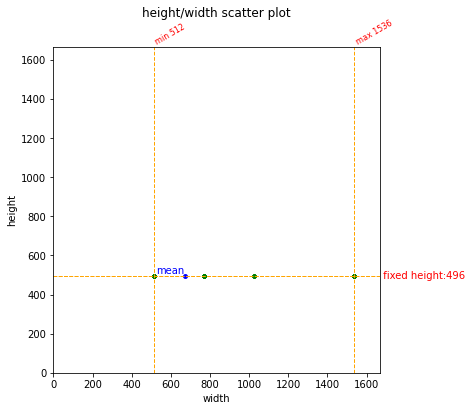

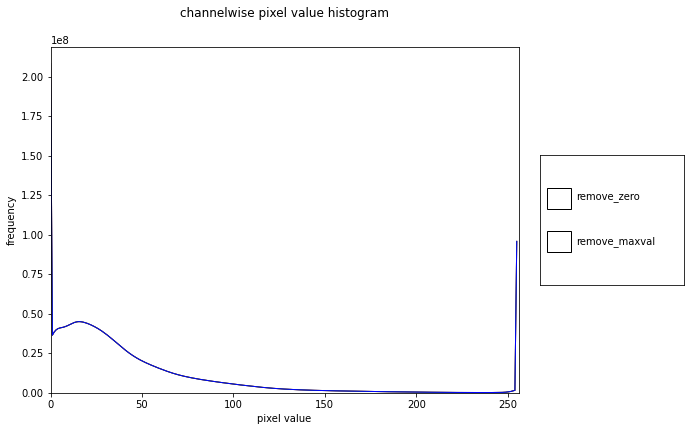

In [ ]:
from basic_image_eda import BasicImageEDA


data_dir1 = '/content/drive/MyDrive/OCT2017_2/OCT2017/train/NORMAL/'
data_dir2 = '/content/drive/MyDrive/OCT2017_2/OCT2017/train/CNV/'
data_dir3 = '/content/drive/MyDrive/OCT2017_2/OCT2017/train/DME/'
data_dir4 = '/content/drive/MyDrive/OCT2017_2/OCT2017/train/DRUSEN/'

dirs = [data_dir1, data_dir2, data_dir3, data_dir4]
extensions = ['png', 'jpg', 'jpeg']
threads = 0
dimension_plot = True
channel_hist = True
nonzero = False
hw_division_factor = 1.0

for dir in dirs:

  BasicImageEDA.explore(dir, extensions, threads, dimension_plot, channel_hist, nonzero, hw_division_factor)

In [ ]:
# to check whether there is corrupted images in the dataset

In [ ]:
!pip install -q pandas-profiling
#!pip install -U -q pandas-profiling


In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [ ]:
import pandas_profiling as pdpf

In [ ]:
import os
import pandas as pd

BASE_DIR = '/content/drive/MyDrive/OCT2017_2/OCT2017/train/'
train_cnv = BASE_DIR+'CNV/'
train_dme = BASE_DIR+'DME/'
train_normal = BASE_DIR+'NORMAL/'
train_drusen = BASE_DIR+'DRUSEN/'

images_cnv = sorted(os.listdir(train_cnv))
images_dme = sorted(os.listdir(train_dme))
images_drusen = sorted(os.listdir(train_drusen))
images_normal = sorted(os.listdir(train_normal))

images1=[i for i in images_cnv]
images2=[i for i in images_dme]
images3=[i for i in images_drusen]
images4=[i for i in images_normal]

train_images = [images1, images2, images3, images4]

length = []
max_l = 0

for l in train_images:
  length.append(len(l))

for l in length:
  if l > length[0]:
    max_l = l
  else:
    max_l = length[0]


df1 = pd.DataFrame()
df2 = pd.DataFrame()
df3 = pd.DataFrame()
df4 = pd.DataFrame()
df1['cnv']=[train_cnv+str(x) for x in images1]
df2['dme']=[train_dme+str(x) for x in images2]
df3['drusen']=[train_drusen+str(x) for x in images3]
df4['normal']=[train_normal+str(x) for x in images4]


df = pd.DataFrame()

df = pd.concat([df1, df2, df3, df4], axis=1, join='outer', ignore_index = True)


#df['oct'] = [train_cnv+str(x) for x in images1]
#df['label'] = ['cnv' for 'cnv' in range(len(images1))]
cnv_df = df.to_csv('/content/drive/MyDrive/OCT2017_2/OCT2017/train/oct_train.csv', index =False, header=None)
'''
dme_df = df2.to_csv('/content/drive/MyDrive/OCT2017_2/OCT2017/train/oct_dme.csv', index =False, header=None)
drusen = df3.to_csv('/content/drive/MyDrive/OCT2017_2/OCT2017/train/oct_drusen.csv', index =False, header=None)
normal_df = df4.to_csv('/content/drive/MyDrive/OCT2017_2/OCT2017/train/oct_normal.csv', index =False, header=None)'''

"\ndme_df = df2.to_csv('/content/drive/MyDrive/OCT2017_2/OCT2017/train/oct_dme.csv', index =False, header=None)\ndrusen = df3.to_csv('/content/drive/MyDrive/OCT2017_2/OCT2017/train/oct_drusen.csv', index =False, header=None)\nnormal_df = df4.to_csv('/content/drive/MyDrive/OCT2017_2/OCT2017/train/oct_normal.csv', index =False, header=None)"

In [ ]:
max_l
length


[37205, 11348, 8616, 26315]

In [ ]:
from pandas_profiling import ProfileReport


In [ ]:
profile = pdpf.ProfileReport(df)
print(profile)


In [ ]:
df.profile_report(style={'full_width':True})


ValidationError: ignored

In [ ]:
profile = df.profile_report(title='Pandas Profiling Report')
profile.to_file(output_file='OCT.pdf')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:263: UserWarning: Extension .pdf not supported. For now we assume .html was intended. To remove this warning, please use .html or .json.
  f"Extension {suffix} not supported. For now we assume .html was intended. "


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile

In [ ]:
profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)

In [ ]:
profile2 = df.profile_report(title='Pandas Profiling Report', plot={'histogram': {'bins': 8}})
profile2.to_file("oct2.pdf")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/pandas_profiling/profile_report.py:263: UserWarning: Extension .pdf not supported. For now we assume .html was intended. To remove this warning, please use .html or .json.
  f"Extension {suffix} not supported. For now we assume .html was intended. "


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile2

In [ ]:
# Installing the opencv-python library
!pip install opencv-python


In [ ]:
# Importing the cv2 module
import cv2

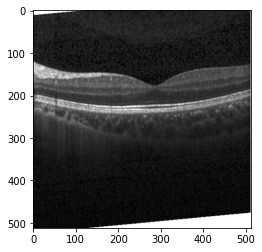

In [ ]:
import imageio


img = imageio.imread('/content/drive/MyDrive/OCT2017_2/OCT2017/train/NORMAL/NORMAL-36734-5.jpeg')
img.shape  # im is a numpy array


img = img.astype(np.uint8)
img = img / 255
plt.imshow(img,cmap='gray')



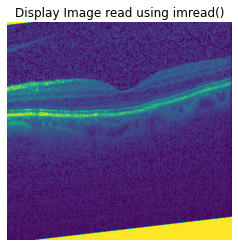

In [ ]:
img_array=plt.imread('/content/drive/MyDrive/train/NORMAL/NORMAL-1001666-1.jpeg') 
plt.imshow(img_array)
plt.title('Display Image read using imread()') 
plt.axis('off')
plt.show()

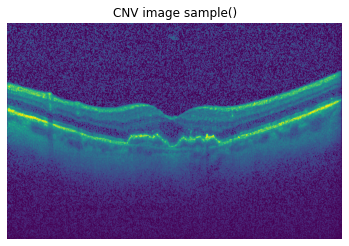

In [ ]:
img_array=plt.imread('//content/drive/MyDrive/OCT2017_2/OCT2017/train/CNV/CNV-103044-106.jpeg') 
plt.imshow(img_array)
plt.title('CNV image sample()') 
plt.axis('off')
plt.show()

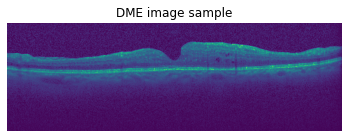

In [ ]:
img_array=plt.imread('/content/drive/MyDrive/OCT2017_2/OCT2017/train/DME/DME-1072015-3.jpeg') 
plt.imshow(img_array)
plt.title('DME image sample') 
plt.axis('off')
plt.show()

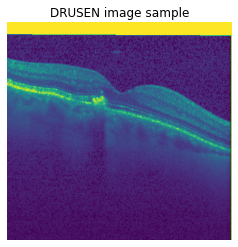

In [ ]:
img_array=plt.imread('/content/drive/MyDrive/OCT2017_2/OCT2017/train/DRUSEN/DRUSEN-1077513-1.jpeg') 
plt.imshow(img_array)
plt.title('DRUSEN image sample') 
plt.axis('off')
plt.show()

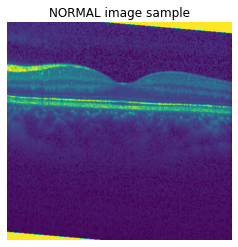

In [ ]:
img_array=plt.imread('/content/drive/MyDrive/OCT2017_2/OCT2017/train/NORMAL/NORMAL-112928-6.jpeg') 
plt.imshow(img_array)
plt.title('NORMAL image sample') 
plt.axis('off')
plt.show()

## <font color='blue'> Question 1: Which features are influential predictors for classifying retina diseases? </font>

## Analyzing Features 

### <font color='purple'>  Feature Selection using Machine Learning </font>

### <font color='purple'> Feature Analyzing using PCA </font>

In [ ]:
import math

n = 50
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(7752 / (1.0 * n)) 
# 1.0 above is to skip integer division

ptrain_label = []
ptrain_data = []

for i in range(0,int(number_generator)):
    ptrain_label.extend(np.array(train_generator1[i][1]))
    ptrain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
ptrain_label = np.array(ptrain_label)
ptrain_data = np.array(ptrain_data)

In [ ]:
np.array(ptrain_data).shape

(2100, 224, 224, 3)

In [ ]:
ptrain_data = ptrain_data.reshape([7752, 224*224*3])

In [ ]:

n = 50
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(1000 / (1.0 * n)) 
# 1.0 above is to skip integer division

ptest_label = []
ptest_data = []

for i in range(0,int(number_generator)):
    ptest_label.extend(np.array(test_generator1[i][1]))
    ptest_data.extend(np.array(test_generator1[i][0]))


In [ ]:
ptest_label = np.array(ptest_label)
ptest_data = np.array(ptest_data)

In [ ]:
ptest_data = ptest_data.reshape([1000, 224*224*3])

In [ ]:
np.array(ptest_data).shape

(600, 150528)

In [ ]:

n = 50
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(501 / (1.0 * n)) 
# 1.0 above is to skip integer division

pval_label1 = []
pval_data1 = []

for i in range(0,int(number_generator)):
    ptrain_label.extend(np.array(train_generator1[i][1]))
    ptrain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
pval_label = np.array(pval_label1)
pval_data = np.array(pval_data1)

In [ ]:
pval_data = pval_data.reshape (501, 224*224*3)

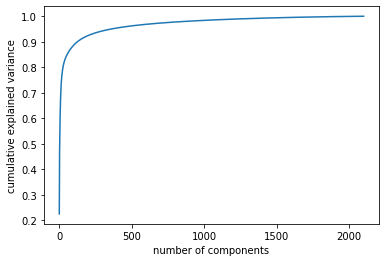

In [ ]:
from sklearn.decomposition import PCA

pca = PCA().fit(ptrain_data)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

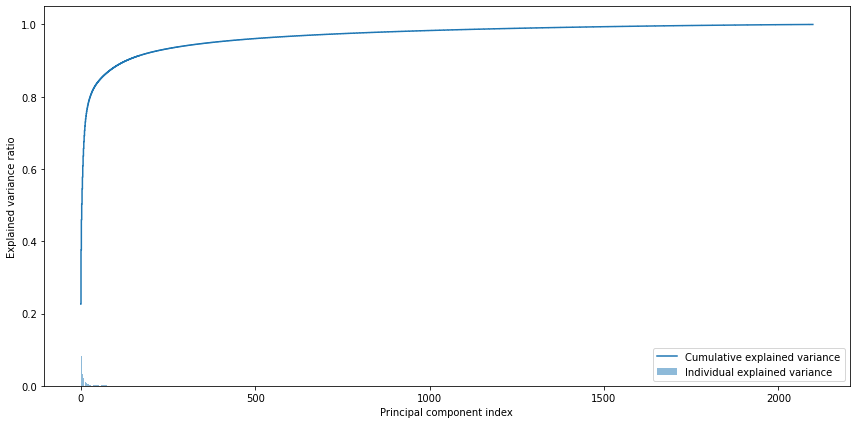

In [ ]:
exp_var_pca = pca.explained_variance_ratio_
#
# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

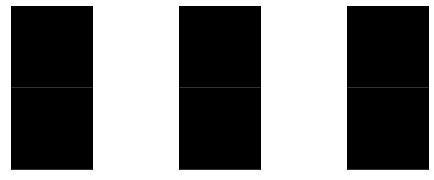

In [ ]:
from sklearn.decomposition import PCA
#n_components=0.80 means it will return the Eigenvectors that have the 80% of the variation in the dataset
#pca = PCA(n_components=28)
pca = PCA(0.8)
poct1 = pca.fit(ptrain_data)
poct2 = PCA(n_components=6).fit(ptrain_data)
fig, axes = plt.subplots(2,3,figsize=(9,3),
 subplot_kw={'xticks':[], 'yticks':[]},
 gridspec_kw=dict(hspace=0.01, wspace=0.01))
for i, ax in enumerate(axes.flat):
  ax.imshow(poct2.components_[i].reshape(224,224, 3).astype('uint8'), cmap='viridis')
 


In [ ]:
print(pca.explained_variance_ratio_)
len(pca.explained_variance_ratio_)

[0.23415829 0.14336047 0.08371107 0.04549903 0.04192441 0.03196293
 0.03055373 0.02816267 0.02193862 0.01856412 0.01632916 0.0140105
 0.01320259 0.0111197  0.00926439 0.00715588 0.00678089 0.00654375
 0.0058174  0.00528694 0.00456941 0.00440867 0.0041157  0.00377876
 0.00332407 0.00320125 0.00311003]


27

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

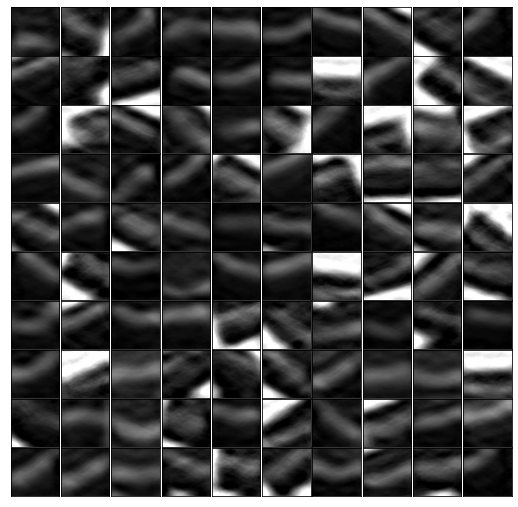

In [ ]:
components = pca.transform(ptrain_data)
projected = pca.inverse_transform(components)
fig, axes = plt.subplots(10,10,figsize=(9,9), subplot_kw={'xticks':[], 'yticks':[]},
            gridspec_kw=dict(hspace=0.01, wspace=0.01))
for i, ax in enumerate(axes.flat):
    ax.imshow(projected[i].reshape(224, 224, 3),cmap="gray")


In [ ]:
filename = 'pca_model.sav'
pickle.dump(pca, open(filename, 'wb'))

In [ ]:

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(ptest_data, ptest_label)
print(result)

# <font color='blue'> Q2:  How Does base CNN  perform for feature extraction of Normal and three different Retina diseases in comparison to other available techniques using Random Forest as classifier? </font>
-	Does CNN extract features that are related to the normal and three abnormal retina diseases more accurately than Machine Learning Feature Extraction techniques such as SVM and PCA or HOG?
-	Does CNN extract features that are related to the normal and three abnormal retina diseases more accurately than Pre-trained CNNs such as VGGNet and ResNet?
-	Does adding a segmentation part would enhance the performance of the CNN for feature extraction?
o	Does a Pre-trained CNN for segmentation help better performance for the classification of normal and three different diseases in Retina than base CNN?
o	Does ZFNet architecture help better performance than base CNN?  


## Feature Selection

### <font color='purple'>  Feature Selection using Machine Learning Techniques</font>

### <font color='green'> Using PCA for feature selection </font>

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 200, num = 5)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 65, num = 5)]
#max_depth.append()
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [10, 57, 105, 152, 200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 20, 35, 50, 65], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 10, cv = 3, verbose=2, random_state=10, n_jobs = -1)
# Fit the random search model
rf_random.fit(ptrain_data, ptrain_label)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [5, 20, 35, 50, 65],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [10, 57, 105, 152,
                                                         200]},
                   random_state=10, verbose=2)

In [ ]:
rf_random.best_params_


{'bootstrap': False,
 'max_depth': 35,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 152}

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=20, min_samples_leaf=1, min_samples_split=2, max_features='sqrt', bootstrap=False)

rforest.fit(components, ptrain_label)


RandomForestClassifier(bootstrap=False, criterion='entropy', max_depth=20,
                       max_features='sqrt')

In [ ]:
filename = 'prforest_model.sav'
pickle.dump(rforest, open(filename, 'wb'))

In [ ]:

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(ptest_data, ptest_label)
print(result)

In [ ]:
pptest = pca.transform(ptest_data)
prf_pred = rforest.predict(pptest)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(ptest_label, prf_pred)

0.29

In [ ]:
confusion_matrix(ptest_label,prf_pred)

array([[ 14,   7,  15, 110],
       [ 10,   9,  16, 113],
       [ 14,   7,  25, 111],
       [  5,   7,  11, 126]])

In [ ]:
tn, fp, fn, tp = confusion_matrix(ptest_label, prf_pred)
pca_specificity = tn / (tn+fp)
pca_sensitivity = tp / (tp+fn)

In [ ]:
pca_specificity 

array([0.58333333, 0.4375    , 0.48387097, 0.49327354])

In [ ]:
pca_sensitivity 

array([0.26315789, 0.5       , 0.30555556, 0.53164557])

In [ ]:
print(classification_report(ptest_label, prf_pred))


              precision    recall  f1-score   support

         0.0       0.33      0.10      0.15       146
         1.0       0.30      0.06      0.10       148
         2.0       0.37      0.16      0.22       157
         3.0       0.27      0.85      0.41       149

    accuracy                           0.29       600
   macro avg       0.32      0.29      0.22       600
weighted avg       0.32      0.29      0.22       600



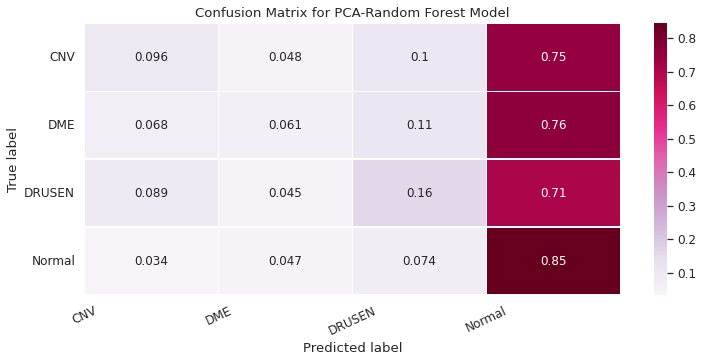

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(ptest_label, prf_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(12,5))
sns.set(font_scale=1.1)
sns.heatmap(matrix, annot=True, annot_kws={'size':12},
            cmap=plt.cm.PuRd, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for PCA-Random Forest Model')
plt.show()

In [ ]:
ppval = pca.transform(pval_data)


In [ ]:
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score

cv = RepeatedKFold(n_splits=10, n_repeats=10, random_state=10)
scores = cross_val_score(rforest, pval_data, pval_label, scoring='accuracy', cv=cv)


In [ ]:
print(scores)

[0.25       0.25       0.         0.66666667 0.33333333 0.
 0.66666667 0.66666667 0.66666667 0.66666667 0.         0.75
 0.         0.66666667 0.33333333 0.66666667 0.33333333 0.33333333
 0.33333333 0.33333333 0.25       0.25       0.66666667 0.66666667
 0.33333333 0.         0.66666667 0.66666667 0.         1.
 0.25       0.25       0.         0.33333333 0.33333333 0.66666667
 1.         0.         0.66666667 0.33333333 0.25       0.5
 0.         0.33333333 0.33333333 0.         0.33333333 0.66666667
 0.33333333 0.33333333 0.25       0.25       0.33333333 0.33333333
 0.66666667 0.66666667 0.33333333 0.33333333 0.33333333 0.33333333
 0.25       0.75       0.         0.33333333 0.         0.66666667
 0.33333333 0.33333333 0.33333333 0.33333333 0.25       0.25
 0.66666667 0.66666667 0.         0.66666667 0.66666667 0.66666667
 0.33333333 0.33333333 0.75       0.75       0.66666667 0.66666667
 0.33333333 0.33333333 0.33333333 0.         0.33333333 0.66666667
 0.5        0.5        0.     

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, pval_data,pval_label, cv=5)
np.average(scores)
np.mean(scores)

0.4142857142857143

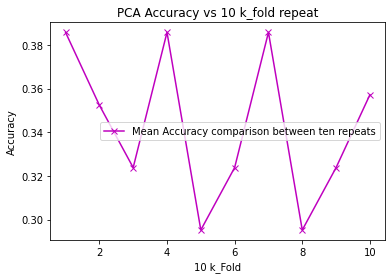

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=5, random_state=10, shuffle=True)
	scores = cross_val_score(rforest, pval_data, pval_label, scoring='accuracy', cv=cv)
	results.append(np.mean(scores))
 
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('PCA Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

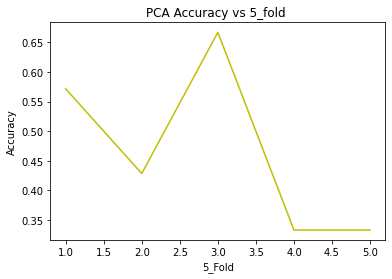

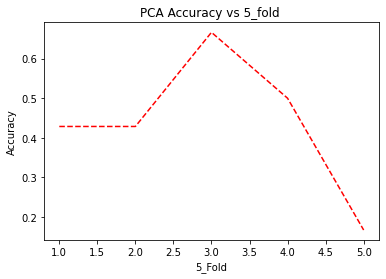

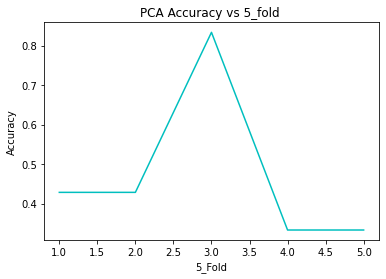

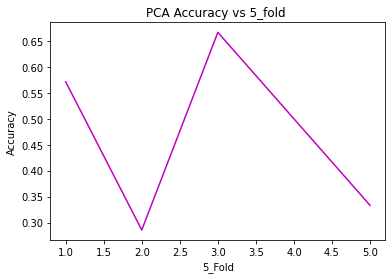

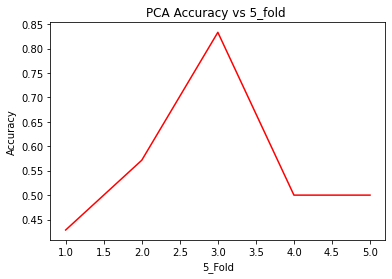

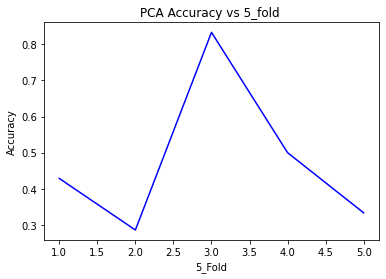

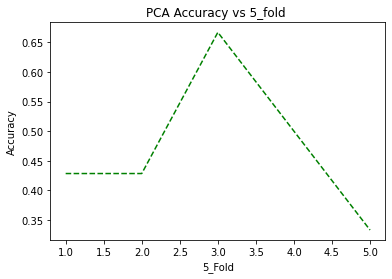

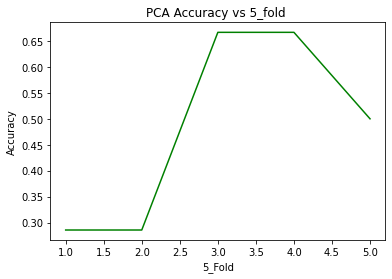

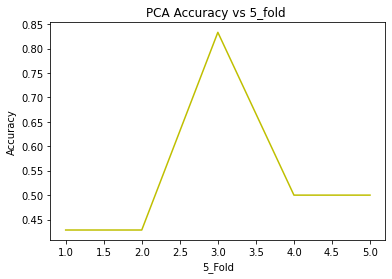

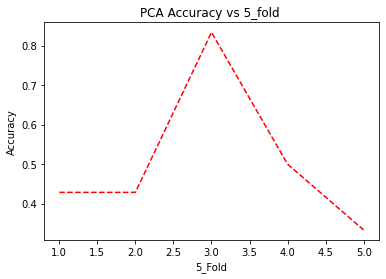

No handles with labels found to put in legend.


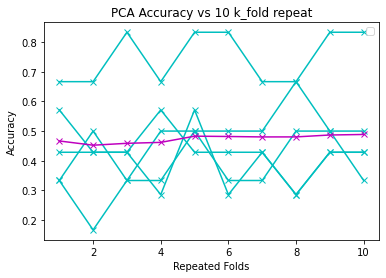

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, pval_data, pval_label, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('PCA Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('PCA Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(model, pval_data, pval_label, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())


> folds=1, accuracy=0.438 (0.333,0.667)
> folds=2, accuracy=0.495 (0.333,0.714)
> folds=3, accuracy=0.443 (0.286,0.833)
> folds=4, accuracy=0.505 (0.333,0.833)
> folds=5, accuracy=0.543 (0.286,0.833)
> folds=6, accuracy=0.505 (0.333,0.667)
> folds=7, accuracy=0.476 (0.286,0.833)
> folds=8, accuracy=0.500 (0.286,0.714)
> folds=9, accuracy=0.471 (0.167,0.667)
> folds=10, accuracy=0.438 (0.167,0.667)


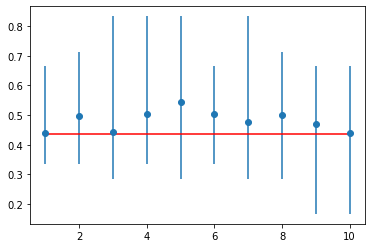

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(ptest_label, prf_pred)

0.29

In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

prf1 = RandomForestClassifier()
prf1.fit(pval_data, pval_label)
prf_score = prf1.predict_proba(pval_data)

#Binarize the output
prf_bin = label_binarize(pval_label, classes=[1, 2, 3, 4])
n_classes = prf_bin.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(prf_bin[:, i], prf_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


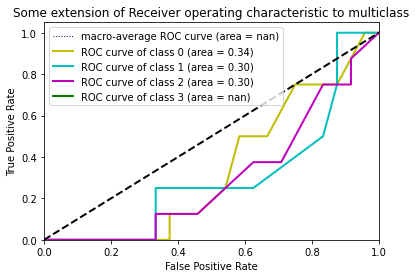

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=1,
)

colors = cycle(['y','c', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="upper left")
plt.show()

In [ ]:
!pip install -q scalene


In [ ]:
%load_ext scalene

In [ ]:
$ scalene linearmodel.py --html >> linearmodel-scalene.html


In [ ]:
scalene <yourapp.py>


In [ ]:
from scalene import scalene_profiler

# Turn profiling on
scalene_profiler.start()

# Turn profiling off
scalene_profiler.stop()

In [ ]:
@profile
def slow_function():
    import time
    time.sleep(3)

In [ ]:
!pip -q install shap

     |████████████████████████████████| 564 kB 5.5 MB/s 


In [ ]:
# import shap library
import shap

# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(rforest)
shap_values = explainer.shap_values(pval_data)

# visualize the first prediction's explanation 
shap.initjs()
#shap.force_plot(explainer.expected_value, np.array(shap_values)[0,:], np.array(pval_data)[0,:])
shap.force_plot(explainer.expected_value[0], shap_values[0])

NameError: ignored

In [ ]:
features_names[shap_values.argmin()]  # the index 8 -> Capital Gain
features_names[shap_values.argmax()] 

In [ ]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, pval_data)

NameError: ignored

In [ ]:
shap_values = shap.TreeExplainer(rforest).shap_values(pval_data)
shap.summary_plot(shap_values, pval_data, plot_type="bar")

NameError: ignored

In [ ]:
shap.summary_plot(shap_values, pval_data)

NameError: ignored

## Feature Selection using SVM

In [ ]:
# to calculate memory
!pip install -q scalene

     |████████████████████████████████| 588 kB 9.9 MB/s 
     |████████████████████████████████| 229 kB 33.5 MB/s 
     |████████████████████████████████| 51 kB 6.4 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.0.0 which is incompatible.


In [ ]:
scalene <yourapp.py>
%load_ext scalene


In [ ]:
$ scalene linearmodel.py --html >> linearmodel-scalene.html

In [ ]:
import math

n = 150
#number_of_examples = len(train_batches.filenames)
number_generator = math.ceil(2250 / (1.0 * n)) 
#number_generator = round((2250 / (1.0 * n)), 2)

# 1.0 above is to skip integer division

strain_label = []
strain_data = []

for i in range(0,int(number_generator)):
    strain_label.extend(np.array(train_generator1[i][1]))
    strain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
strain_label = np.array(strain_label)
strain_data = np.array(strain_data)

In [ ]:
np.array(strain_data).shape

(2250, 224, 224, 3)

In [ ]:
strain_data = strain_data.reshape([2250, 224*224*3])

In [ ]:

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(750 / (1.0 * n)) 
#number_generator = round((750 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

stest_label = []
stest_data = []

for i in range(0,int(number_generator)):
    stest_label.extend(np.array(test_generator1[i][1]))
    stest_data.extend(np.array(test_generator1[i][0]))


In [ ]:
stest_label = np.array(stest_label)
stest_data = np.array(stest_data)

In [ ]:
stest_label.shape

(750,)

In [ ]:
stest_data = stest_data.reshape([750, 224*224*3])

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(300 / (1.0 * n)) 
#number_generator = round((300 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

sval_label1 = []
sval_data1 = []

for i in range(0,int(number_generator)):
    sval_label1.extend(np.array(val_generator1[i][1]))
    sval_data1.extend(np.array(val_generator1[i][0]))


In [ ]:
sval_label = np.array(sval_label1)
sval_data = np.array(sval_data1)

In [ ]:
sval_data.shape

(300, 224, 224, 3)

In [ ]:
sval_data = sval_data.reshape (300, 224*224*3)

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
#number_generator = math.ceil(500 / (1.0 * n)) 
number_generator = round((500 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

sval_label2 = []
sval_data2 = []

for i in range(0,int(number_generator)):
    sval_label2.extend(np.array(val_generator1[i][1]))
    sval_data2.extend(np.array(val_generator1[i][0]))


In [ ]:
svalcv_label = np.array(sval_label2)
svalcv_data = np.array(sval_data2)

In [ ]:
svalcv_data.shape

(450, 224, 224, 3)

In [ ]:
svalcv_data = svalcv_data.reshape (450, 224*224*3)

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# C is the penalty parameter of the error term. 
# the gamma parameter defines how far the influence of a single training example reaches

parameters = {'kernel':('linear', 'rbf'), 'C':[1, 10], 'gamma': [1, 0.01]}
svc = SVC()
grid = GridSearchCV(svc, parameters)
grid.fit(svalcv_data, svalcv_label)

#GridSearchCV(estimator=SVC(),param_grid={'C': [1, 10], 'kernel': ('linear', 'rbf')})


In [ ]:
grid.best_params_

{'C': 1, 'gamma': 1, 'kernel': 'linear'}

In [ ]:
from sklearn.svm import SVC

svc = SVC(kernel='linear', gamma=1, C=1, random_state=10, class_weight='balanced')
#svc.fit(strain_data ,strain_label, class_weight=class_weights)


In [ ]:
from sklearn.svm import SVC

svc = SVC(random_state=10, class_weight='balanced')
#svc.fit(strain_data ,strain_label, class_weight=class_weights)


In [ ]:
from sklearn.utils import compute_class_weight
from sklearn.utils import class_weight

class_weights = class_weight.compute_class_weight(class_weight ='balanced', classes=np.unique(strain_label), y=np.array(strain_label))

class_weights = dict(zip(np.unique(strain_label), class_weights))

class_weights


{0.0: 1.2096774193548387,
 1.0: 1.358695652173913,
 2.0: 1.2417218543046358,
 3.0: 0.6127450980392157}

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
scores = cross_val_score(svc, svalcv_data, svalcv_label, cv=cv)
np.average(scores)
np.mean(scores)

0.4755555555555555

In [ ]:
scores

array([0.46666667, 0.6       , 0.46666667, 0.46666667, 0.36666667,
       0.53333333, 0.53333333, 0.43333333, 0.36666667, 0.46666667,
       0.53333333, 0.4       , 0.36666667, 0.5       , 0.63333333])

In [ ]:
!pip install -q -U scalene

     |████████████████████████████████| 588 kB 5.3 MB/s 
     |████████████████████████████████| 229 kB 49.5 MB/s 
     |████████████████████████████████| 51 kB 6.0 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.0.0 which is incompatible.


In [ ]:
import pickle
import time
#import scalene

In [ ]:
#from scalene import scalene_profiler


In [ ]:
start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


svc.fit(strain_data, strain_label)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 2139.2229389999998 duration2= 1109.5825235843658


In [ ]:
print(scalene.scalene_statistics)
print(scalene.scalene_output)

<module 'scalene.scalene_statistics' from '/usr/local/lib/python3.7/dist-packages/scalene/scalene_statistics.py'>
<module 'scalene.scalene_output' from '/usr/local/lib/python3.7/dist-packages/scalene/scalene_output.py'>


In [ ]:

# save the model to disk
filename = '/content/drive/MyDrive/OCT2017_2/svc_model.sav'
pickle.dump(svc, open(filename, 'wb'))
 

In [ ]:

# save the model to disk
filename = '/content/drive/MyDrive/OCT2017_2/svc_grd.sav'
pickle.dump(svc, open(filename, 'wb'))
 

In [ ]:
svc_pred = svc.predict(stest_data)

In [ ]:
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(stest_data, stest_label)
print(result)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(stest_label, svc_pred)


0.2906666666666667

In [ ]:
confusion_matrix(stest_label, svc_pred)


array([[46, 29, 31, 79],
       [32, 39, 27, 87],
       [43, 29, 38, 82],
       [34, 36, 23, 95]])

In [ ]:
tn, fp, fn, tp = confusion_matrix(stest_label, svc_pred)
svc_specificity = tn / (tn+fp)
svc_sensitivity = tp / (tp+fn)

In [ ]:
svc_specificity 

array([0.58974359, 0.42647059, 0.53448276, 0.47590361])

In [ ]:
svc_sensitivity 

array([0.44155844, 0.55384615, 0.37704918, 0.53672316])

In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

svc1 = SVC(probability = True, class_weight='balanced')
svc1.fit(stest_data, stest_label)
sv_score = svc1.predict_proba(sval_data)

#Binarize the output
sv_bin = label_binarize(sval_label, classes=[1, 2, 3, 4])
n_classes = sv_bin.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(sv_bin[:, i], sv_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


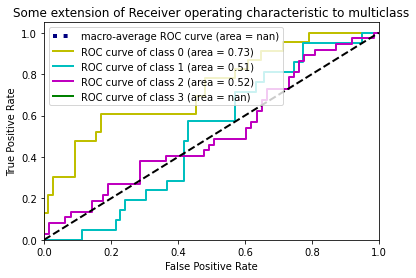

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['y','c', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="upper left")
plt.show()

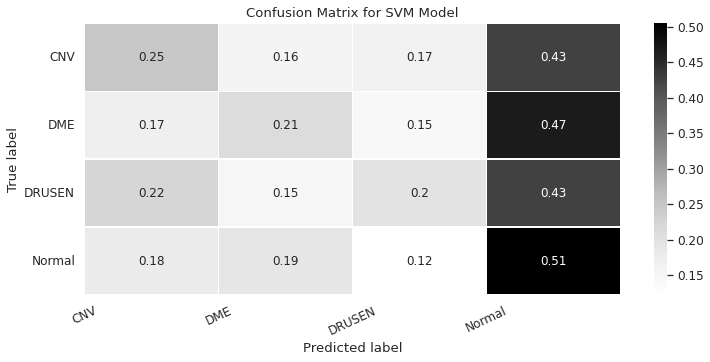

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(stest_label, svc_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(12,5))
sns.set(font_scale=1.1)
sns.heatmap(matrix, annot=True, annot_kws={'size':12},
            cmap=plt.cm.Greys, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for SVM Model')
plt.show()

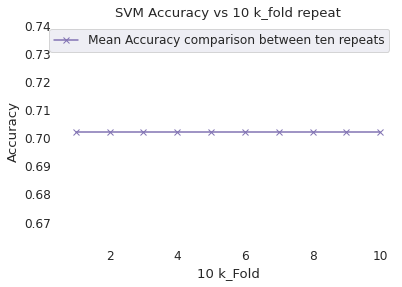

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	svc_scores = cross_val_score(svc, svalcv_data, svalcv_label, scoring='accuracy', cv=cv)
	results.append(np.mean(svc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('SVM Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

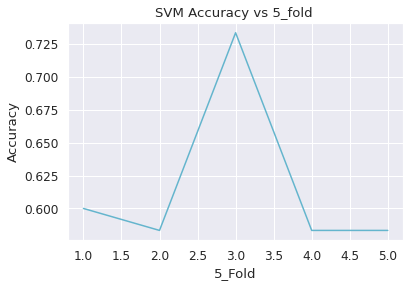

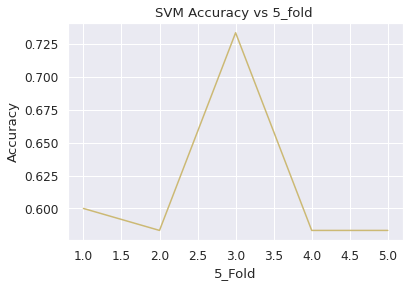

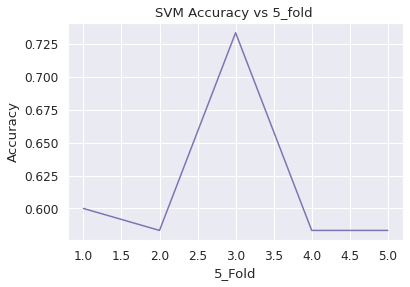

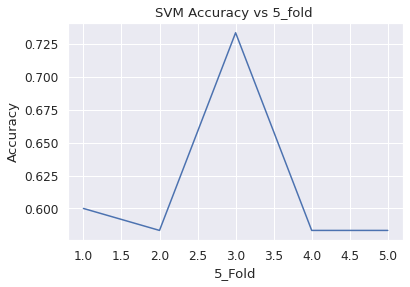

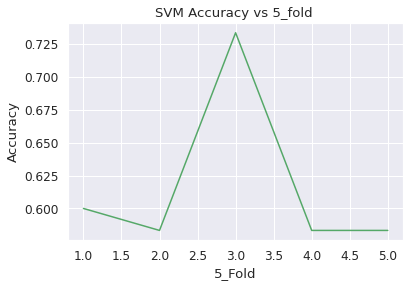

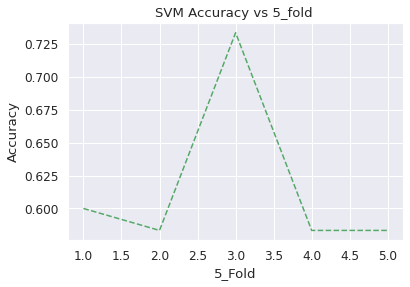

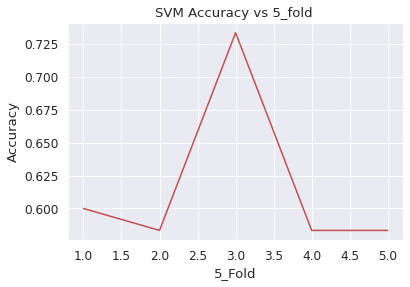

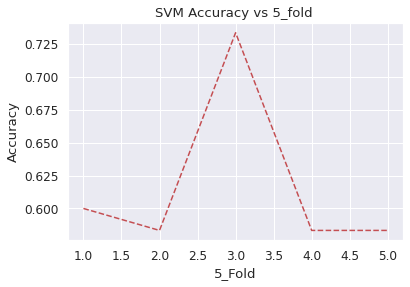

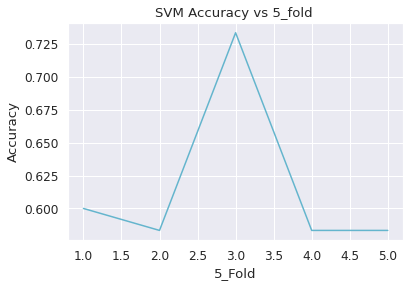

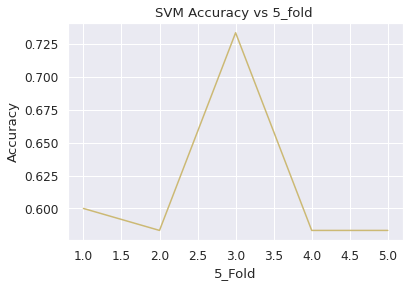

No handles with labels found to put in legend.


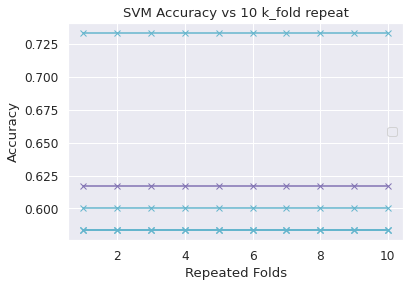

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(svc, sval_data, sval_label, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('SVM Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('SVM Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(svc, sval_data, sval_label, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(svc,LeaveOneOut())


> folds=1, accuracy=0.617 (0.583,0.733)
> folds=2, accuracy=0.617 (0.583,0.733)
> folds=3, accuracy=0.617 (0.583,0.733)
> folds=4, accuracy=0.617 (0.583,0.733)
> folds=5, accuracy=0.617 (0.583,0.733)
> folds=6, accuracy=0.617 (0.583,0.733)
> folds=7, accuracy=0.617 (0.583,0.733)
> folds=8, accuracy=0.617 (0.583,0.733)
> folds=9, accuracy=0.617 (0.583,0.733)
> folds=10, accuracy=0.617 (0.583,0.733)


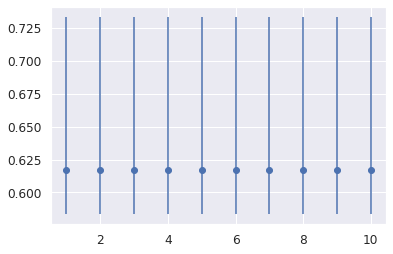

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(svc, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

In [ ]:
!pip install -q scikit-plot

In [ ]:
import scikitplot as skplt
import matplotlib.pyplot as plt

y_true = stest_label
y_probas = svc_pred
skplt.metrics.plot_roc_curve(y_true, y_probas)
plt.show()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=FutureWarning)


IndexError: ignored

In [ ]:
import seaborn as sns
from matplotlib import cm


# Get and reshape confusion matrix data
matrix = confusion_matrix(stest_label, svc_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greys, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for SVC Model')
plt.show()

In [ ]:
print(classification_report(stest_label, svc_pred))


              precision    recall  f1-score   support

         0.0       0.31      0.36      0.33       141
         1.0       0.53      0.07      0.12       151
         2.0       0.30      0.54      0.39       153
         3.0       0.38      0.36      0.37       155

    accuracy                           0.33       600
   macro avg       0.38      0.33      0.30       600
weighted avg       0.38      0.33      0.30       600



## Feature selection  HOG

In [ ]:
!pip install -q scikit-image

In [ ]:
import skimage

(496, 512)


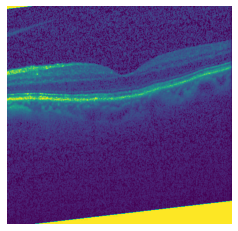

In [ ]:
from skimage.io import imread
from skimage.transform import resize
from skimage.feature import hog
from skimage import exposure
import matplotlib.pyplot as plt
from skimage.util import crop


# reading the image
img = imageio.imread('/content/drive/MyDrive/train/NORMAL/NORMAL-1001666-1.jpeg')
plt.axis("off")
plt.imshow(img)
print(img.shape)


(500, 600)


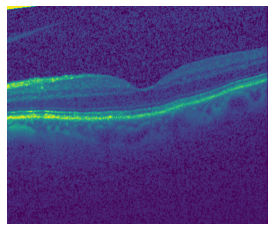

In [ ]:
resized_img = resize(img, (150*4, 150*4))
resized_img = crop(resized_img, ((0,100), (0, 0)))
#resized_img = resized_img.astype(np.uint8)
#gray_img = resized_img/255
plt.axis("off")
plt.imshow(resized_img)
print(resized_img.shape)

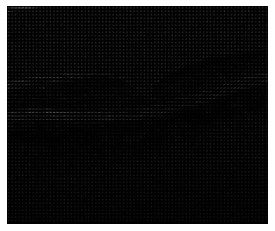

In [ ]:
fd, hog_image = hog(resized_img,  orientations=9, pixels_per_cell=(50, 50), cells_per_block=(25, 25), visualize=True)
plt.axis("off")
plt.imshow(hog_image, cmap="gray")


## 2- Feature Selection Deep Learning

## a-Feature Selection Using CNN

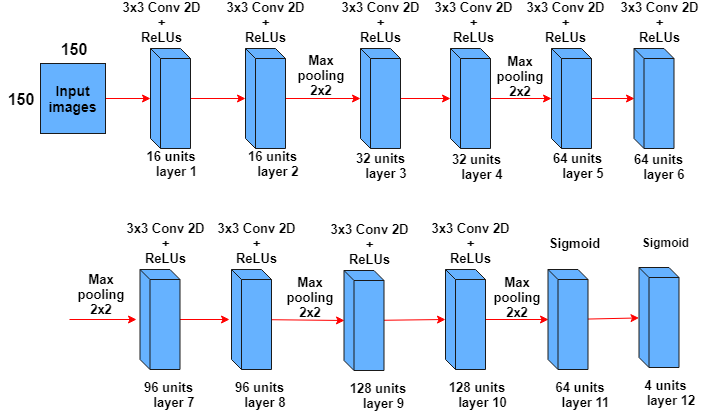

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import numpy as np
from tensorflow.keras.optimizers import SGD

In [ ]:
kcnn = Sequential()
kcnn.add(Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)))
kcnn.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Conv2D(4, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
kcnn.add(Dropout(0.2))


In [ ]:
kcnn.add(Flatten())
kcnn.add(Dense(4, activation='relu', kernel_initializer='he_uniform'))
kcnn.add(Dense(4, activation='softmax'))

In [ ]:
kcnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 222, 222, 16)      448       
                                                                 
 conv2d_13 (Conv2D)          (None, 222, 222, 16)      2320      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 111, 111, 16)     0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 111, 111, 32)      4640      
                                                                 
 conv2d_15 (Conv2D)          (None, 111, 111, 32)      9248      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 55, 55, 32)       0         
 2D)                                                  

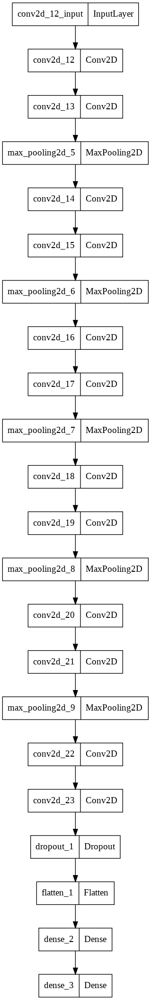

In [ ]:
plot_model(kcnn, to_file='kcnn.png')

In [ ]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

    train_path = data_dir+'/train'
    val_path = data_dir+'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN' ,'NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [ ]:
train_batches, val_batches, test_batches = Kermany2018(150, 224, '/content/drive/MyDrive/OCT2017-Data')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 150
epoch = 10
val_size = 501

In [ ]:
type(train_batches.labels)

numpy.ndarray

In [ ]:
train_batches.labels.shape

(7752,)

In [ ]:
train_data = [b for b in d for d,_ in train_batches]

train_data = np.array(train_data)

In [ ]:
#train_data = []

#for d, _ in train_batches:

  #for b in d:
    
    #train_data.append(b)

#train_data = np.array(train_data)


In [ ]:
import math

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(2250 / (1.0 * n)) 
# 1.0 above is to skip integer division



ctrain_label = []
ctrain_data = []

for i in range(0,int(number_generator)):
    ctrain_label.extend(np.array(train_generator1[i][1]))
    ctrain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
ctrain_label = np.array(ctrain_label)
ctrain_data = np.array(ctrain_data)

In [ ]:
ctrain

In [ ]:
ctrain_label.shape


(2250,)

In [ ]:
from tensorflow.keras import optimizers

opt0 = tf.keras.optimizers.RMSprop(learning_rate=0.01)
opt1 = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.1)
opt2 = tf.keras.optimizers.Adam(learning_rate=0.1)

#momentum=0.9

In [ ]:
kcnn.compile(optimizer=opt1, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
import time 

In [ ]:
def clf_model(model):
  model = model
  model.compile(optimizer=opt1, loss='categorical_crossentropy', metrics=['accuracy'])
  return model

In [ ]:
clf = KerasClassifier(build_fn= lambda:clf_model(kcnn), verbose=0)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  """Entry point for launching an IPython kernel.


In [ ]:
#init = ['glorot_uniform', 'normal', 'uniform']
#n_iter = 15
#batches = np.array([150, 50])
epochs = [10, 5]

#param_grid = dict(batch_size=batches, epochs=epochs)

param_grid = dict(epochs=epochs)

grid = GridSearchCV(estimator=clf, param_grid=param_grid, cv=3)
grid_result = grid.fit(ctrain_data, ctrain_label)


#param_grid = dict(epochs=epochs, batch_size=batches)

#random_search = RandomizedSearchCV(estimator=clf, param_distributions=param_grid, n_iter=4)
#random_search.fit(ctrain_data, ctrain_label)

NameError: ignored

In [ ]:
grid.best_params_

In [ ]:
print("Best: %f using %s" % (random_search.best_score_, random_search.best_params_))
means = random_search.cv_results_['mean_test_score']
stds = random_search.cv_results_['std_test_score']
params = random_search.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017_2/kcnn-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [ ]:
kcnn.compile(optimizer=opt1, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
import time
start1 = time.clock()
start2 = time.time()

history = kcnn.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=epoch, class_weight=class_weight, callbacks=callbacks_list, verbose=1)

end1 = time.clock()
end2 = time.time()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  


Epoch 1/10
51/51 [==============================] - 632s 13s/step - loss: 1.4051 - accuracy: 0.2644 - val_loss: 1.3713 - val_accuracy: 0.4072
Epoch 2/10
51/51 [==============================] - 112s 2s/step - loss: 1.3946 - accuracy: 0.2692 - val_loss: 1.3782 - val_accuracy: 0.3094
Epoch 3/10
51/51 [==============================] - 113s 2s/step - loss: 1.3899 - accuracy: 0.2596 - val_loss: 1.3848 - val_accuracy: 0.2036
Epoch 4/10
51/51 [==============================] - 113s 2s/step - loss: 1.3887 - accuracy: 0.2369 - val_loss: 1.3848 - val_accuracy: 0.2036
Epoch 5/10
51/51 [==============================] - 112s 2s/step - loss: 1.3876 - accuracy: 0.2331 - val_loss: 1.3849 - val_accuracy: 0.2036


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  import sys


In [ ]:
best_epoch_model = np.argmin(history.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, history.history['val_loss'][best_epoch_model], history.history['val_accuracy'][best_epoch_model]))

best epoch:0 validation loss:1.371 validation acc:0.407


In [ ]:
from keras.callbacks import ModelCheckpoint

earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

filepath="/content/drive/MyDrive/OCT2017-Data/kcnn-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [ ]:
kcnn.compile(optimizer=opt2, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start= time.clock()

a_history = kcnn.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=epoch, class_weight=class_weight, callbacks=callbacks_list, verbose=1)

end=time.clock()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.


Epoch 1/10
155/155 [==============================] - 1071s 7s/step - loss: 1.3924 - accuracy: 0.2435 - val_loss: 1.3618 - val_accuracy: 0.4072
Epoch 2/10
155/155 [==============================] - 1064s 7s/step - loss: 1.3914 - accuracy: 0.2355 - val_loss: 1.3684 - val_accuracy: 0.4072
Epoch 3/10
155/155 [==============================] - 1066s 7s/step - loss: 1.3913 - accuracy: 0.2314 - val_loss: 1.3890 - val_accuracy: 0.1916
Epoch 4/10
155/155 [==============================] - 1067s 7s/step - loss: 1.3931 - accuracy: 0.2453 - val_loss: 1.3624 - val_accuracy: 0.4072
Epoch 5/10
155/155 [==============================] - 1070s 7s/step - loss: 1.3908 - accuracy: 0.2832 - val_loss: 1.3652 - val_accuracy: 0.4072
Epoch 6/10
155/155 [==============================] - 1087s 7s/step - loss: 1.3932 - accuracy: 0.2386 - val_loss: 1.4140 - val_accuracy: 0.1916


KeyboardInterrupt: ignored

In [ ]:
kcnn.compile(optimizer=opt0, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
start1 = time.clock()
start2 = time.time()

a_history = kcnn.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=epoch, class_weight=class_weight, callbacks=callbacks_list, verbose=1)

end1 = time.clock()
end2 = time.time()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.


Epoch 1/10
51/51 [==============================] - 118s 2s/step - loss: 1.3986 - accuracy: 0.2171 - val_loss: 1.3837 - val_accuracy: 0.4072
Epoch 2/10
51/51 [==============================] - 113s 2s/step - loss: 1.3860 - accuracy: 0.2680 - val_loss: 1.3880 - val_accuracy: 0.1976
Epoch 3/10
51/51 [==============================] - 113s 2s/step - loss: 1.3866 - accuracy: 0.2399 - val_loss: 1.3902 - val_accuracy: 0.1916
Epoch 4/10
51/51 [==============================] - 113s 2s/step - loss: 1.3864 - accuracy: 0.2156 - val_loss: 1.3886 - val_accuracy: 0.1976
Epoch 5/10
51/51 [==============================] - 113s 2s/step - loss: 1.3861 - accuracy: 0.2095 - val_loss: 1.3861 - val_accuracy: 0.1916


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  


In [ ]:
d2= end2 - start2
d1 = end1 - start1

print(d1, d2)

582.321909 659.1192181110382


In [ ]:
!pip -q install memory_profiler

In [ ]:
!pip install psutil # optional dependency for memory profiler to execute fast

In [ ]:
%load_ext  memory_profiler

In [ ]:
%memit fit() # To know how much memory script uses overall.

In [ ]:
from keras.models import model_from_json
from keras.models import load_model

# serialize model to JSON
#  the keras model which is trained is defined as 'model' in this example
kcnn_json = kcnn.to_json()


with open("model_num.json", "w") as json_file:
    json_file.write(kcnn_json)

# serialize weights to HDF5
kcnn.save_weights("/content/drive/MyDrive/OCT2017-Data/kcnn_w.h5")
# creates a HDF5 file 'my_model.h5'
kcnn.save('/content/drive/MyDrive/OCT2017-Data/kcnn.h5')  

In [ ]:
# load json and create model
json_file = open('/content/drive/MyDrive/OCT2017-Data/kcnn_jason.json', 'r')

loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

# load weights into new model
loaded_model.load_weights("/content/drive/MyDrive/OCT2017-Data/kcnn.h5")
print("Loaded model from disk")

loaded_model.save('/content/drive/MyDrive/OCT2017-Data/kcnn.hdf5')
loaded_model=load_model('/content/drive/MyDrive/OCT2017-Data/kcnn.hdf5')

In [ ]:
kcnn.layers[17]._name='conv11'
print(kcnn.layers[17].name)

conv11


In [ ]:
from keras.models import Model

#layer_name = 'conv11'
kcnn_base = Model(inputs=kcnn.input, outputs=kcnn.get_layer('conv11').output)
#kcnn_output = kcnn_base.predict(test_batches)

In [ ]:
def cnn_extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 6, 6, 4))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(224, 224),
      batch_size = batch_size,
      class_mode ='binary')
 

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = kcnn_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [ ]:
batch_size = 150
epoch = 10

In [ ]:
train_featurec, train_labelc = cnn_extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
validation_featurec, validation_labelc = cnn_extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
test_featurec, test_labelc = cnn_extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
train_featurec = np.reshape(train_featurec, (7752, 6 * 6 * 4))
validation_featurec = np.reshape(validation_featurec, (501, 6 * 6 * 4))
test_featurec = np.reshape(test_featurec, (1000, 6 * 6 * 4))

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')


In [ ]:
start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


rforest.fit(train_featurec, train_labelc)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 6.530794000000014 duration2= 6.724521636962891


In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'cnn-forest_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, validation_featurec, validation_labelc, cv=5)
np.average(scores)
np.mean(scores)

0.3292673267326733

In [ ]:
cnr_pred = rforest.predict(test_featurec)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_labelc, cnr_pred)


0.302

In [ ]:
confusion_matrix(test_labelc, cnr_pred)


array([[ 46,  57,  50,  97],
       [ 51,  62,  51,  86],
       [ 40,  46,  68,  96],
       [ 29,  32,  63, 126]])

In [ ]:
tn, fp, fn, tp = confusion_matrix(test_labelc, cnr_pred)
cnn_specificity = tn / (tn+fp)
cnn_sensitivity = tp / (tp+fn)

In [ ]:
cnn_specificity 

array([0.4742268 , 0.4789916 , 0.4950495 , 0.53005464])

In [ ]:
cnn_sensitivity 

array([0.42028986, 0.41025641, 0.48091603, 0.56756757])

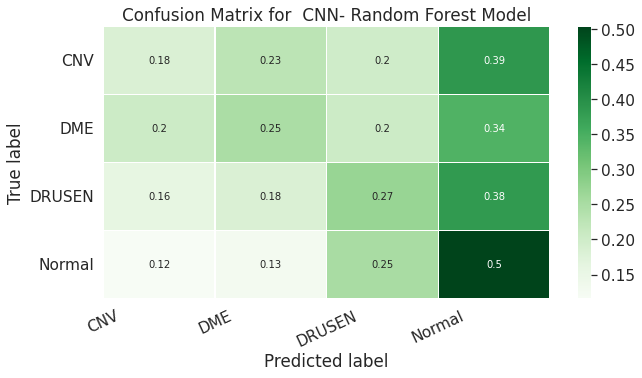

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(test_labelc, cnr_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for  CNN- Random Forest Model')
plt.show()

In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

cn_score = rforest.predict_proba(test_featurec)

#Binarize the output
cn_bin = label_binarize(test_labelc, classes=[1, 2, 3, 4])
n_classes = cn_bin.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(cn_bin[:, i], cn_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


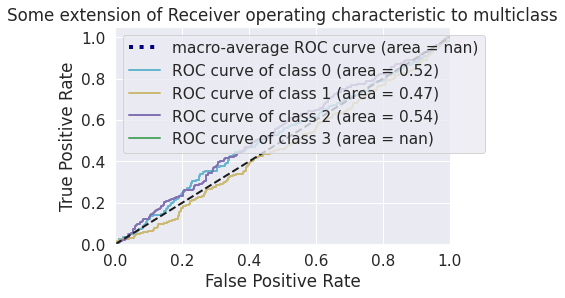

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['c', 'y', 'm' , 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="upper left")
plt.show()

In [ ]:
print(classification_report(test_labelc, cnr_pred))


              precision    recall  f1-score   support

         0.0       0.28      0.18      0.22       250
         1.0       0.31      0.25      0.28       250
         2.0       0.29      0.27      0.28       250
         3.0       0.31      0.50      0.38       250

    accuracy                           0.30      1000
   macro avg       0.30      0.30      0.29      1000
weighted avg       0.30      0.30      0.29      1000



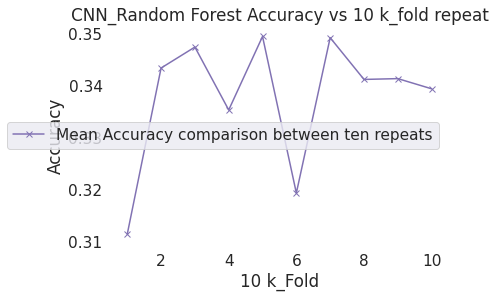

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	rfc_scores = cross_val_score(rforest, validation_featurec, validation_labelc, scoring='accuracy', cv=cv)
	results.append(np.mean(rfc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('CNN_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

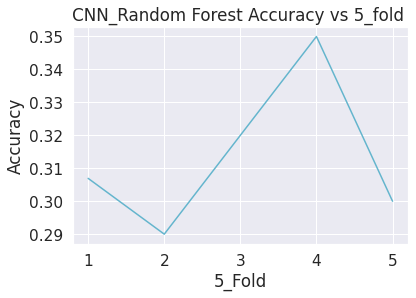

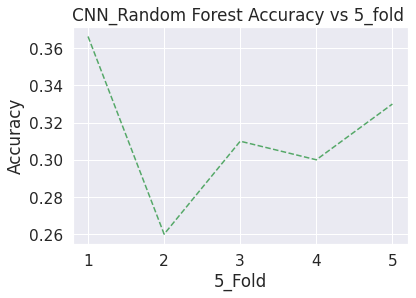

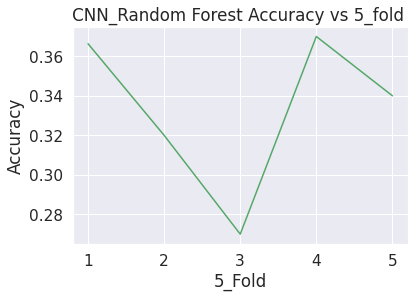

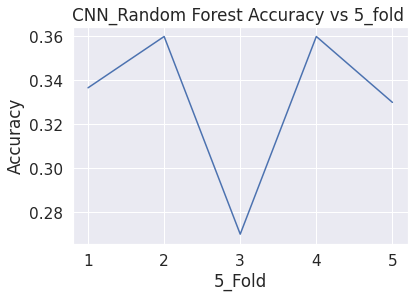

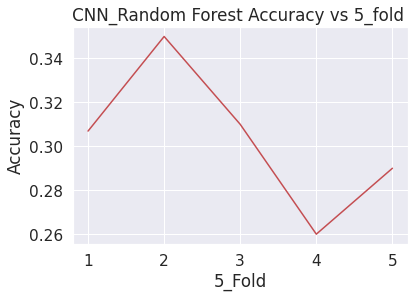

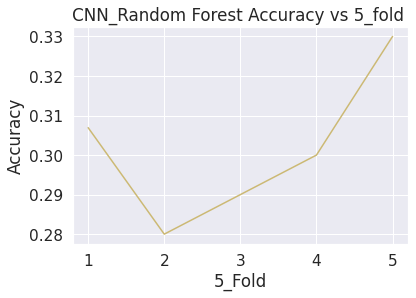

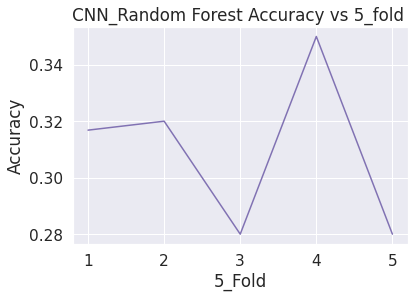

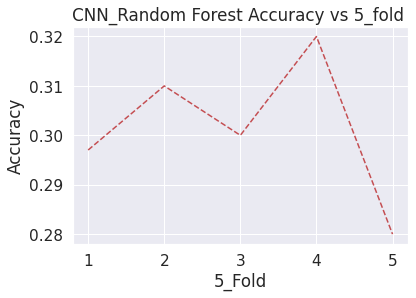

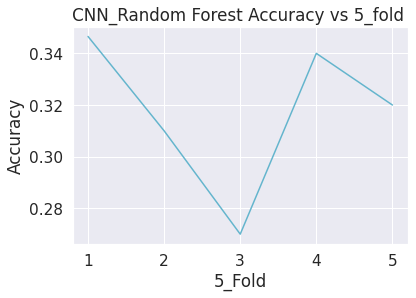

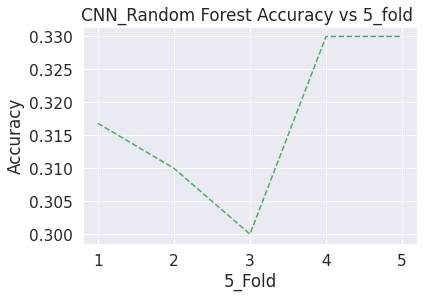

No handles with labels found to put in legend.


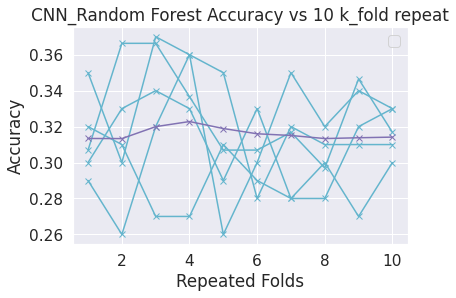

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, validation_featurec, validation_labelc, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('CNN_Random Forest Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('CNN_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(rforest, validation_featurec, validation_labelc, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())


> folds=1, accuracy=0.333 (0.300,0.386)
> folds=2, accuracy=0.339 (0.300,0.366)
> folds=3, accuracy=0.333 (0.310,0.380)
> folds=4, accuracy=0.321 (0.260,0.360)
> folds=5, accuracy=0.313 (0.260,0.340)
> folds=6, accuracy=0.329 (0.310,0.356)
> folds=7, accuracy=0.319 (0.290,0.350)
> folds=8, accuracy=0.307 (0.290,0.330)
> folds=9, accuracy=0.329 (0.280,0.360)
> folds=10, accuracy=0.311 (0.280,0.350)


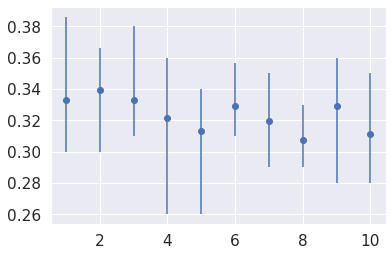

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

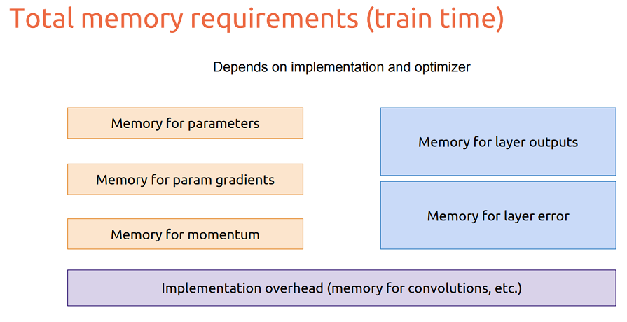

## <font color='blue'> Feature Selection Using Pretrained Networks </font>



## <font color='purple'> Feature Selection Using VGGNet </font>


In [ ]:

from keras.applications.vgg16 import VGG16
vgg_16 = VGG16()

553476096/553467096 [==============================] - 10s 0us/step


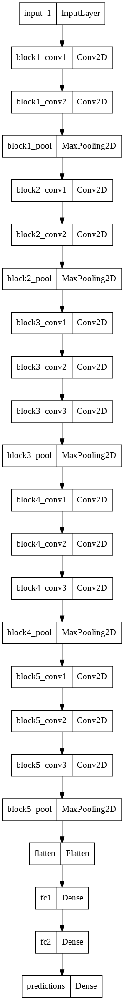

In [ ]:
from keras.utils.vis_utils import plot_model

plot_model(vgg_16, to_file='vgg.png')

In [ ]:
# load the model

print(vgg_16.summary())

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 150
epoch = 10
val_size = 501



In [ ]:
vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in vgg16_base.layers:
            layer.trainable = False

vgg16_base.summary()

58900480/58889256 [==============================] - 1s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
def extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 7, 7, 512))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(224, 224),
      batch_size=batch_size,
      class_mode='binary')
 

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = vgg16_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [ ]:
train_features, train_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
val_features, val_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
test_features, test_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
train_features = np.reshape(train_features, (7752, 7 * 7 * 512))
validation_features = np.reshape(val_features, (501, 7 * 7 * 512))
test_features = np.reshape(test_features, (1000, 7* 7 * 512))

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')


In [ ]:
start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


rforest.fit(train_features, train_labels)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 71.7302850000001 duration2= 73.51196956634521


In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'vgg-forest_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, validation_features, val_labels, cv=5)
np.average(scores)
np.mean(scores)

0.554930693069307

In [ ]:
vr_pred = rforest.predict(test_features)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_labels, vr_pred)


0.714

In [ ]:
confusion_matrix(test_labels, vr_pred)


array([[226,   9,  13,   2],
       [ 17, 111,  13, 109],
       [ 99,   2, 131,  18],
       [  0,   4,   0, 246]])

In [ ]:
tn, fp, fn, tp = confusion_matrix(test_labels, vr_pred)
vg_specificity = tn / (tn+fp)
vg_sensitivity = tp / (tp+fn)

In [ ]:
vg_specificity 

array([0.93004115, 0.075     , 0.5       , 0.01801802])

In [ ]:
vg_sensitivity 

array([0.        , 0.66666667, 0.        , 0.93181818])

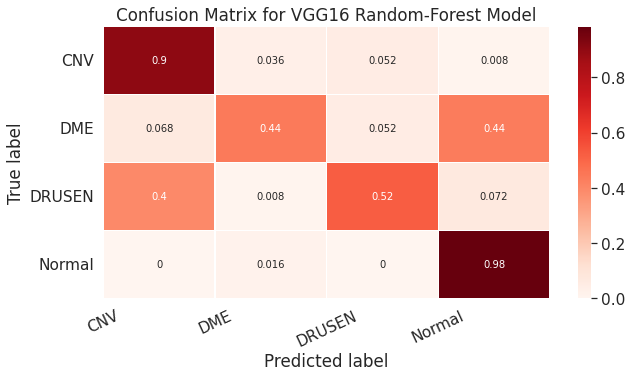

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(test_labels, vr_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Reds, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for VGG16 Random-Forest Model')
plt.show()

In [ ]:
print(classification_report(test_labels, vr_pred))


              precision    recall  f1-score   support

         0.0       0.66      0.90      0.76       250
         1.0       0.88      0.44      0.59       250
         2.0       0.83      0.52      0.64       250
         3.0       0.66      0.98      0.79       250

    accuracy                           0.71      1000
   macro avg       0.76      0.71      0.70      1000
weighted avg       0.76      0.71      0.70      1000



In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize


vg_score = rforest.predict_proba(test_features)

#Binarize the output
vg_bin = label_binarize(test_labels, classes=[1, 2, 3, 4])
n_classes = vg_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(vg_bin[:, i], vg_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


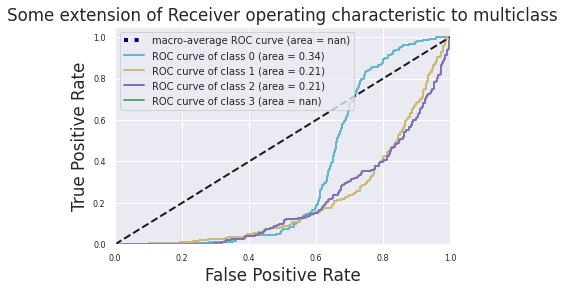

In [ ]:
from cycler import cycle
import matplotlib
import matplotlib.pyplot as plt


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['c', 'y', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )
#ax, fig = plt.subplots(1,1)
#font = {'size': 10}
#matplotlib.rc('font', **font)
#plt.rcParams.update({'font.size': 12})

plt.rc('legend', fontsize=10)

ax.set_facecolor('white')
plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="upper left")
plt.show()

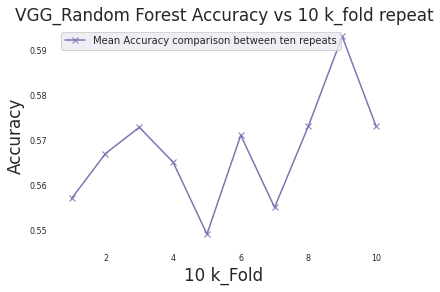

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	rfc_scores = cross_val_score(rforest, validation_features, val_labels, scoring='accuracy', cv=cv)
	results.append(np.mean(rfc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('VGG_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

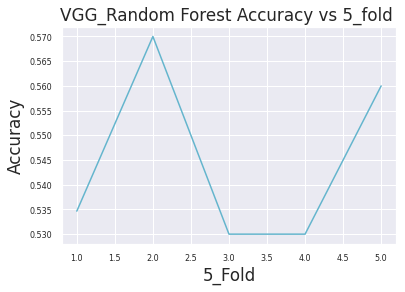

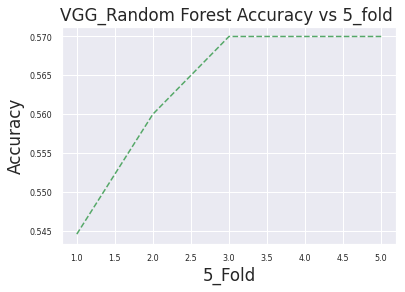

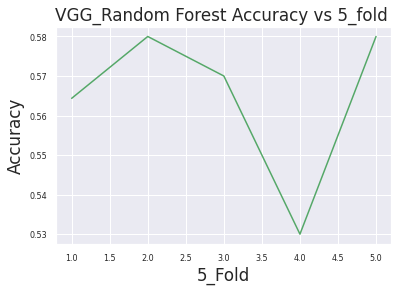

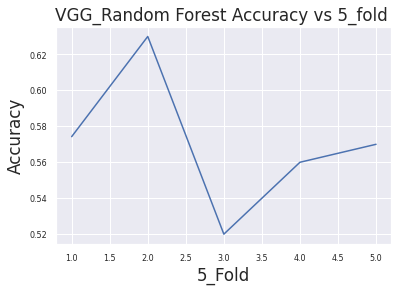

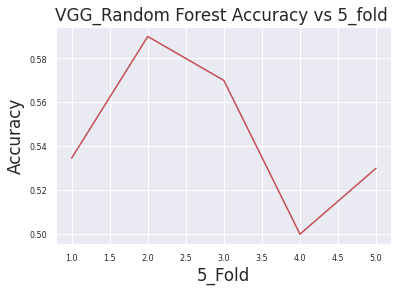

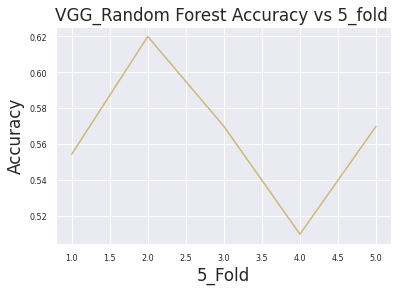

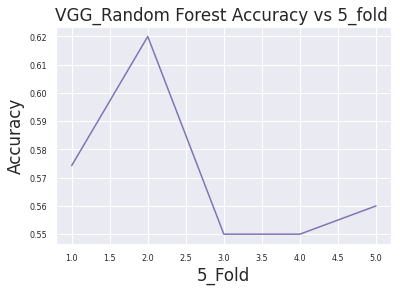

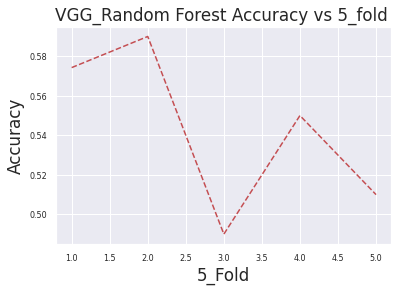

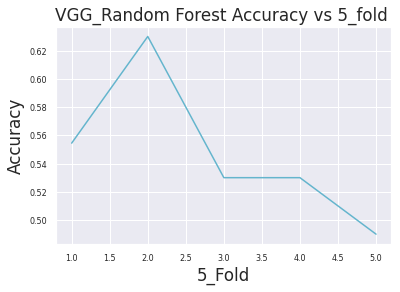

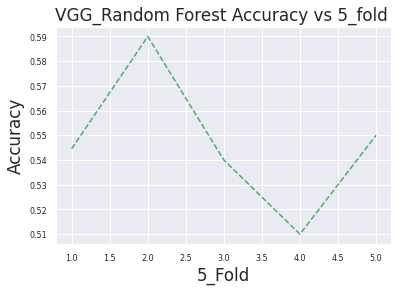

No handles with labels found to put in legend.


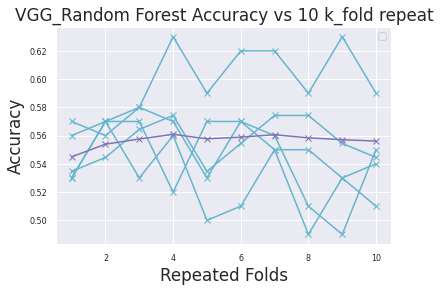

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, validation_features, val_labels, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('VGG_Random Forest Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('VGG_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(rforest, validation_features, val_labels, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())


> folds=1, accuracy=0.555 (0.505,0.610)
> folds=2, accuracy=0.567 (0.540,0.630)
> folds=3, accuracy=0.561 (0.520,0.600)
> folds=4, accuracy=0.563 (0.530,0.610)
> folds=5, accuracy=0.547 (0.480,0.610)
> folds=6, accuracy=0.565 (0.530,0.670)
> folds=7, accuracy=0.561 (0.520,0.590)
> folds=8, accuracy=0.565 (0.540,0.590)
> folds=9, accuracy=0.551 (0.505,0.590)
> folds=10, accuracy=0.555 (0.530,0.590)


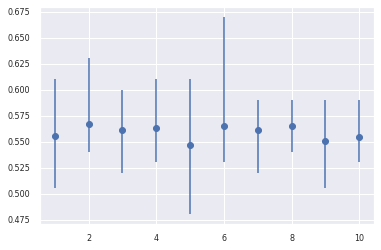

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

## <font color='purple'>Feature Selection Using ResNet</font>

In [ ]:
#from tf.keras.applications.resnet50 import ResNet50

resnet_50 = tf.keras.applications.resnet50.ResNet50()

resnet_50.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [ ]:
resnet50_base = tf.keras.applications.resnet50.ResNet50(weights='imagenet', include_top=False, input_shape=(150,150, 3))
resnet50_base.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 156, 156, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 75, 75, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 75, 75, 64)   256         ['conv1_conv[0][0]']      

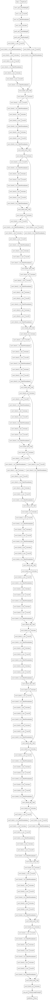

In [ ]:
plot_model(resnet_50, to_file='resnet.png')

In [ ]:
def r_extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 5, 5, 512 * 4))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(150, 150),
      batch_size=batch_size,
      class_mode='binary')

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = resnet50_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 150
epoch = 10
val_size = 501

In [ ]:
train_feature, train_label = r_extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
val_feature, val_label = r_extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
test_feature, test_label = r_extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
np.array(test_feature).shape

(1000, 5, 5, 2048)

In [ ]:
train_feature = np.reshape(train_feature, (7752, 5 * 5 * 2048))
val_feature = np.reshape(val_feature, (501, 5 * 5 * 2048))
test_feature = np.reshape(test_feature, (1000, 5 * 5 * 2048))

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')


In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit rforest.fit(train_feature, train_label)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


peak memory: 8310.91 MiB, increment: 948.78 MiB


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 32.576403 duration2= 34.25620913505554


In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'resnet-forest_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, val_feature, val_label, cv=5)
np.average(scores)
np.mean(scores)

0.45108910891089116

In [ ]:
rrs_pred = rforest.predict(test_feature)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_label, rrs_pred)


0.339

In [ ]:
confusion_matrix(test_label, rrs_pred)


array([[109,  40,  38,  63],
       [ 64,  19,  40, 127],
       [ 38,  25,  54, 133],
       [ 12,  21,  60, 157]])

In [ ]:
tn, fp, fn, tp = confusion_matrix(test_label, rrs_pred)
rs_specificity = tn / (tn+fp)
rs_sensitivity = tp / (tp+fn)

In [ ]:
rs_specificity 

array([0.6300578 , 0.6779661 , 0.48717949, 0.33157895])

In [ ]:
rs_sensitivity 

array([0.24      , 0.45652174, 0.52631579, 0.54137931])

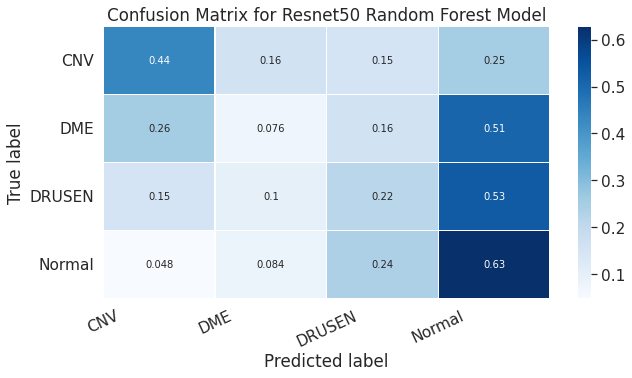

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(test_label, rrs_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Blues, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Resnet50 Random Forest Model')
plt.show()

In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

#test_labelz = test_labelz.reshape(-1,1)
rs_score = rforest.predict_proba(test_feature)

#Binarize the output
rs_bin = label_binarize(test_label, classes=[1, 2, 3, 4])
n_classes = rs_bin.shape[1]

#zf_score = zf_score.reshape(-1,1)
#val_pred  = val_pred.reshape(-1,1)
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(rs_bin[:, i], rs_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
#fpr["micro"], tpr["micro"], _ = metrics.roc_curve(test_labelz.ravel(), rzf_pred.ravel())
#roc_auc["micro"] = metrics.auc(fpr["micro"], tpr["micro"])

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


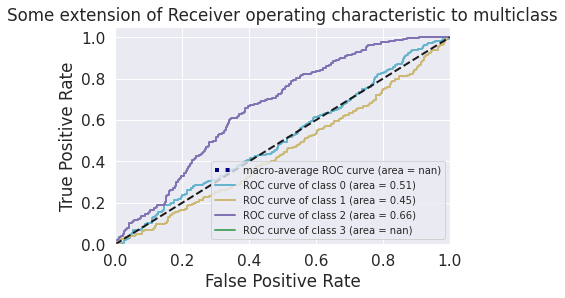

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])

'''# Plot all ROC curves
plt.figure()
plt.plot(
    fpr["micro"],
    tpr["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="deeppink",
    linestyle=":",
    linewidth=4,
)
'''
plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['c', 'y', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )
plt.rc('legend', fontsize=10)
plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="lower right")
plt.show()



In [ ]:
print(classification_report(test_label, rrs_pred))


              precision    recall  f1-score   support

         0.0       0.49      0.44      0.46       250
         1.0       0.18      0.08      0.11       250
         2.0       0.28      0.22      0.24       250
         3.0       0.33      0.63      0.43       250

    accuracy                           0.34      1000
   macro avg       0.32      0.34      0.31      1000
weighted avg       0.32      0.34      0.31      1000



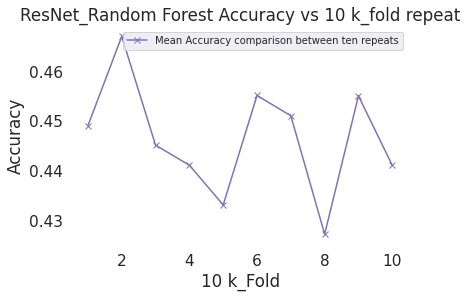

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	rfc_scores = cross_val_score(rforest, val_feature, val_label, scoring='accuracy', cv=cv)
	results.append(np.mean(rfc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('ResNet_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

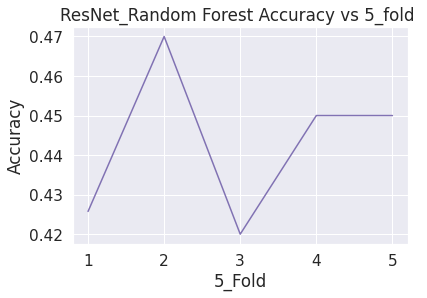

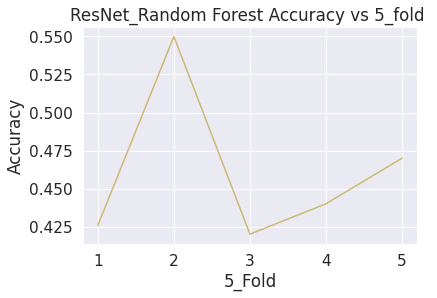

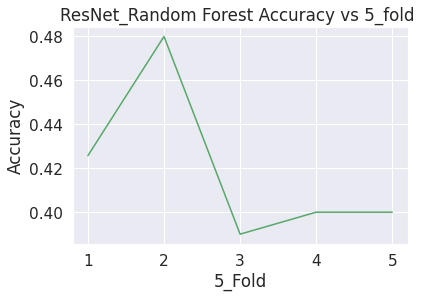

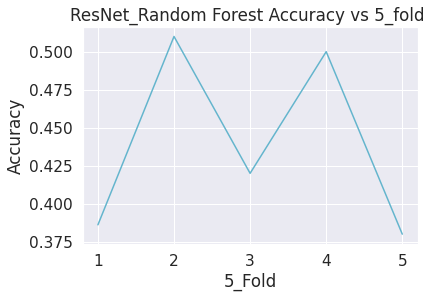

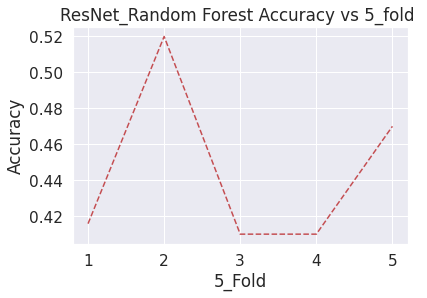

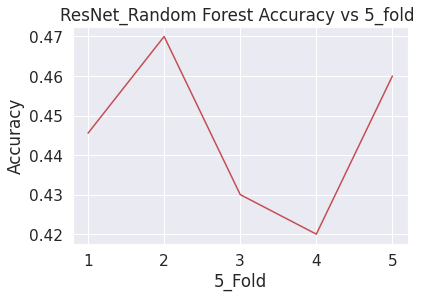

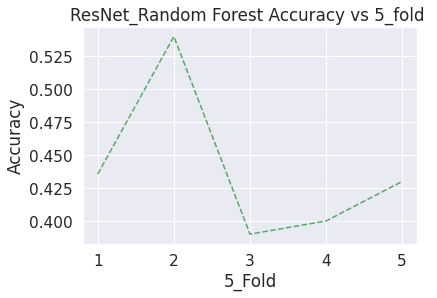

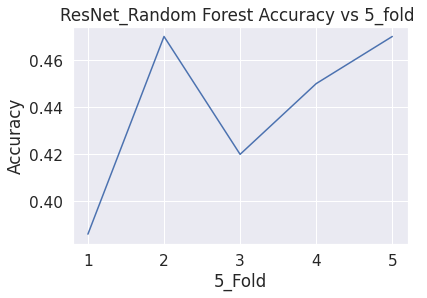

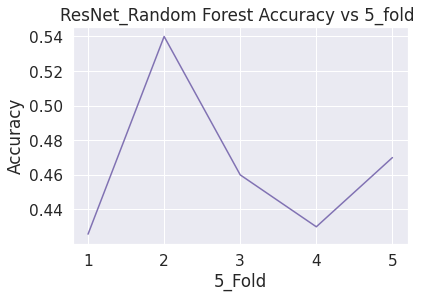

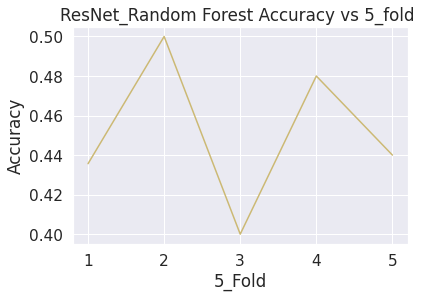

No handles with labels found to put in legend.


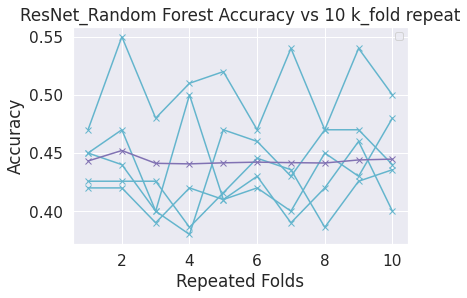

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, val_feature, val_label, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('ResNet_Random Forest Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('ResNet_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(rforest, val_feature, val_label, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())


> folds=1, accuracy=0.427 (0.390,0.490)
> folds=2, accuracy=0.443 (0.380,0.520)
> folds=3, accuracy=0.439 (0.400,0.500)
> folds=4, accuracy=0.461 (0.420,0.520)
> folds=5, accuracy=0.437 (0.420,0.450)
> folds=6, accuracy=0.423 (0.386,0.500)
> folds=7, accuracy=0.427 (0.400,0.470)
> folds=8, accuracy=0.451 (0.410,0.500)
> folds=9, accuracy=0.457 (0.416,0.520)
> folds=10, accuracy=0.441 (0.406,0.490)


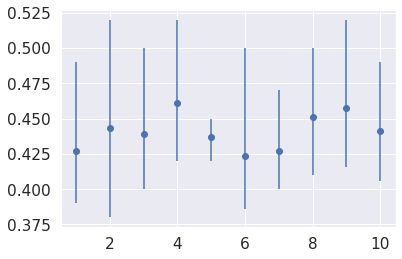

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

## <font color='blue'> Feature Selection Using ZFNet </font>

In [ ]:
#coding=utf-8  
from keras.models import Sequential  
from keras.layers import Dense,Flatten,Dropout  
from keras.layers.convolutional import Conv2D,MaxPooling2D  
from keras.utils.np_utils import to_categorical  
import numpy as np  
seed = 7  
np.random.seed(seed)  
  
zf = Sequential()  
zf.add(Conv2D(96,(7,7),strides=(2,2),input_shape=(224,224,3),padding='valid',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(256,(5,5),strides=(2,2),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(256,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Flatten())  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4,activation='softmax'))  
zf.compile(loss='categorical_crossentropy',optimizer='sgd', metrics=metrics)  
zf.summary()  

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 109, 109, 96)      14208     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 54, 54, 96)       0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 27, 27, 256)       614656    
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 13, 13, 256)      0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 13, 13, 384)       885120    
                                                                 
 conv2d_13 (Conv2D)          (None, 13, 13, 384)      

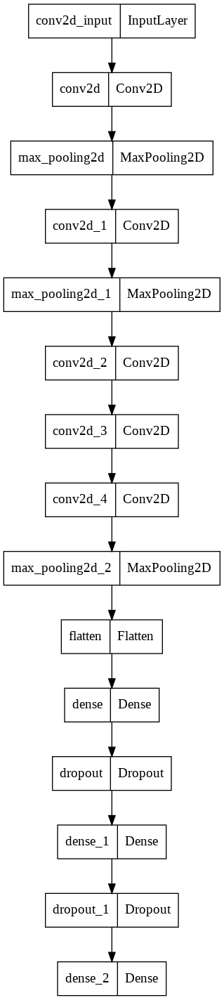

In [ ]:
plot_model(zf, to_file='zfnet.png')

In [ ]:
zf.layers[7]._name='conv4'
print(zf.layers[7].name)

conv4


In [ ]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

    train_path = data_dir+'/train'
    val_path = data_dir+'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN','NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [ ]:
train_batchez, val_batchez, test_batchez = Kermany2018(150, 224, '/content/drive/MyDrive/OCT2017-Data/')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 150
epoch = 10
val_size = 501

In [ ]:
np.array(train_batchez[0][1]).shape

(150, 4)

In [ ]:
history_zf = zf.fit(train_batchez, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batchez, epochs=epoch, verbose=1)


Epoch 1/10
51/51 [==============================] - 116s 2s/step - loss: 1.3249 - accuracy: 0.3950 - val_loss: 1.2998 - val_accuracy: 0.4072
Epoch 2/10
51/51 [==============================] - 113s 2s/step - loss: 1.3118 - accuracy: 0.3980 - val_loss: 1.2785 - val_accuracy: 0.4052
Epoch 3/10
51/51 [==============================] - 114s 2s/step - loss: 1.2946 - accuracy: 0.4039 - val_loss: 1.2623 - val_accuracy: 0.4212
Epoch 4/10
51/51 [==============================] - 113s 2s/step - loss: 1.2793 - accuracy: 0.4162 - val_loss: 1.2252 - val_accuracy: 0.4471
Epoch 5/10
51/51 [==============================] - 113s 2s/step - loss: 1.2635 - accuracy: 0.4263 - val_loss: 1.2106 - val_accuracy: 0.4291
Epoch 6/10
51/51 [==============================] - 114s 2s/step - loss: 1.2589 - accuracy: 0.4341 - val_loss: 1.1990 - val_accuracy: 0.4731
Epoch 7/10
51/51 [==============================] - 113s 2s/step - loss: 1.2172 - accuracy: 0.4566 - val_loss: 1.3586 - val_accuracy: 0.4152
Epoch 8/10
51

In [ ]:
from keras.models import Model

#layer_name = 'conv4'
zf_base = Model(inputs=zf.input, outputs=zf.get_layer('conv4').output)
#zf_output = zf_base.predict(test_batches)

In [ ]:
def z_extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 6, 6, 256))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(224, 224),
      batch_size=batch_size,
      class_mode='binary')
 

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = zf_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [ ]:
batch_size = 150
epoch = 10 

In [ ]:
train_featurez, train_labelz = z_extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
validation_featurez, validation_labelz = z_extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
test_featurez, test_labelz = z_extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
train_featurez = np.reshape(train_featurez, (7752, 6 * 6 * 256))
validation_featurez = np.reshape(validation_featurez, (501, 6 * 6 * 256))
test_featurez = np.reshape(test_featurez, (1000, 6 * 6 * 256))

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')


In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit rforest.fit(train_featurez, train_labelz)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


peak memory: 9144.39 MiB, increment: 0.07 MiB


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 85.43219500000032 duration2= 85.29085397720337


In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'zfnet-forest_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, validation_featurez, validation_labelz, cv=5)
np.average(scores)
np.mean(scores)

0.5627524752475248

In [ ]:
rzf_pred = rforest.predict(test_featurez)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_labelz, rzf_pred)


0.627

In [ ]:
confusion_matrix(test_labelz, rzf_pred)


array([[205,  14,  27,   4],
       [ 43,  73,  69,  65],
       [ 42,  20, 125,  63],
       [  1,   7,  18, 224]])

In [ ]:
tn, fp, fn, tp = confusion_matrix(test_labelz, rzf_pred)
zf_specificity = tn / (tn+fp)
zf_sensitivity = tp / (tp+fn)

In [ ]:
zf_specificity 

array([0.8266129 , 0.16091954, 0.28125   , 0.05797101])

In [ ]:
zf_sensitivity 

array([0.02325581, 0.25925926, 0.12587413, 0.7804878 ])

In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

#test_labelz = test_labelz.reshape(-1,1)
zf_score = rforest.predict_proba(test_featurez)

#Binarize the output
zf_bin = label_binarize(test_labelz, classes=[1, 2, 3, 4])
n_classes = zf_bin.shape[1]

#zf_score = zf_score.reshape(-1,1)
#val_pred  = val_pred.reshape(-1,1)
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(zf_bin[:, i], zf_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
#fpr["micro"], tpr["micro"], _ = metrics.roc_curve(test_labelz.ravel(), rzf_pred.ravel())
#roc_auc["micro"] = metrics.auc(fpr["micro"], tpr["micro"])

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


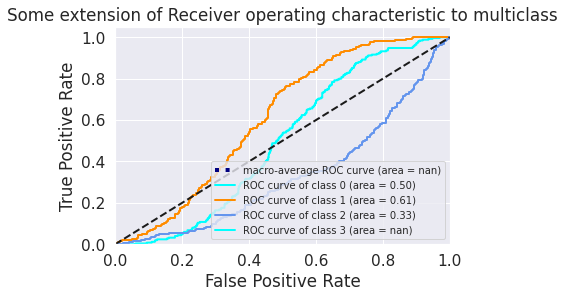

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])

'''# Plot all ROC curves
plt.figure()
plt.plot(
    fpr["micro"],
    tpr["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="deeppink",
    linestyle=":",
    linewidth=4,
)
'''
plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="lower right")
plt.show()

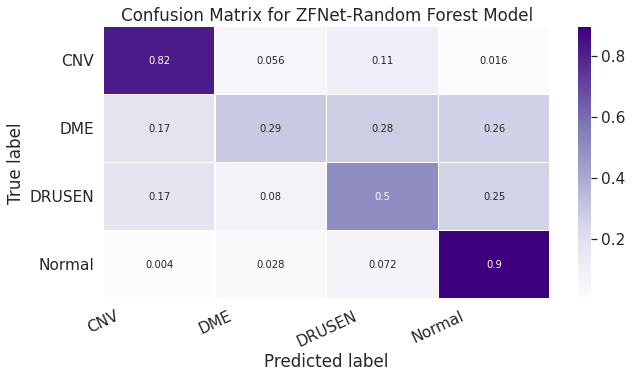

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(test_labelz, rzf_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Purples, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN','Normal' ]
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for ZFNet-Random Forest Model')
plt.show()

In [ ]:
print(classification_report(test_labelz, rzf_pred))


              precision    recall  f1-score   support

         0.0       0.70      0.82      0.76       250
         1.0       0.64      0.29      0.40       250
         2.0       0.52      0.50      0.51       250
         3.0       0.63      0.90      0.74       250

    accuracy                           0.63      1000
   macro avg       0.62      0.63      0.60      1000
weighted avg       0.62      0.63      0.60      1000



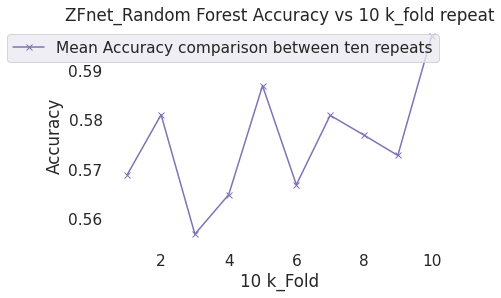

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	rfc_scores = cross_val_score(rforest, validation_featurez, validation_labelz, scoring='accuracy', cv=cv)
	results.append(np.mean(rfc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('ZFnet_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

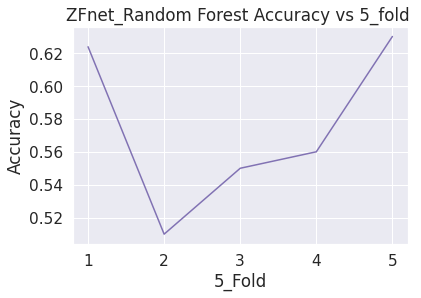

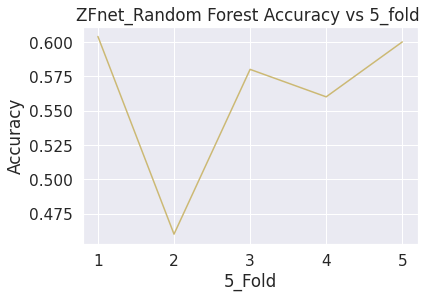

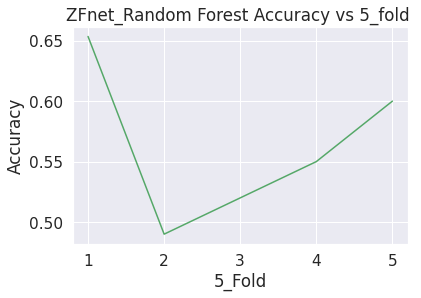

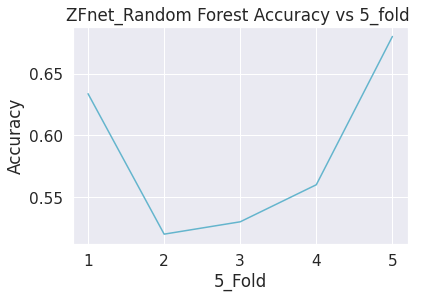

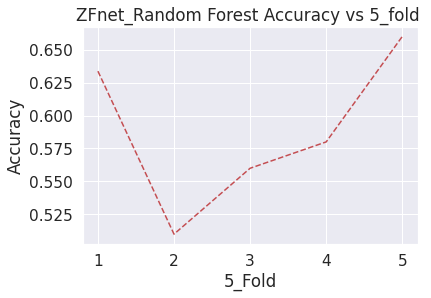

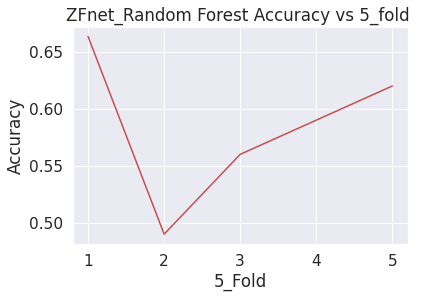

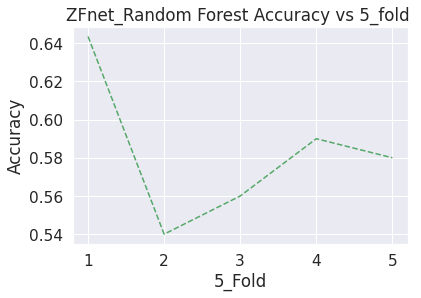

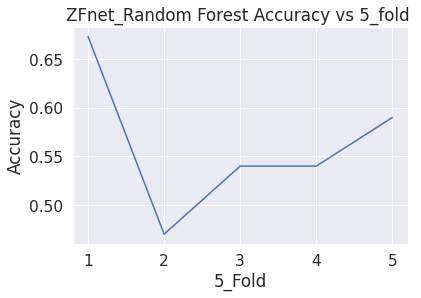

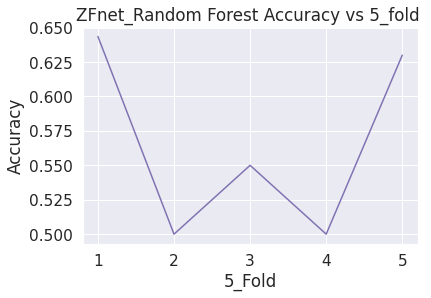

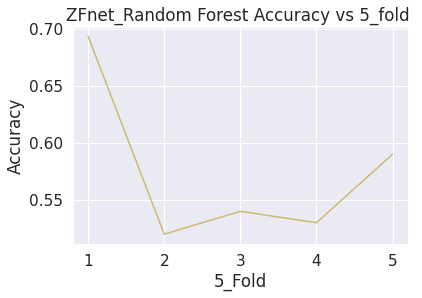

No handles with labels found to put in legend.


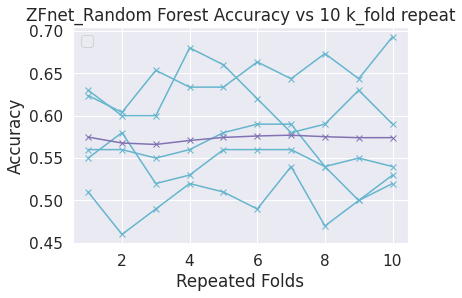

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, validation_featurez, validation_labelz, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('ZFnet_Random Forest Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('ZFnet_Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(rforest, validation_featurez, validation_labelz, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())


> folds=1, accuracy=0.583 (0.510,0.703)
> folds=2, accuracy=0.599 (0.550,0.663)
> folds=3, accuracy=0.583 (0.500,0.683)
> folds=4, accuracy=0.571 (0.500,0.624)
> folds=5, accuracy=0.571 (0.490,0.634)
> folds=6, accuracy=0.561 (0.520,0.620)
> folds=7, accuracy=0.579 (0.530,0.640)
> folds=8, accuracy=0.583 (0.480,0.663)
> folds=9, accuracy=0.563 (0.520,0.610)
> folds=10, accuracy=0.585 (0.490,0.693)


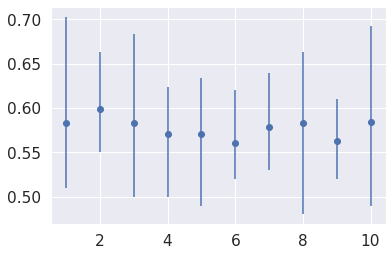

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

## <font color='blue'> Q4: How CNNS perform in classification of retina different cases in comparison to Machine learning classifiers using base CNN for feature extraction? </font>
-	Does CNN perform better in the classification of three Retina diseases and normal retina in comparison with Machine Learning Classifiers such as Random Forest and XGBoost?
-	Does CNN have better efficiency (Time, Memory usage, Computation cost) in comparison to Machine Learning techniques such as Random Forest and XGBoost classifier?


## <font color='purple'> Using ZFnet for classification </font>

In [ ]:
#coding=utf-8  
from keras.models import Sequential  
from keras.layers import Dense,Flatten,Dropout  
from keras.layers.convolutional import Conv2D,MaxPooling2D  
from keras.utils.np_utils import to_categorical  
import numpy as np  
seed = 7  
np.random.seed(seed)  
  
zf = Sequential()  
zf.add(Conv2D(96,(7,7),strides=(2,2),input_shape=(224,224,3),padding='valid',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(256,(5,5),strides=(2,2),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(384,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(Conv2D(256,(3,3),strides=(1,1),padding='same',activation='relu',kernel_initializer='uniform'))  
zf.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))  
zf.add(Flatten())  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4096,activation='relu'))  
zf.add(Dropout(0.5))  
zf.add(Dense(4,activation='softmax'))  
zf.summary()  

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 109, 109, 96)      14208     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 54, 54, 96)       0         
 2D)                                                             
                                                                 
 conv2d_16 (Conv2D)          (None, 27, 27, 256)       614656    
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 13, 13, 256)      0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 13, 13, 384)       885120    
                                                                 
 conv2d_18 (Conv2D)          (None, 13, 13, 384)      

In [ ]:
from keras import metrics

In [ ]:
sp_sn = tf.keras.metrics.SpecificityAtSensitivity(0.6)
sn_sp = tf.keras.metrics.SensitivityAtSpecificity(0.6)

metrics=['accuracy', 'FalseNegatives', 'Precision', 'Recall', sp_sn, sn_sp, 'AUC']

zf.compile(loss='categorical_crossentropy',optimizer='sgd', metrics=metrics)  

In [ ]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

    train_path = data_dir+'/train'
    val_path = data_dir+'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN','NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [ ]:
train_batchez, val_batchez, test_batchez = Kermany2018(150, 224, '/content/drive/MyDrive/OCT2017-Data/')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [ ]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 150
epoch = 10
val_size = 501

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017_2/zfnet4-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit zf_c = zf.fit(train_batchez, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batchez, epochs=10, class_weight=class_weight, callbacks=callbacks_list, verbose=1)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/10
51/51 [==============================] - 4331s 86s/step - loss: 1.3924 - accuracy: 0.2690 - false_negatives: 7646.0000 - precision: 0.1818 - recall: 5.2288e-04 - specificity_at_sensitivity_13: 0.4108 - sensitivity_at_specificity_1: 0.4007 - auc: 0.5242 - val_loss: 1.3734 - val_accuracy: 0.3234 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_13: 0.4438 - val_sensitivity_at_specificity_1: 0.4152 - val_auc: 0.5732
Epoch 2/10
51/51 [==============================] - 115s 2s/step - loss: 1.3783 - accuracy: 0.2966 - false_negatives: 7648.0000 - precision: 0.6667 - recall: 2.6144e-04 - specificity_at_sensitivity_13: 0.4383 - sensitivity_at_specificity_1: 0.4601 - auc: 0.5531 - val_loss: 1.3667 - val_accuracy: 0.3733 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_13: 0.5050 - val_sensitivity_at_specificity_1: 0.5509 - val_auc: 0.6083
Epoch 3/10

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 1207.853111 duration2= 5582.793907165527


In [ ]:
np.save('/content/drive/MyDrive/OCT2017-Data/history-zfc.npy',zf_c.history)

In [ ]:
history-zfc=np.load('/content/drive/MyDrive/OCT2017-Data/history-zfc.npy',allow_pickle='TRUE').item()


In [ ]:
best_epoch_model = np.argmin(zf_c.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, zf_c.history['val_loss'][best_epoch_model], zf_c.history['val_accuracy'][best_epoch_model]))

best epoch:9 validation loss:1.188 validation acc:0.487


In [ ]:
print(zf_c.history.keys())

dict_keys(['loss', 'accuracy', 'false_negatives', 'precision', 'recall', 'specificity_at_sensitivity_13', 'sensitivity_at_specificity_1', 'auc', 'val_loss', 'val_accuracy', 'val_false_negatives', 'val_precision', 'val_recall', 'val_specificity_at_sensitivity_13', 'val_sensitivity_at_specificity_1', 'val_auc'])


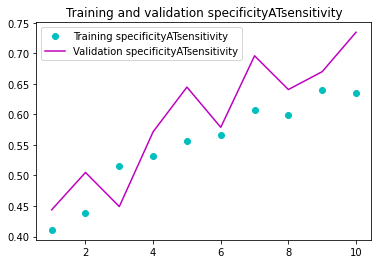

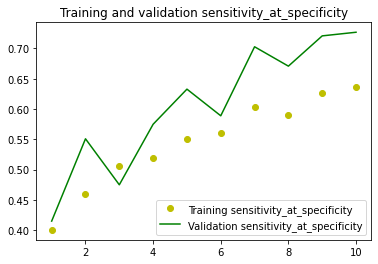

In [ ]:
import matplotlib.pyplot as plt

specificityATsensitivity = zf_c.history['specificity_at_sensitivity_13']
sensitivityATspecificity = zf_c.history['sensitivity_at_specificity_1']
val_specificityATsensitivity = zf_c.history['val_specificity_at_sensitivity_13']
val_sensitivityATspecificity = zf_c.history['val_sensitivity_at_specificity_1']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training specificityATsensitivity')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation specificityATsensitivity')
plt.title('Training and validation specificityATsensitivity')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training sensitivity_at_specificity')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation sensitivity_at_specificity')
plt.title('Training and validation sensitivity_at_specificity')
plt.legend()
plt.show()

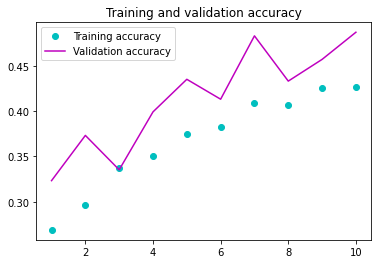

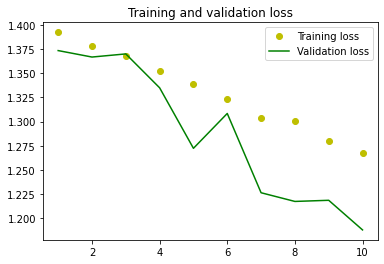

In [ ]:
import matplotlib.pyplot as plt

acc = zf_c.history['accuracy']
val_acc = zf_c.history['val_accuracy']
loss = zf_c.history['loss']
val_loss = zf_c.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'co', label='Training accuracy')
plt.plot(epochs, val_acc, 'm', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'yo', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

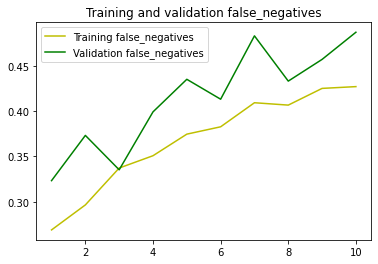

In [ ]:
import matplotlib.pyplot as plt

falseNegatives = zf_c.history['false_negatives']
val_falseNegatives = zf_c.history['val_false_negatives']


epochs = range(1, len(falseNegatives) + 1)

plt.plot(epochs, acc, 'y-', label='Training false_negatives')
plt.plot(epochs, val_acc, 'g', label='Validation false_negatives')
plt.title('Training and validation false_negatives')
plt.legend()



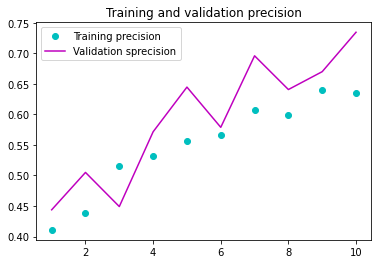

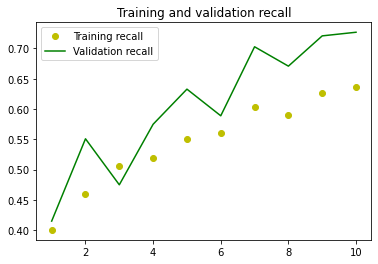

In [ ]:
import matplotlib.pyplot as plt

Precision = zf_c.history['precision']
Recall = zf_c.history['recall']
val_Precision = zf_c.history['val_precision']
val_Recall = zf_c.history['val_recall']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training precision')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation sprecision')
plt.title('Training and validation precision')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training recall')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation recall')
plt.title('Training and validation recall')
plt.legend()
plt.show()

In [ ]:
zf_pred =zf.predict(test_batchez)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


#Confution Matrix and Classification Report
zf_pred = np.argmax(zf_pred, axis=1)

cm_zf = confusion_matrix(test_batchez.classes, zf_pred)

print('Confusion Matrix')
print(cm_zf)


Confusion Matrix
[[ 42  36  38 134]
 [ 41  40  46 123]
 [ 61  25  56 108]
 [ 38  33  42 137]]


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_batchez.classes, zf_pred)


0.275

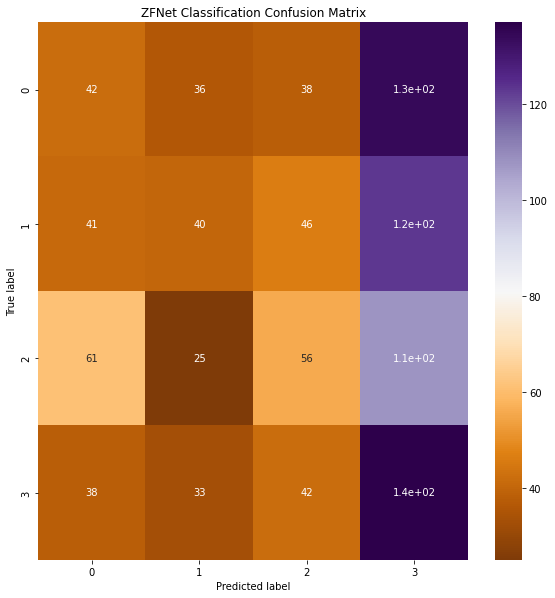

In [ ]:
import seaborn as sns


figure = plt.figure(figsize=(8, 8))
sns.heatmap(cm_zf, annot=True,cmap=plt.cm.PuOr)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('ZFNet Classification Confusion Matrix')
plt.show()

In [ ]:
import math

n = 150
#number_of_examples = len(train_batches.filenames)
number_generator = math.ceil(2250 / (1.0 * n)) 
#number_generator = round((2250 / (1.0 * n)), 2)

# 1.0 above is to skip integer division

ztrain_label = []
ztrain_data = []

for i in range(0,int(number_generator)):
    ztrain_label.extend(np.array(train_generator1[i][1]))
    ztrain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
ztrain_label = np.array(ztrain_label)
ztrain_data = np.array(ztrain_data)

In [ ]:
np.array(ztrain_data).shape

(2250, 224, 224, 3)

In [ ]:
ztrain_data = ztrain_data.reshape([2250, 224*224*3])

In [ ]:

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(750 / (1.0 * n)) 
#number_generator = round((750 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

ztest_label = []
ztest_data = []

for i in range(0,int(number_generator)):
    ztest_label.extend(np.array(test_generator1[i][1]))
    ztest_data.extend(np.array(test_generator1[i][0]))


In [ ]:
ztest_label = np.array(ztest_label)
ztest_data = np.array(ztest_data)

In [ ]:
ztest_label.shape

In [ ]:
ztest_data = ztest_data.reshape([750, 224*224*3])

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(300 / (1.0 * n)) 
#number_generator = round((300 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

zval_label1 = []
zval_data1 = []

for i in range(0,int(number_generator)):
    zval_label1.extend(np.array(val_generator1[i][1]))
    zval_data1.extend(np.array(val_generator1[i][0]))


In [ ]:
zval_label = np.array(zval_label1)
zval_data = np.array(zval_data1)

In [ ]:
zval_data.shape

In [ ]:
zval_data = zval_data.reshape (300, 224*224*3)

In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017_2/zfnet3-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit zf.fit(train_batchez, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batchez, epochs=10, class_weight=class_weight, callbacks=callbacks_list, verbose=1)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/10
51/51 [==============================] - 122s 2s/step - loss: 1.2366 - accuracy: 0.4629 - val_loss: 1.1082 - val_accuracy: 0.5170
Epoch 2/10
51/51 [==============================] - 114s 2s/step - loss: 1.2096 - accuracy: 0.4658 - val_loss: 1.0869 - val_accuracy: 0.5309
Epoch 3/10
51/51 [==============================] - 114s 2s/step - loss: 1.1908 - accuracy: 0.4796 - val_loss: 1.2013 - val_accuracy: 0.4351
Epoch 4/10
51/51 [==============================] - 114s 2s/step - loss: 1.1771 - accuracy: 0.4897 - val_loss: 1.1420 - val_accuracy: 0.4950
Epoch 5/10
51/51 [==============================] - 115s 2s/step - loss: 1.1747 - accuracy: 0.4894 - val_loss: 1.0177 - val_accuracy: 0.5689
Epoch 6/10
51/51 [==============================] - 120s 2s/step - loss: 1.1467 - accuracy: 0.5060 - val_loss: 0.9977 - val_accuracy: 0.5888
Epoch 7/10
51/51 [==============================] - 183s 4s/step - loss: 1.1096 - accuracy: 0.5142 - val_loss: 1.0200 - val_accuracy: 0.5429
Epoch 8/10
51

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 1269.5429570000001 duration2= 1472.9655635356903


In [ ]:
zf_history = zf.fit_generator(train_batchez, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batchez, epochs=epoch, callbacks=callbacks_list, verbose=1, class_weight=class_weight)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  """Entry point for launching an IPython kernel.


Epoch 1/10
51/51 [==============================] - 2100s 42s/step - loss: 1.4049 - accuracy: 0.2579 - val_loss: 1.3748 - val_accuracy: 0.3174
Epoch 2/10
51/51 [==============================] - 156s 3s/step - loss: 1.3813 - accuracy: 0.2905 - val_loss: 1.3742 - val_accuracy: 0.3154
Epoch 3/10
51/51 [==============================] - 149s 3s/step - loss: 1.3733 - accuracy: 0.3153 - val_loss: 1.3504 - val_accuracy: 0.3852
Epoch 4/10
51/51 [==============================] - 117s 2s/step - loss: 1.3653 - accuracy: 0.3358 - val_loss: 1.3448 - val_accuracy: 0.3912
Epoch 5/10
51/51 [==============================] - 118s 2s/step - loss: 1.3476 - accuracy: 0.3613 - val_loss: 1.2980 - val_accuracy: 0.4212
Epoch 6/10
51/51 [==============================] - 117s 2s/step - loss: 1.3319 - accuracy: 0.3766 - val_loss: 1.2677 - val_accuracy: 0.4571
Epoch 7/10
51/51 [==============================] - 118s 2s/step - loss: 1.3234 - accuracy: 0.3822 - val_loss: 1.2656 - val_accuracy: 0.4711
Epoch 8/10


In [ ]:
best_epoch_model = np.argmin(zf_history.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, zf_history.history['val_loss'][best_epoch_model], zf_history.history['val_accuracy'][best_epoch_model]))

best epoch:9 validation loss:1.190 validation acc:0.475


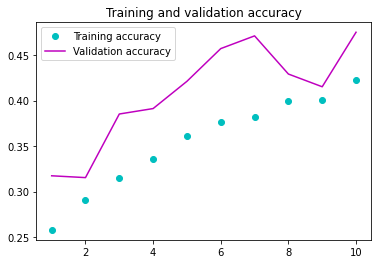

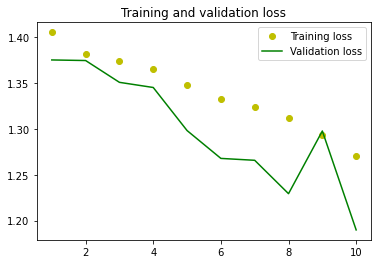

In [ ]:
import matplotlib.pyplot as plt

acc = zf_history.history['accuracy']
val_acc = zf_history.history['val_accuracy']
loss = zf_history.history['loss']
val_loss = zf_history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'co', label='Training accuracy')
plt.plot(epochs, val_acc, 'm', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'yo', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [ ]:
np.save('/content/drive/MyDrive/OCT2017-Data/history1.npy',zf_history.history)

In [ ]:
history1=np.load('/content/drive/MyDrive/OCT2017-Data/history1.npy',allow_pickle='TRUE').item()


In [ ]:
zf_scores = zf.evaluate_generator(val_batchez)
print("%s: %.2f%%" % (zf.metrics_names[1], zf_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 48.10%


In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.model_selection import KFold, StratifiedKFold
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint



#set early stopping criteria
pat = 3 #this is the number of epochs with no improvment after which the training will stop
early_stopping = EarlyStopping(monitor='accuracy', patience=pat, verbose=1)

#define the model checkpoint callback -> this will keep on saving the model as a physical file
model_checkpoint = ModelCheckpoint('zf_oct_1.h5', verbose=1, save_best_only=True)

#define a function to fit the model
def fit_and_evaluate(train, val, EPOCHS=8, BATCH_SIZE=50):
    model = None
    model = zf
    results = model.fit(train, epochs=EPOCHS, batch_size=BATCH_SIZE, callbacks=[early_stopping, model_checkpoint], 
              validation_data=val,  shuffle=True, verbose=1, weights=)  
    print("Val Score: ", model.evaluate(val))
    return results

In [ ]:
n_folds=5
epochs=8
batch_size=150

#save the model history in a list after fitting so that we can plot later
model_history = [] 
s1 = 0
s2 = 0

for i in range(n_folds):
    '''print("Training on Fold: ",i+1)
    td = ztrain_data[s1:600*i]
    tl = ztrain_label[s1:600*i]
    vd = zval_data[s2:60*i]
    vl = zval_label[s2:60*i]
    s1 = 600*i
    s2 = 60*i'''
    h = fit_and_evaluate(test_batchez, val_batchez, epochs, batch_size)
    model_history.append(h)
    print("======="*12, model_history, end="\n\n\n")

Epoch 1/8
7/7 [==============================] - ETA: 0s - loss: 1.2682 - accuracy: 0.4020
Epoch 1: val_loss improved from inf to 1.59671, saving model to zf_oct_1.h5
7/7 [==============================] - 19s 3s/step - loss: 1.2682 - accuracy: 0.4020 - val_loss: 1.5967 - val_accuracy: 0.2655
Epoch 2/8
7/7 [==============================] - ETA: 0s - loss: 1.1956 - accuracy: 0.4650
Epoch 2: val_loss did not improve from 1.59671
7/7 [==============================] - 14s 2s/step - loss: 1.1956 - accuracy: 0.4650 - val_loss: 1.6823 - val_accuracy: 0.2435
Epoch 3/8
7/7 [==============================] - ETA: 0s - loss: 1.2207 - accuracy: 0.4420
Epoch 3: val_loss improved from 1.59671 to 1.49112, saving model to zf_oct_1.h5
7/7 [==============================] - 12s 2s/step - loss: 1.2207 - accuracy: 0.4420 - val_loss: 1.4911 - val_accuracy: 0.2635
Epoch 4/8
7/7 [==============================] - ETA: 0s - loss: 1.1688 - accuracy: 0.4870
Epoch 4: val_loss did not improve from 1.49112
7/7 [

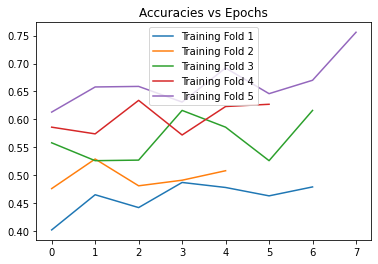

In [ ]:
plt.title('Accuracies vs Epochs')
plt.plot(model_history[0].history['accuracy'], label='Training Fold 1')
plt.plot(model_history[1].history['accuracy'], label='Training Fold 2')
plt.plot(model_history[2].history['accuracy'], label='Training Fold 3')
plt.plot(model_history[3].history['accuracy'], label='Training Fold 4')
plt.plot(model_history[4].history['accuracy'], label='Training Fold 5')
plt.legend()
plt.show()

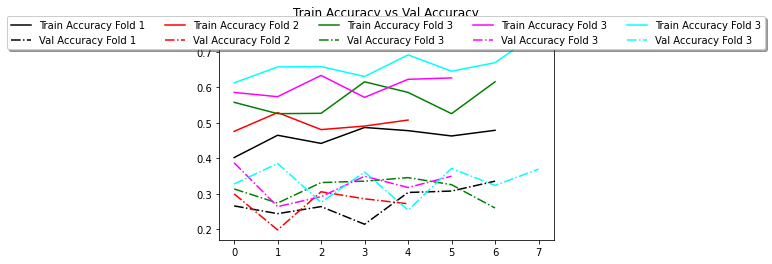

In [ ]:
plt.title('Train Accuracy vs Val Accuracy')
plt.plot(model_history[0].history['accuracy'], label='Train Accuracy Fold 1', color='black')
plt.plot(model_history[0].history['val_accuracy'], label='Val Accuracy Fold 1', color='black', linestyle = "dashdot")
plt.plot(model_history[1].history['accuracy'], label='Train Accuracy Fold 2', color='red', )
plt.plot(model_history[1].history['val_accuracy'], label='Val Accuracy Fold 2', color='red', linestyle = "dashdot")
plt.plot(model_history[2].history['accuracy'], label='Train Accuracy Fold 3', color='green', )
plt.plot(model_history[2].history['val_accuracy'], label='Val Accuracy Fold 3', color='green', linestyle = "dashdot")
plt.plot(model_history[3].history['accuracy'], label='Train Accuracy Fold 3', color='magenta', )
plt.plot(model_history[3].history['val_accuracy'], label='Val Accuracy Fold 3', color='magenta', linestyle = "dashdot")
plt.plot(model_history[4].history['accuracy'], label='Train Accuracy Fold 3', color='cyan', )
plt.plot(model_history[4].history['val_accuracy'], label='Val Accuracy Fold 3', color='cyan', linestyle = "dashdot")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=5, fancybox=True, shadow=True)
#plt.legend()
plt.show()

In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'zfnetc_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

In [ ]:
rzf_pred = rforest.predict(test_featurez)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_labelz, rzf_pred)


0.627

In [ ]:
type(zf_pred)
zf_pred.shape

(1000,)

In [ ]:
test_batchez.classes.shape

(1000,)

In [ ]:
from sklearn.metrics import roc_curve
#y_pred_keras = keras_model.predict(X_test).ravel()
fpr_keras, tpr_keras, thresholds_keras = roc_curve(test_batchez.classes, zf_pred.ravel)

ValueError: ignored

In [ ]:
def plot_roc(Pred, Pred_Label):
  fp, tp, _ = sklearn.metrics.roc_curve(labels, predictions).

In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

#test_labelz = test_labelz.reshape(-1,1)
zf_score = zf_pred

#Binarize the output
zf_bin = label_binarize(test_batchez.classes, classes=[1, 2, 3, 4])
n_classes = zf_bin.shape[1]

#zf_score = zf_score.reshape(-1,1)
#val_pred  = val_pred.reshape(-1,1)
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(zf_bin[i], zf_score[i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
#fpr["micro"], tpr["micro"], _ = metrics.roc_curve(test_labelz.ravel(), rzf_pred.ravel())
#roc_auc["micro"] = metrics.auc(fpr["micro"], tpr["micro"])

TypeError: ignored

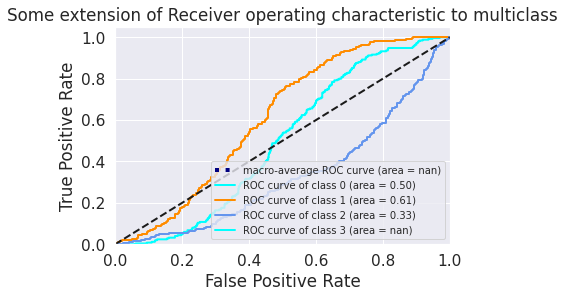

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])

'''# Plot all ROC curves
plt.figure()
plt.plot(
    fpr["micro"],
    tpr["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="deeppink",
    linestyle=":",
    linewidth=4,
)
'''
plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="lower right")
plt.show()

In [ ]:
print(classification_report(test_batchez.classes, zf_pred))


              precision    recall  f1-score   support

           0       0.23      0.17      0.19       250
           1       0.30      0.16      0.21       250
           2       0.31      0.22      0.26       250
           3       0.27      0.55      0.36       250

    accuracy                           0.28      1000
   macro avg       0.28      0.28      0.26      1000
weighted avg       0.28      0.28      0.26      1000



### <font color='purple'> Using CNN as Classifier on the CNN base feature extraction




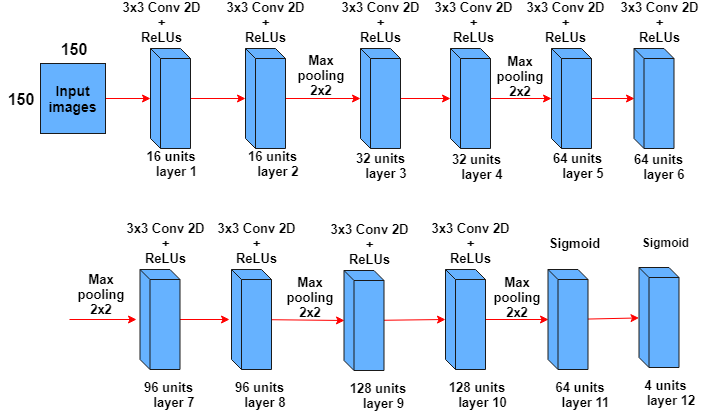

In [8]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import numpy as np
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import optimizers
from tensorflow.keras.layers import BatchNormalization


In [46]:
kcnn = Sequential()
kcnn.add(Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)))
kcnn.add(BatchNormalization())

kcnn.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
kcnn.add(BatchNormalization())
kcnn.add(MaxPooling2D((2, 2)))


kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())

kcnn.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())

kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())

kcnn.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())

kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())

kcnn.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())
kcnn.add(MaxPooling2D((2, 2)))


kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())

kcnn.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())

kcnn.add(MaxPooling2D((2, 2)))
kcnn.add(Conv2D(64, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())

kcnn.add(Conv2D(4, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
kcnn.add(BatchNormalization())

kcnn.add(Dropout(0.2))


In [47]:
kcnn.add(Flatten())
kcnn.add(Dense(4, activation='relu', kernel_initializer='he_uniform'))
kcnn.add(Dense(4, activation='softmax'))

In [ ]:
kcnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 222, 222, 16)      448       
                                                                 
 conv2d_13 (Conv2D)          (None, 222, 222, 16)      2320      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 111, 111, 16)     0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 111, 111, 32)      4640      
                                                                 
 conv2d_15 (Conv2D)          (None, 111, 111, 32)      9248      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 55, 55, 32)       0         
 2D)                                                  

In [11]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

 
    train_path = data_dir +'/train'
    val_path = data_dir +'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN','NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [24]:
train_batches, val_batches, test_batches = Kermany2018(150, 224, '/content/drive/MyDrive/OCT2017-Data/')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [44]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 150
epoch = 10
val_size = 501

In [48]:
from keras import metrics


sp_sn = tf.keras.metrics.SpecificityAtSensitivity(0.6)
sn_sp = tf.keras.metrics.SensitivityAtSpecificity(0.6)

metrics=['accuracy', 'FalseNegatives', 'Precision', 'Recall', sp_sn, sn_sp, 'AUC']

kcnn.compile(loss='categorical_crossentropy',optimizer='sgd', metrics=metrics)  

wj=n_samples / (n_classes * n_samplesj)

wj is the weight for each class(j signifies the class)/
n_samplesis the total number of samples or rows in the dataset/
n_classesis the total number of unique classes in the target/
n_samplesjis the total number of rows of the respective class/

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [49]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [50]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [51]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017-Data/CNN_C-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [16]:
!pip install -q memory_profiler 

In [17]:
%load_ext memory_profiler

In [ ]:
#import memory_profiler

In [ ]:
#from memory_profiler import profile


In [52]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit kcnn_c = kcnn.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=10, class_weight=class_weight, callbacks=callbacks_list, verbose=1)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/10
51/51 [==============================] - 154s 3s/step - loss: 1.4326 - accuracy: 0.3127 - false_negatives: 7556.0000 - precision: 0.2513 - recall: 0.0123 - specificity_at_sensitivity_3: 0.2133 - sensitivity_at_specificity_3: 0.4005 - auc: 0.5253 - val_loss: 1.4461 - val_accuracy: 0.1976 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_3: 0.2655 - val_sensitivity_at_specificity_3: 0.2216 - val_auc: 0.4615
Epoch 2/10
51/51 [==============================] - 133s 3s/step - loss: 1.3912 - accuracy: 0.3711 - false_negatives: 7634.0000 - precision: 0.3265 - recall: 0.0021 - specificity_at_sensitivity_3: 0.0722 - sensitivity_at_specificity_3: 0.5233 - auc: 0.5536 - val_loss: 1.4463 - val_accuracy: 0.1976 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_3: 0.2715 - val_sensitivity_at_specificity_3: 0.2056 - val_auc: 0.4666
Epoch 3/10
51/51 [======

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [53]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 1214.971426 duration2= 1465.270991563797


In [54]:
np.save('/content/drive/MyDrive/OCT2017-Data/history-kcnnc.npy',kcnn_c.history)

In [ ]:
history-zfc=np.load('/content/drive/MyDrive/OCT2017-Data/history-kcnnc.npy',allow_pickle='TRUE').item()


In [55]:
best_epoch_model = np.argmin(kcnn_c.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, kcnn_c.history['val_loss'][best_epoch_model], kcnn_c.history['val_accuracy'][best_epoch_model]))

best epoch:9 validation loss:1.383 validation acc:0.391


In [58]:
knn_scores = kcnn.evaluate_generator(val_batches, verbose=0)
print("%s: %.2f%%" % (kcnn.metrics_names[1], knn_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 41.12%


In [59]:
print(kcnn_c.history.keys())

dict_keys(['loss', 'accuracy', 'false_negatives', 'precision', 'recall', 'specificity_at_sensitivity_3', 'sensitivity_at_specificity_3', 'auc', 'val_loss', 'val_accuracy', 'val_false_negatives', 'val_precision', 'val_recall', 'val_specificity_at_sensitivity_3', 'val_sensitivity_at_specificity_3', 'val_auc'])


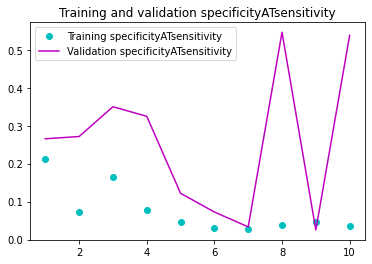

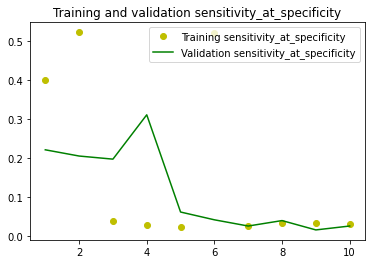

In [61]:
import matplotlib.pyplot as plt

specificityATsensitivity = kcnn_c.history['specificity_at_sensitivity_3']
sensitivityATspecificity = kcnn_c.history['sensitivity_at_specificity_3']
val_specificityATsensitivity = kcnn_c.history['val_specificity_at_sensitivity_3']
val_sensitivityATspecificity = kcnn_c.history['val_sensitivity_at_specificity_3']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training specificityATsensitivity')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation specificityATsensitivity')
plt.title('Training and validation specificityATsensitivity')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training sensitivity_at_specificity')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation sensitivity_at_specificity')
plt.title('Training and validation sensitivity_at_specificity')
plt.legend()
plt.show()

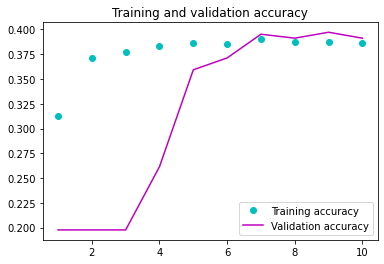

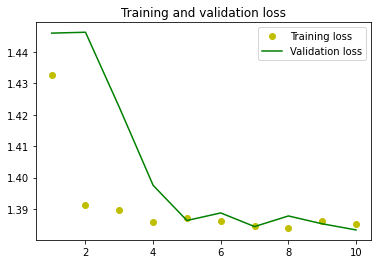

In [62]:
import matplotlib.pyplot as plt

acc = kcnn_c.history['accuracy']
val_acc = kcnn_c.history['val_accuracy']
loss = kcnn_c.history['loss']
val_loss = kcnn_c.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'co', label='Training accuracy')
plt.plot(epochs, val_acc, 'm', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'yo', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

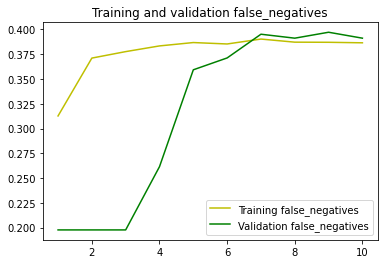

In [63]:
import matplotlib.pyplot as plt

falseNegatives = kcnn_c.history['false_negatives']
val_falseNegatives = kcnn_c.history['val_false_negatives']


epochs = range(1, len(falseNegatives) + 1)

plt.plot(epochs, acc, 'y-', label='Training false_negatives')
plt.plot(epochs, val_acc, 'g', label='Validation false_negatives')
plt.title('Training and validation false_negatives')
plt.legend()



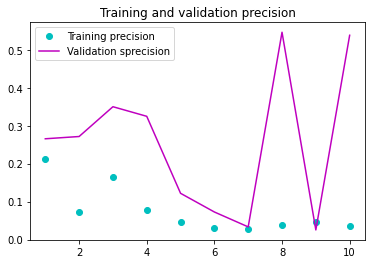

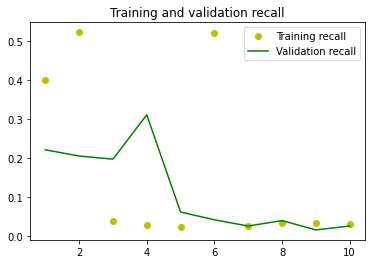

In [64]:
import matplotlib.pyplot as plt

Precision = kcnn_c.history['precision']
Recall = kcnn_c.history['recall']
val_Precision = kcnn_c.history['val_precision']
val_Recall = kcnn_c.history['val_recall']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training precision')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation sprecision')
plt.title('Training and validation precision')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training recall')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation recall')
plt.title('Training and validation recall')
plt.legend()
plt.show()

In [65]:
kcnn_pred =kcnn.predict(test_batches)

In [66]:
from sklearn.metrics import classification_report, confusion_matrix


#Confution Matrix and Classification Report
kcnn_pred = np.argmax(kcnn_pred, axis=1)

cm_kcnn = confusion_matrix(test_batches.classes, kcnn_pred)

print('Confusion Matrix')
print(cm_kcnn)


Confusion Matrix
[[  0   0   5 245]
 [  0   1   5 244]
 [  0   2   3 245]
 [  0   1   3 246]]


In [67]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_batches.classes, kcnn_pred)


0.25

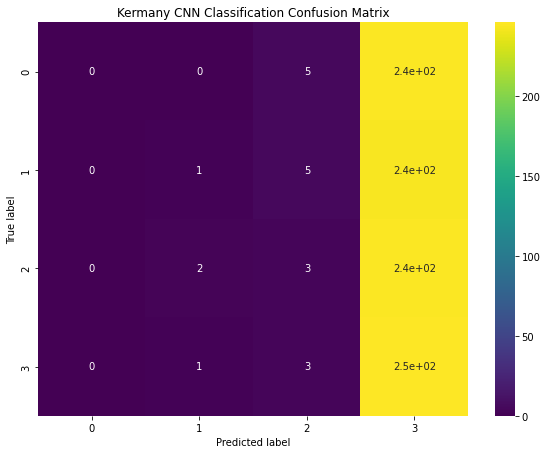

In [68]:
import seaborn as sns


figure = plt.figure(figsize=(8, 6))
sns.heatmap(cm_kcnn, annot=True,cmap=plt.cm.viridis)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Kermany CNN Classification Confusion Matrix')
plt.show()

In [69]:
kcnn_scores = kcnn.evaluate_generator(val_batches)
print("%s: %.2f%%" % (kcnn.metrics_names[1], kcnn_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 39.92%


In [70]:
import numpy as np
import pandas as pd
import os
from sklearn.model_selection import KFold, StratifiedKFold
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [81]:
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint

weights = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

#set early stopping criteria
pat = 3 #this is the number of epochs with no improvment after which the training will stop
early_stopping = EarlyStopping(monitor='accuracy', patience=pat, verbose=1)

#define the model checkpoint callback -> this will keep on saving the model as a physical file
model_checkpoint = ModelCheckpoint('kcnn_oct_1.h5', verbose=1, save_best_only=True)

#define a function to fit the model
def fit_and_evaluate(train, val, EPOCHS=8, BATCH_SIZE=50):
    model = None
    model = kcnn
    results = model.fit(train, epochs=EPOCHS, batch_size=BATCH_SIZE, callbacks=[early_stopping, model_checkpoint], 
              validation_data=val,  shuffle=True, verbose=1, class_weight=weights)  
    print("Val Score: ", model.evaluate(val))
    return results

In [82]:
n_folds=5
epochs=8
batch_size=150

#save the model history in a list after fitting so that we can plot later
model_history = [] 
s1 = 0
s2 = 0



for i in range(n_folds):
    '''print("Training on Fold: ",i+1)
    td = ztrain_data[s1:600*i]
    tl = ztrain_label[s1:600*i]
    vd = zval_data[s2:60*i]
    vl = zval_label[s2:60*i]
    s1 = 600*i
    s2 = 60*i'''
    h = fit_and_evaluate(test_batches, val_batches, epochs, batch_size)
    model_history.append(h)
    print("======="*12, model_history, end="\n\n\n")

Epoch 1/8
7/7 [==============================] - ETA: 0s - loss: 1.5139 - accuracy: 0.2730 - false_negatives: 1000.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - specificity_at_sensitivity_3: 0.0253 - sensitivity_at_specificity_3: 0.3990 - auc: 0.5067
Epoch 1: val_loss improved from inf to 1.38789, saving model to kcnn_oct_1.h5
7/7 [==============================] - 21s 3s/step - loss: 1.5139 - accuracy: 0.2730 - false_negatives: 1000.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - specificity_at_sensitivity_3: 0.0253 - sensitivity_at_specificity_3: 0.3990 - auc: 0.5067 - val_loss: 1.3879 - val_accuracy: 0.2036 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_3: 0.0153 - val_sensitivity_at_specificity_3: 0.2116 - val_auc: 0.4727
Epoch 2/8
7/7 [==============================] - ETA: 0s - loss: 1.5073 - accuracy: 0.2550 - false_negatives: 1000.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - specificity_at_s

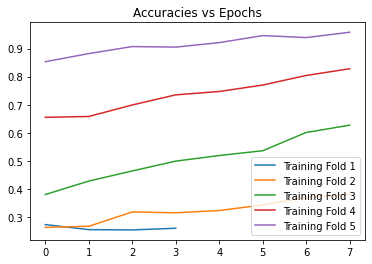

In [83]:
plt.title('Accuracies vs Epochs')
plt.plot(model_history[0].history['accuracy'], label='Training Fold 1')
plt.plot(model_history[1].history['accuracy'], label='Training Fold 2')
plt.plot(model_history[2].history['accuracy'], label='Training Fold 3')
plt.plot(model_history[3].history['accuracy'], label='Training Fold 4')
plt.plot(model_history[4].history['accuracy'], label='Training Fold 5')
plt.legend()
plt.show()

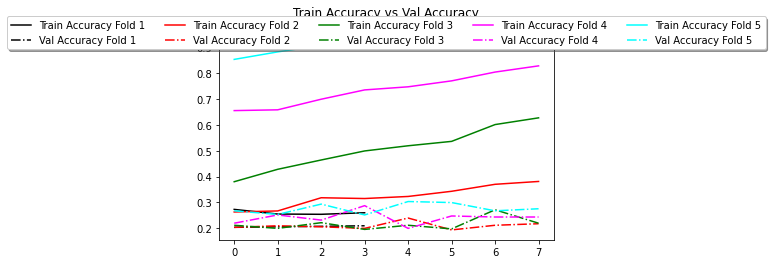

In [85]:
plt.title('Train Accuracy vs Val Accuracy')
plt.plot(model_history[0].history['accuracy'], label='Train Accuracy Fold 1', color='black')
plt.plot(model_history[0].history['val_accuracy'], label='Val Accuracy Fold 1', color='black', linestyle = "dashdot")
plt.plot(model_history[1].history['accuracy'], label='Train Accuracy Fold 2', color='red', )
plt.plot(model_history[1].history['val_accuracy'], label='Val Accuracy Fold 2', color='red', linestyle = "dashdot")
plt.plot(model_history[2].history['accuracy'], label='Train Accuracy Fold 3', color='green', )
plt.plot(model_history[2].history['val_accuracy'], label='Val Accuracy Fold 3', color='green', linestyle = "dashdot")
plt.plot(model_history[3].history['accuracy'], label='Train Accuracy Fold 4', color='magenta', )
plt.plot(model_history[3].history['val_accuracy'], label='Val Accuracy Fold 4', color='magenta', linestyle = "dashdot")
plt.plot(model_history[4].history['accuracy'], label='Train Accuracy Fold 5', color='cyan', )
plt.plot(model_history[4].history['val_accuracy'], label='Val Accuracy Fold 5', color='cyan', linestyle = "dashdot")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=5, fancybox=True, shadow=True)
#plt.legend()
plt.show()

In [86]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'kcnnc_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

In [87]:
kcnn_pred = kcnn.predict(test_batches)

## <font color='purple'> Using SVM as Classifier </font>

## <font color='purple'> a) CNN layers as SVM - Using Hinge loss and Regularization </font>

In [128]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import numpy as np
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import optimizers
from keras.losses import categorical_hinge


In [92]:
cnsv = Sequential()
cnsv.add(Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)))
cnsv.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))
cnsv.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))
cnsv.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))
cnsv.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))
cnsv.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsv.add(MaxPooling2D((2, 2)))
cnsv.add(Conv2D(64, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Conv2D(4, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
cnsv.add(Dropout(0.2))


In [139]:
from tensorflow.keras import regularizers


cnsv.add(Flatten())
cnsv.add(Dense(4, activation='relu',  kernel_initializer='he_uniform'))
cnsv.add(Dense(4, kernel_regularizer=tf.keras.regularizers.l2(0.01), activation = "softmax"))


In [105]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

 
    train_path = data_dir +'/train'
    val_path = data_dir +'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN','NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [106]:
train_batches, val_batches, test_batches = Kermany2018(150, 224, '/content/drive/MyDrive/OCT2017-Data/')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [107]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 150
epoch = 10
val_size = 501

In [140]:
from keras import metrics


sp_sn = tf.keras.metrics.SpecificityAtSensitivity(0.6)
sn_sp = tf.keras.metrics.SensitivityAtSpecificity(0.6)

metrics=['accuracy', 'FalseNegatives', 'Precision', 'Recall', sp_sn, sn_sp, 'AUC']

cnsv.compile(loss='categorical_hinge',optimizer='sgd', metrics=metrics)  

wj=n_samples / (n_classes * n_samplesj)

wj is the weight for each class(j signifies the class)/
n_samplesis the total number of samples or rows in the dataset/
n_classesis the total number of unique classes in the target/
n_samplesjis the total number of rows of the respective class/

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [100]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [116]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [117]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017-Data/CNN_SV-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [ ]:
!pip install -q memory_profiler 

In [103]:
%load_ext memory_profiler

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [ ]:
#import memory_profiler

In [ ]:
#from memory_profiler import profile


In [141]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit cnsv_c = cnsv.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=10, class_weight=class_weight, callbacks=callbacks_list, verbose=1)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/10
51/51 [==============================] - 118s 2s/step - loss: 1.3461 - accuracy: 0.3305 - false_negatives: 7650.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - specificity_at_sensitivity_13: 0.3179 - sensitivity_at_specificity_13: 0.2187 - auc: 0.5692 - val_loss: 1.3329 - val_accuracy: 0.2036 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_13: 0.0000e+00 - val_sensitivity_at_specificity_13: 0.0000e+00 - val_auc: 0.5000
Epoch 2/10
51/51 [==============================] - 114s 2s/step - loss: 1.3283 - accuracy: 0.2576 - false_negatives: 7650.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - specificity_at_sensitivity_13: 0.0000e+00 - sensitivity_at_specificity_13: 1.3072e-04 - auc: 0.4998 - val_loss: 1.3265 - val_accuracy: 0.1976 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_13: 0.0000e+00 - val_sensitivity_at_specificity_13: 0.000

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [142]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 464.39029400000027 duration2= 523.4051055908203


In [149]:
np.save('/content/drive/MyDrive/OCT2017-Data/history-cnsvc.npy',cnsv_c.history)

In [ ]:
history_cnsv=np.load('/content/drive/MyDrive/OCT2017-Data/history-cnsv.npy',allow_pickle='TRUE').item()


In [150]:
best_epoch_model = np.argmin(cnsv_c.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, kcnn_c.history['val_loss'][best_epoch_model], kcnn_c.history['val_accuracy'][best_epoch_model]))

best epoch:3 validation loss:1.398 validation acc:0.261


In [152]:
cnsv_scores = cnsv.evaluate_generator(val_batches, verbose=0)
print("%s: %.2f%%" % (cnsv.metrics_names[1], cnsv_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 40.72%


In [153]:
print(cnsv_c.history.keys())

dict_keys(['loss', 'accuracy', 'false_negatives', 'precision', 'recall', 'specificity_at_sensitivity_13', 'sensitivity_at_specificity_13', 'auc', 'val_loss', 'val_accuracy', 'val_false_negatives', 'val_precision', 'val_recall', 'val_specificity_at_sensitivity_13', 'val_sensitivity_at_specificity_13', 'val_auc'])


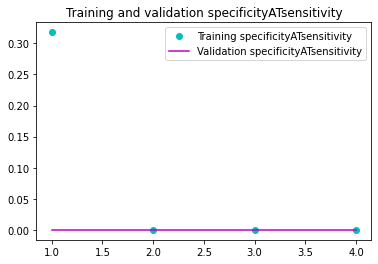

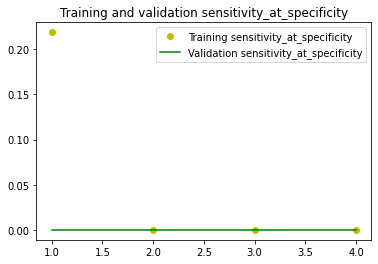

In [154]:
import matplotlib.pyplot as plt

specificityATsensitivity = cnsv_c.history['specificity_at_sensitivity_13']
sensitivityATspecificity = cnsv_c.history['sensitivity_at_specificity_13']
val_specificityATsensitivity = cnsv_c.history['val_specificity_at_sensitivity_13']
val_sensitivityATspecificity = cnsv_c.history['val_sensitivity_at_specificity_13']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training specificityATsensitivity')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation specificityATsensitivity')
plt.title('Training and validation specificityATsensitivity')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training sensitivity_at_specificity')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation sensitivity_at_specificity')
plt.title('Training and validation sensitivity_at_specificity')
plt.legend()
plt.show()

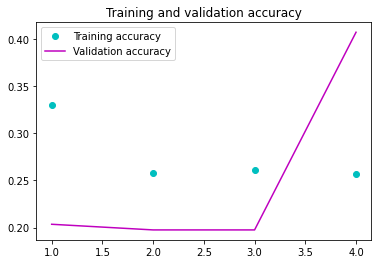

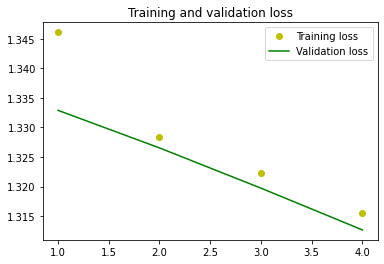

In [155]:
import matplotlib.pyplot as plt

acc = cnsv_c.history['accuracy']
val_acc = cnsv_c.history['val_accuracy']
loss = cnsv_c.history['loss']
val_loss = cnsv_c.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'co', label='Training accuracy')
plt.plot(epochs, val_acc, 'm', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'yo', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

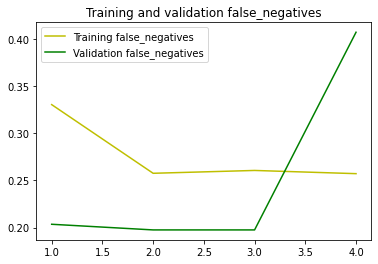

In [156]:
import matplotlib.pyplot as plt

falseNegatives = cnsv_c.history['false_negatives']
val_falseNegatives = cnsv_c.history['val_false_negatives']


epochs = range(1, len(falseNegatives) + 1)

plt.plot(epochs, acc, 'y-', label='Training false_negatives')
plt.plot(epochs, val_acc, 'g', label='Validation false_negatives')
plt.title('Training and validation false_negatives')
plt.legend()



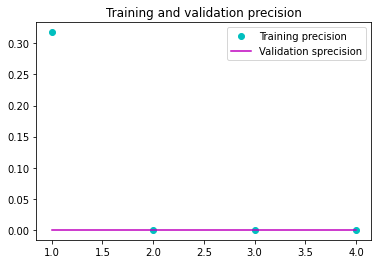

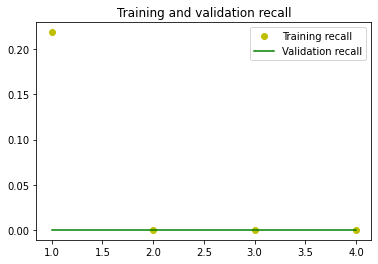

In [157]:
import matplotlib.pyplot as plt

Precision = cnsv_c.history['precision']
Recall = cnsv_c.history['recall']
val_Precision = cnsv_c.history['val_precision']
val_Recall = cnsv_c.history['val_recall']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training precision')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation sprecision')
plt.title('Training and validation precision')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training recall')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation recall')
plt.title('Training and validation recall')
plt.legend()
plt.show()

In [158]:
cnsv_pred =cnsv.predict(test_batches)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_batches.classes, cnsv_pred)


0.275

In [166]:
from sklearn.metrics import classification_report, confusion_matrix


#Confution Matrix and Classification Report
cnsv_pred1 = np.argmax(cnsv_pred, axis=0)
cnsv_pred1 = cnsv_pred1.reshape(-1,1)



cm_cnsv = confusion_matrix(test_batches.classes, cnsv_pred1)

print('Confusion Matrix')
print(cm_kcnn)


ValueError: ignored

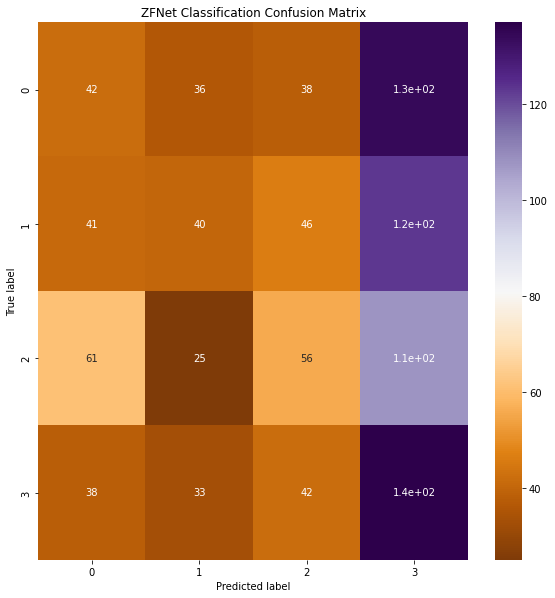

In [ ]:
import seaborn as sns


figure = plt.figure(figsize=(8, 6))
sns.heatmap(cm_zf, annot=True,cmap=plt.cm.YIGn)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('Kermany CNN-SVM Classification Confusion Matrix')
plt.show()

In [162]:
cnsv_scores = cnsv.evaluate_generator(val_batches)
print("%s: %.2f%%" % (cnsv.metrics_names[1], cnsv_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 40.72%


In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.model_selection import KFold, StratifiedKFold
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint



#set early stopping criteria
pat = 3 #this is the number of epochs with no improvment after which the training will stop
early_stopping = EarlyStopping(monitor='accuracy', patience=pat, verbose=1)

#define the model checkpoint callback -> this will keep on saving the model as a physical file
model_checkpoint = ModelCheckpoint('cnsvoct_1.h5', verbose=1, save_best_only=True)

#define a function to fit the model
def fit_and_evaluate(train, val, EPOCHS=8, BATCH_SIZE=50):
    model = None
    model = cnsv
    results = model.fit(train, epochs=EPOCHS, batch_size=BATCH_SIZE, callbacks=[early_stopping, model_checkpoint], 
              validation_data=val,  shuffle=True, verbose=1, weights=)  
    print("Val Score: ", model.evaluate(val))
    return results

In [ ]:
n_folds=5
epochs=8
batch_size=150

#save the model history in a list after fitting so that we can plot later
model_history = [] 
s1 = 0
s2 = 0

for i in range(n_folds):
    '''print("Training on Fold: ",i+1)
    td = ztrain_data[s1:600*i]
    tl = ztrain_label[s1:600*i]
    vd = zval_data[s2:60*i]
    vl = zval_label[s2:60*i]
    s1 = 600*i
    s2 = 60*i'''
    h = fit_and_evaluate(test_batches, val_batches, epochs, batch_size)
    model_history.append(h)
    print("======="*12, model_history, end="\n\n\n")

Epoch 1/8
7/7 [==============================] - ETA: 0s - loss: 1.2682 - accuracy: 0.4020
Epoch 1: val_loss improved from inf to 1.59671, saving model to zf_oct_1.h5
7/7 [==============================] - 19s 3s/step - loss: 1.2682 - accuracy: 0.4020 - val_loss: 1.5967 - val_accuracy: 0.2655
Epoch 2/8
7/7 [==============================] - ETA: 0s - loss: 1.1956 - accuracy: 0.4650
Epoch 2: val_loss did not improve from 1.59671
7/7 [==============================] - 14s 2s/step - loss: 1.1956 - accuracy: 0.4650 - val_loss: 1.6823 - val_accuracy: 0.2435
Epoch 3/8
7/7 [==============================] - ETA: 0s - loss: 1.2207 - accuracy: 0.4420
Epoch 3: val_loss improved from 1.59671 to 1.49112, saving model to zf_oct_1.h5
7/7 [==============================] - 12s 2s/step - loss: 1.2207 - accuracy: 0.4420 - val_loss: 1.4911 - val_accuracy: 0.2635
Epoch 4/8
7/7 [==============================] - ETA: 0s - loss: 1.1688 - accuracy: 0.4870
Epoch 4: val_loss did not improve from 1.49112
7/7 [

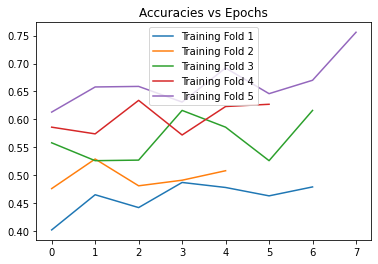

In [ ]:
plt.title('Accuracies vs Epochs')
plt.plot(model_history[0].history['accuracy'], label='Training Fold 1')
plt.plot(model_history[1].history['accuracy'], label='Training Fold 2')
plt.plot(model_history[2].history['accuracy'], label='Training Fold 3')
plt.plot(model_history[3].history['accuracy'], label='Training Fold 4')
plt.plot(model_history[4].history['accuracy'], label='Training Fold 5')
plt.legend()
plt.show()

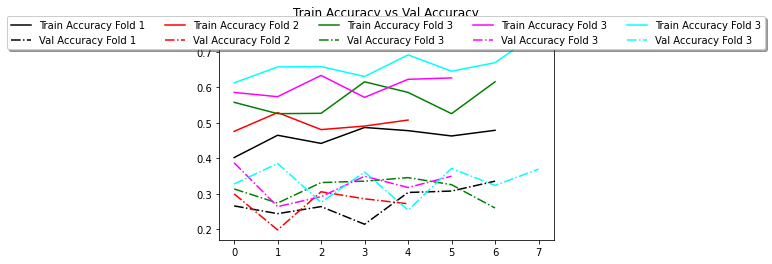

In [ ]:
plt.title('Train Accuracy vs Val Accuracy')
plt.plot(model_history[0].history['accuracy'], label='Train Accuracy Fold 1', color='black')
plt.plot(model_history[0].history['val_accuracy'], label='Val Accuracy Fold 1', color='black', linestyle = "dashdot")
plt.plot(model_history[1].history['accuracy'], label='Train Accuracy Fold 2', color='red', )
plt.plot(model_history[1].history['val_accuracy'], label='Val Accuracy Fold 2', color='red', linestyle = "dashdot")
plt.plot(model_history[2].history['accuracy'], label='Train Accuracy Fold 3', color='green', )
plt.plot(model_history[2].history['val_accuracy'], label='Val Accuracy Fold 3', color='green', linestyle = "dashdot")
plt.plot(model_history[3].history['accuracy'], label='Train Accuracy Fold 3', color='magenta', )
plt.plot(model_history[3].history['val_accuracy'], label='Val Accuracy Fold 3', color='magenta', linestyle = "dashdot")
plt.plot(model_history[4].history['accuracy'], label='Train Accuracy Fold 3', color='cyan', )
plt.plot(model_history[4].history['val_accuracy'], label='Val Accuracy Fold 3', color='cyan', linestyle = "dashdot")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=5, fancybox=True, shadow=True)
#plt.legend()
plt.show()

In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'cnsvc_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

In [ ]:
cnsv_pred = cnsv.predict(test_batches)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_batches.classes, cnsv_pred)


0.627

In [ ]:
opt = tf.keras.optimizers.SGD(learning_rate=0.001, momentum=0.9)
cnsv.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
import pickle

filename = 'cnsv_model.sav'
pickle.dump(cnsv, open(filename, 'wb'))

In [ ]:

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(test_batches, test_label)
print(result)

## <font color='purple'> a) CNN layers as SVM - Using SVM as classifier </font>


In [8]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import numpy as np
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import optimizers
from tensorflow.keras.layers import BatchNormalization


In [9]:
cnsvc = Sequential()
cnsvc.add(Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)))
cnsvc.add(BatchNormalization())

cnsvc.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
cnsvc.add(BatchNormalization())
cnsvc.add(MaxPooling2D((2, 2)))


cnsvc.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsvc.add(BatchNormalization())

cnsvc.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsvc.add(BatchNormalization())

cnsvc.add(MaxPooling2D((2, 2)))
cnsvc.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsvc.add(BatchNormalization())

cnsvc.add(Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsvc.add(BatchNormalization())

cnsvc.add(MaxPooling2D((2, 2)))
cnsvc.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsvc.add(BatchNormalization())

cnsvc.add(Conv2D(96, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsvc.add(BatchNormalization())
cnsvc.add(MaxPooling2D((2, 2)))


cnsvc.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsvc.add(BatchNormalization())

cnsvc.add(Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
cnsvc.add(BatchNormalization())
cnsvc.add(MaxPooling2D((2, 2)))

cnsvc.add(Conv2D(64, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
cnsvc.add(BatchNormalization())

cnsvc.add(Conv2D(4, (3, 3), activation='sigmoid', kernel_initializer='he_uniform', padding='same'))
cnsvc.add(BatchNormalization())

cnsvc.add(Dropout(0.2))


In [11]:
cnsvc.add(Flatten())
cnsvc.add(Dense(4, activation='relu', kernel_initializer='he_uniform'))
cnsvc.add(Dense(4, activation='softmax'))

In [197]:
cnsvc.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_72 (Conv2D)          (None, 222, 222, 16)      448       
                                                                 
 batch_normalization_48 (Bat  (None, 222, 222, 16)     64        
 chNormalization)                                                
                                                                 
 conv2d_73 (Conv2D)          (None, 222, 222, 16)      2320      
                                                                 
 batch_normalization_49 (Bat  (None, 222, 222, 16)     64        
 chNormalization)                                                
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 111, 111, 16)     0         
 g2D)                                                            
                                                      

In [25]:
cnsvc.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])

In [20]:
cnsvc.layers[31]._name='flat15'
print(cnsvc.layers[31].name)

flat15


In [21]:
from keras.models import Model


cnsvc_base = Model(inputs=cnsvc.input, outputs=cnsvc.get_layer('flat15').output)


In [26]:
def r_extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 144 ))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(224, 224),
      batch_size=batch_size,
      class_mode='binary')

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = cnsvc_base.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [13]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 150
epoch = 10
val_size = 501

In [27]:
train_feature, train_label = r_extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
val_feature, val_label = r_extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
test_feature, test_label = r_extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [29]:
np.array(test_feature).shape

(1000, 144)

In [ ]:
from keras import metrics


#sp_sn = tf.keras.metrics.SpecificityAtSensitivity(0.6)
#sn_sp = tf.keras.metrics.SensitivityAtSpecificity(0.6)

#metrics=['accuracy', 'FalseNegatives', 'Precision', 'Recall', sp_sn, sn_sp, 'AUC']

cnsvc.compile(loss='categorical_crossentropy',optimizer='sgd', metrics='accuracy')  

In [30]:
!pip install -q memory_profiler 

In [31]:
%load_ext memory_profiler

In [ ]:
#import memory_profiler

In [ ]:
#from memory_profiler import profile


In [33]:
from sklearn.svm import SVC

cnnsvc = SVC(kernel='rbf', gamma=1, C=1, random_state=10, class_weight='balanced')

In [35]:

import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit cnnsvc.fit(train_feature, train_label)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  after removing the cwd from sys.path.


peak memory: 4935.68 MiB, increment: 9.20 MiB


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [36]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 18.232740000000035 duration2= 20.920467853546143


In [37]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'kcnn-svc_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

In [38]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(cnnsvc, val_feature, val_label, cv=5)
np.average(scores)
np.mean(scores)

0.1976039603960396

In [39]:
cnsc_pred = cnnsvc.predict(test_feature)

In [40]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_label, cnsc_pred)


0.241

In [41]:
confusion_matrix(test_label, cnsc_pred)


array([[184,  25,  41,   0],
       [189,  25,  36,   0],
       [188,  30,  32,   0],
       [161,  46,  43,   0]])

In [42]:
tn, fp, fn, tp = confusion_matrix(test_label, cnsc_pred)
cs_specificity = tn / (tn+fp)
cs_sensitivity = tp / (tp+fn)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


In [43]:
print(fn)

[188  30  32   0]


In [44]:
cs_specificity 

array([0.49329759, 0.5       , 0.53246753,        nan])

In [45]:
cs_sensitivity 

array([0.46131805, 0.60526316, 0.57333333,        nan])

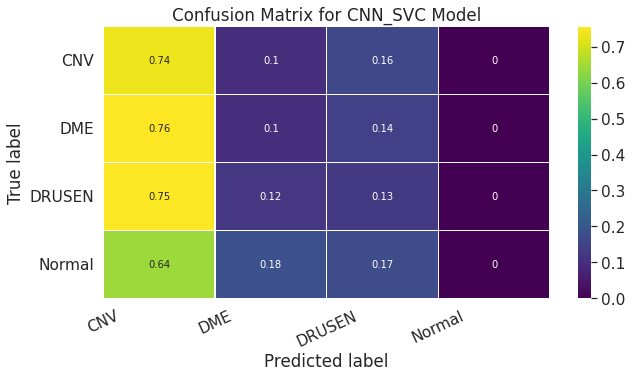

In [46]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(test_label, cnsc_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.viridis, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for CNN_SVC Model')
plt.show()

In [51]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

csvc = SVC(probability=True, class_weight='balanced')

csvc.fit(train_feature, train_label)

#test_labelz = test_labelz.reshape(-1,1)
cs_score = csvc.predict_proba(test_feature)

#Binarize the output
cs_bin = label_binarize(test_label, classes=[1, 2, 3, 4])
n_classes = cs_bin.shape[1]

#zf_score = zf_score.reshape(-1,1)
#val_pred  = val_pred.reshape(-1,1)
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(cs_bin[:, i], cs_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
#fpr["micro"], tpr["micro"], _ = metrics.roc_curve(test_labelz.ravel(), rzf_pred.ravel())
#roc_auc["micro"] = metrics.auc(fpr["micro"], tpr["micro"])

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


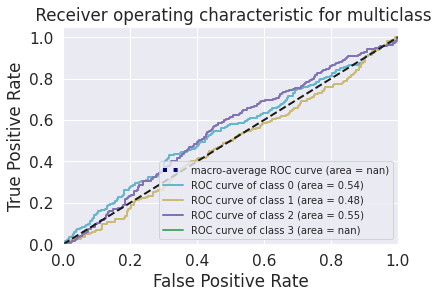

In [55]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])

'''# Plot all ROC curves
plt.figure()
plt.plot(
    fpr["micro"],
    tpr["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="deeppink",
    linestyle=":",
    linewidth=4,
)
'''
plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['c', 'y', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

c0 = 'CNV'
c1 = 'DME'
c2 = 'DRUSEN'
c3 ='NORMAL'


plt.rc('legend', fontsize=10)
plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title(" Receiver operating characteristic for multiclass")
plt.legend( loc="lower right")
plt.show()



In [56]:
print(classification_report(test_label, cnsc_pred))


              precision    recall  f1-score   support

         0.0       0.25      0.74      0.38       250
         1.0       0.20      0.10      0.13       250
         2.0       0.21      0.13      0.16       250
         3.0       0.00      0.00      0.00       250

    accuracy                           0.24      1000
   macro avg       0.17      0.24      0.17      1000
weighted avg       0.17      0.24      0.17      1000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


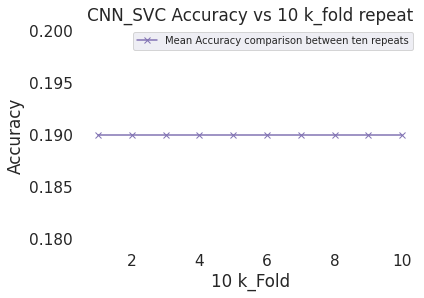

In [59]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	cnsc_scores = cross_val_score(cnnsvc, val_feature, val_label, scoring='accuracy', cv=cv)
	results.append(np.mean(cnsc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('CNN_SVC Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

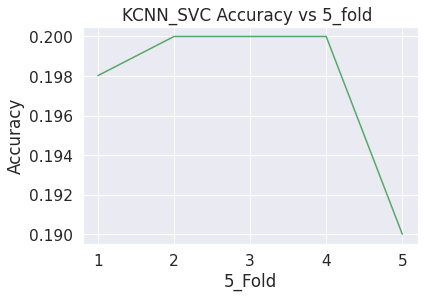

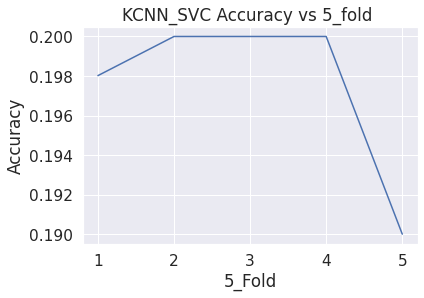

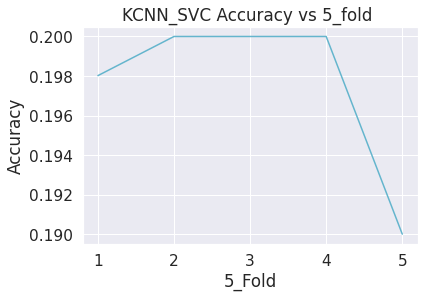

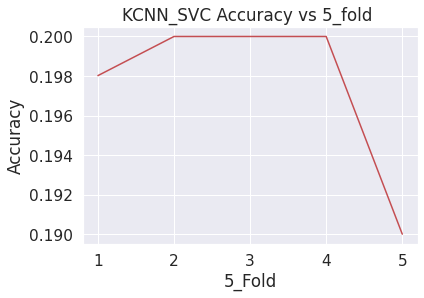

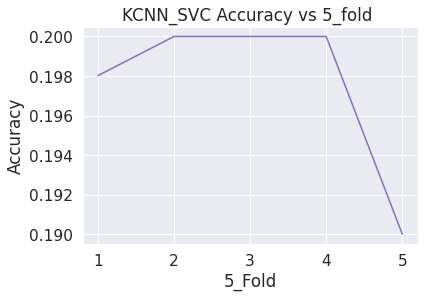

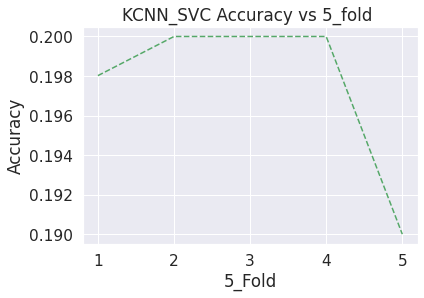

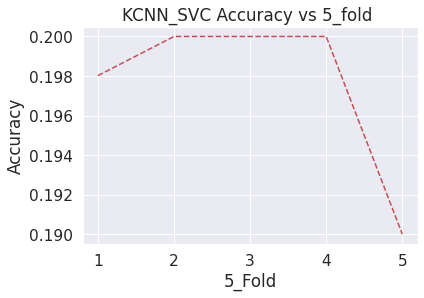

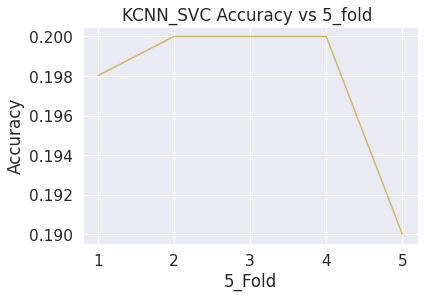

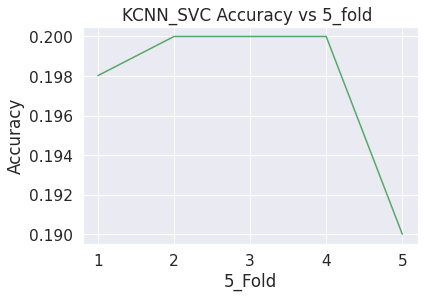

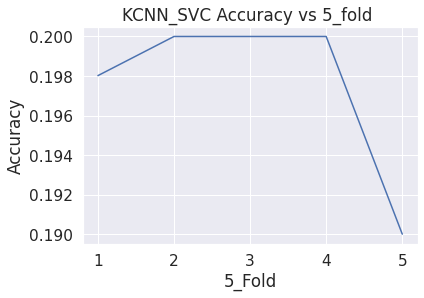

No handles with labels found to put in legend.


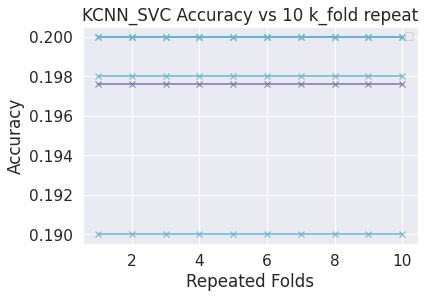

In [61]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(cnnsvc, val_feature, val_label, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('KCNN_SVC Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('KCNN_SVC Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [62]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(cnnsvc, val_feature, val_label, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())


> folds=1, accuracy=0.198 (0.190,0.200)
> folds=2, accuracy=0.198 (0.190,0.200)
> folds=3, accuracy=0.198 (0.190,0.200)
> folds=4, accuracy=0.198 (0.190,0.200)
> folds=5, accuracy=0.198 (0.190,0.200)
> folds=6, accuracy=0.198 (0.190,0.200)
> folds=7, accuracy=0.198 (0.190,0.200)
> folds=8, accuracy=0.198 (0.190,0.200)
> folds=9, accuracy=0.198 (0.190,0.200)
> folds=10, accuracy=0.198 (0.190,0.200)


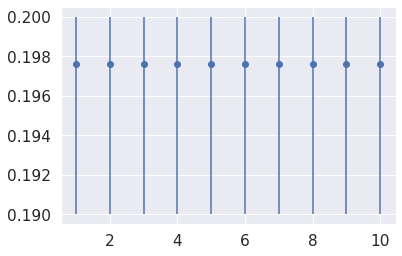

In [63]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(cnsvc, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

# <font color='blue'> Using Machine learning Algorithms (Random Forest, XGBoost)


## <font color='purple'> Using Random Forest as feature extractor and Classifier </font>

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV



rfc=RandomForestClassifier(random_state=42)
param_grid = { 
    'min_samples_leaf': [2, 4],
    'max_features': ['auto', 'sqrt'],
    'max_depth' : [10,20],
    'criterion' :['gini', 'entropy']
}
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
CV_rfc.fit(sval_data, sval_label)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 20],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [2, 4]})

In [ ]:
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'max_features': 'auto',
 'min_samples_leaf': 2}

In [ ]:
import pickle
import time
#import scalene

In [ ]:
#from scalene import scalene_profiler


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2, max_features='auto', class_weight='balanced')


In [ ]:
start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


rforest.fit(strain_data, strain_label)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 160.16377699999998 duration2= 162.19242334365845


In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'forest_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

In [ ]:
rf_pred = rforest.predict(stest_data)

In [ ]:

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(ptest_data, ptest_label)
print(result)

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(rforest, sval_data, sval_label, cv=5)
np.average(scores)
np.mean(scores)

0.4095238095238095

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(stest_label, rf_pred)


0.34933333333333333

In [ ]:
confusion_matrix(stest_label,rf_pred)

array([[ 69,   4,  28,  84],
       [ 39,   1,  19, 126],
       [ 26,   1,  35, 130],
       [ 11,   0,  20, 157]])

In [ ]:
tn, fp, fn, tp = confusion_matrix(stest_label, rf_pred)
rf_specificity = tn / (tn+fp)
rf_sensitivity = tp / (tp+fn)

In [ ]:
rf_specificity 

array([0.63888889, 0.8       , 0.59574468, 0.4       ])

In [ ]:
rf_sensitivity 

array([0.2972973 , 0.        , 0.36363636, 0.54703833])

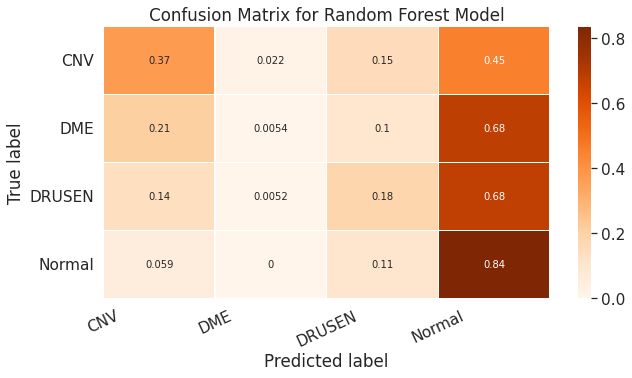

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(stest_label, rf_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(10,5))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Oranges, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Random Forest Model')
plt.show()

In [ ]:
print(classification_report(stest_label, rf_pred))


              precision    recall  f1-score   support

         0.0       0.48      0.37      0.42       185
         1.0       0.17      0.01      0.01       185
         2.0       0.34      0.18      0.24       192
         3.0       0.32      0.84      0.46       188

    accuracy                           0.35       750
   macro avg       0.33      0.35      0.28       750
weighted avg       0.33      0.35      0.28       750



In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

rf1 = RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=4, class_weight='balanced')
rf1.fit(strain_data, strain_label)
rf_score = rforest.predict_proba(stest_data)

#Binarize the output
rf_bin = label_binarize(stest_label, classes=[1, 2, 3, 4])
n_classes = rf_bin.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(rf_bin[:, i], rf_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


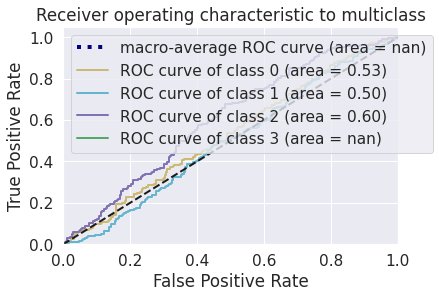

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['y','c', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

#fig, ax = plt.subplots(figsize=(8, 6))

ax.set_facecolor = 'white'
plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic to multiclass")
plt.legend(loc="upper left")
plt.show()

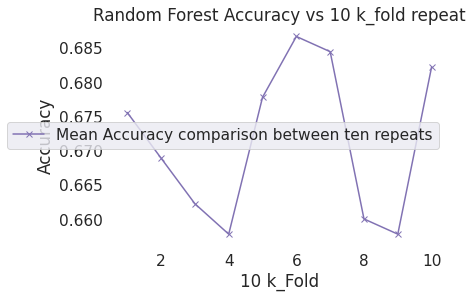

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	rfc_scores = cross_val_score(rforest, svalcv_data, svalcv_label, scoring='accuracy', cv=cv)
	results.append(np.mean(rfc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

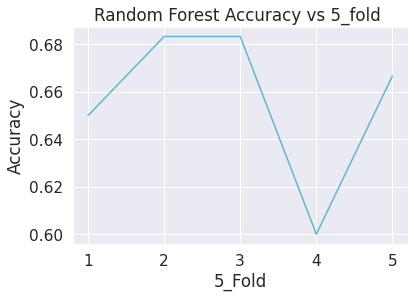

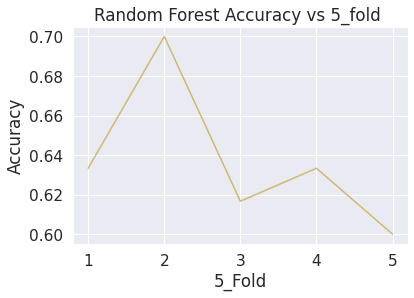

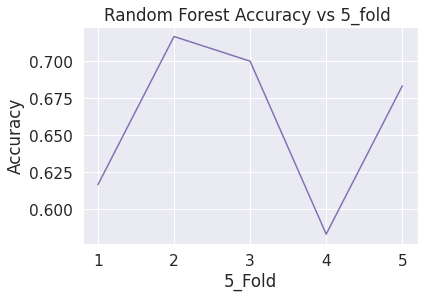

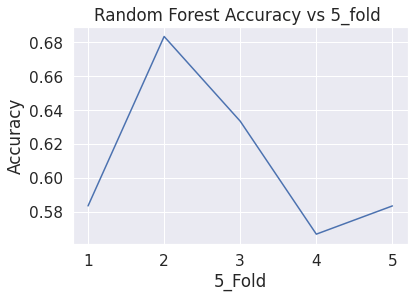

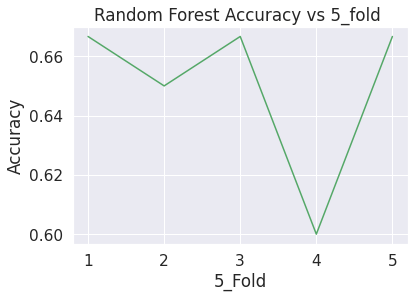

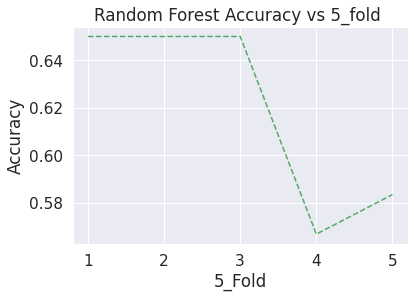

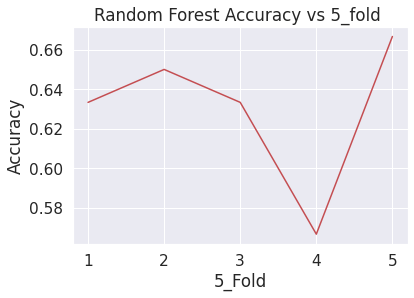

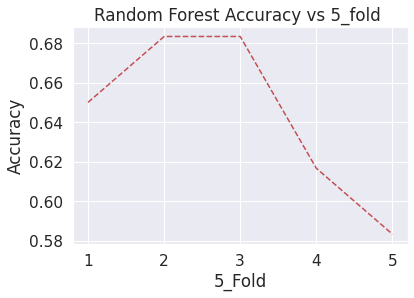

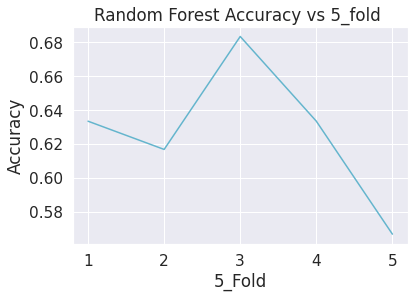

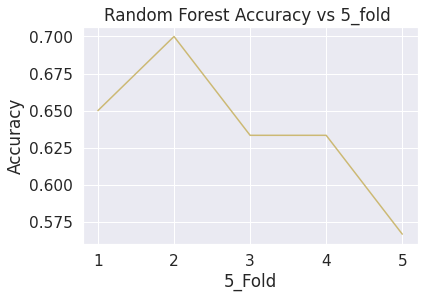

No handles with labels found to put in legend.


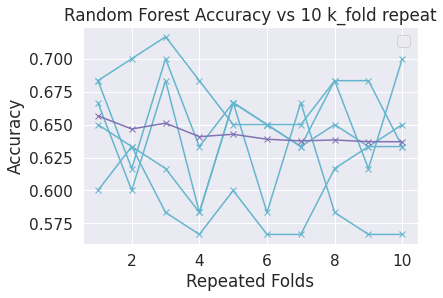

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(rforest, sval_data, sval_label, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('Random Forest Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('Random Forest Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(rforest, svalcv_data, svalcv_label, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(rforest,LeaveOneOut())


> folds=1, accuracy=0.669 (0.600,0.744)
> folds=2, accuracy=0.647 (0.600,0.733)
> folds=3, accuracy=0.671 (0.600,0.789)
> folds=4, accuracy=0.647 (0.578,0.756)
> folds=5, accuracy=0.676 (0.622,0.778)
> folds=6, accuracy=0.669 (0.600,0.711)
> folds=7, accuracy=0.678 (0.600,0.744)
> folds=8, accuracy=0.640 (0.589,0.711)
> folds=9, accuracy=0.678 (0.611,0.778)
> folds=10, accuracy=0.671 (0.633,0.733)


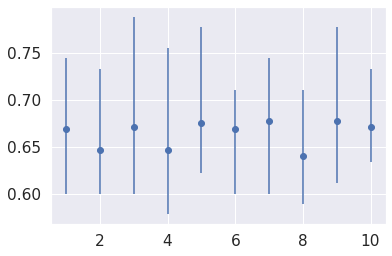

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(rforest, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

In [ ]:
!pip install -q scikit-plot

In [ ]:
import scikitplot as skplt
import matplotlib.pyplot as plt

y_true = stest_label
y_probas = rf_pred
skplt.metrics.plot_roc_curve(stest_label, rf_pred)
plt.show()

## <font color='purple'> Using XGBoost for Classification </font>

In [9]:
import math

n = 150
#number_of_examples = len(train_batches.filenames)
number_generator = math.ceil(2250 / (1.0 * n)) 
#number_generator = round((2250 / (1.0 * n)), 2)

# 1.0 above is to skip integer division

xtrain_label = []
xtrain_data = []

for i in range(0,int(number_generator)):
    xtrain_label.extend(np.array(train_generator1[i][1]))
    xtrain_data.extend(np.array(train_generator1[i][0]))


In [10]:
xtrain_label = np.array(xtrain_label)
xtrain_data = np.array(xtrain_data)

In [11]:
np.array(xtrain_data).shape

(2250, 224, 224, 3)

In [12]:
xtrain_data = xtrain_data.reshape([2250, 224*224*3])

In [13]:

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(750 / (1.0 * n)) 
#number_generator = round((750 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

xtest_label = []
xtest_data = []

for i in range(0,int(number_generator)):
    xtest_label.extend(np.array(test_generator1[i][1]))
    xtest_data.extend(np.array(test_generator1[i][0]))


In [14]:
xtest_label = np.array(xtest_label)
xtest_data = np.array(xtest_data)

In [15]:
xtest_label.shape

(750,)

In [16]:
xtest_data = xtest_data.reshape([750, 224*224*3])

In [17]:
n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(300 / (1.0 * n)) 
#number_generator = round((300 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

xval_label1 = []
xval_data1 = []

for i in range(0,int(number_generator)):
    xval_label1.extend(np.array(val_generator1[i][1]))
    xval_data1.extend(np.array(val_generator1[i][0]))


In [18]:
xval_label = np.array(xval_label1)
xval_data = np.array(xval_data1)

In [19]:
xval_data.shape

(300, 224, 224, 3)

In [20]:
xval_data = xval_data.reshape (300, 224*224*3)

In [21]:
n = 150
#number_of_examples = len(test_batches.filenames)
#number_generator = math.ceil(500 / (1.0 * n)) 
number_generator = round((500 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

xval_label2 = []
xval_data2 = []

for i in range(0,int(number_generator)):
    xval_label2.extend(np.array(val_generator1[i][1]))
    xval_data2.extend(np.array(val_generator1[i][0]))


In [22]:
xvalcv_label = np.array(xval_label2)
xvalcv_data = np.array(xval_data2)

In [23]:
xvalcv_data.shape

(450, 224, 224, 3)

In [24]:
xvalcv_data = xvalcv_data.reshape (450, 224*224*3)

In [25]:
import xgboost as xgb
from xgboost import XGBClassifier

from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import StratifiedKFold


In [ ]:
import matplotlib.pyplot as plt

plt.bar(plt.bar((xtrain_label).index, freq_count(xtrain_label))

In [ ]:
import matplotlib.pyplot as plt

plt.bar(xtrain_label.value_counts().index, xtrain_label.value_counts().values)

AttributeError: ignored

In [29]:
param_grid = {"subsample" : [0.8],
'booster': ['gbtree', 'gblinear']}

In [31]:

from sklearn.model_selection import GridSearchCV

# Init classifier
xgb_cl = XGBClassifier(objective="binary:logistic")

# Init Grid Search
grid_cv = GridSearchCV(xgb_cl, param_grid, n_jobs=-1, cv=3, scoring="roc_auc")

# Fit
grid_cv.fit(xval_data, xval_label)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:972: UserWarning: One or more of the test scores are non-finite: [nan nan]
  category=UserWarning,


KeyboardInterrupt: ignored

In [ ]:
grid_cv_2.best_score_


In [27]:
xgbc = xgb.XGBClassifier(random_state=123)

In [ ]:
final_cl = xgb.XGBClassifier(
    **grid_cv.best_params_,
    objective="binary:logistic",
    colsample_bytree=0.5,
    subsample=0.8

In [ ]:

from sklearn.metrics import roc_auc_score

_ = xgb.fit(X_train, y_train)

preds = final_cl.predict(X_test)

In [ ]:
xgb_model = xgb.XGBClassifier()

#brute force scan for all parameters, here are the tricks
#usually max_depth is 6,7,8
#learning rate is around 0.05, but small changes may make big diff
#tuning min_child_weight subsample colsample_bytree can have 
#much fun of fighting against overfit 
#n_estimators is how many round of boosting
#finally, ensemble xgboost with multiple seeds may reduce variance


parameters = {
        'min_child_weight': [1,  10],
        'colsample_bytree': [0.2, 0.8],
        'max_depth': [10, 20]
        }

cv = StratifiedKFold( n_splits=5, shuffle=True) 

clf = GridSearchCV(xgb_model, parameters, n_jobs=5, 
                   cv=cv, 
                   scoring='accuracy',
                   verbose=1, refit=True)

clf.fit(xval_data, xval_label)

In [ ]:
#trust your CV!
best_parameters, score, _ = max(clf.grid_scores_, key=lambda x: x[1])
print('Raw AUC score:', score)
for param_name in sorted(best_parameters.keys()):
    print("%s: %r" % (param_name, best_parameters[param_name]))

test_probs = clf.predict_proba(xtest_data)[:,1]

In [ ]:
print(random_search.best_estimator_)


In [ ]:
folds = 3
param_comb = 5

skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 1001)

random_search = RandomizedSearchCV(xgb, param_distributions=params, n_iter=param_comb, scoring='roc_auc', n_jobs=4, cv=skf.split(X,Y), verbose=3, random_state=1001 )

# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X, Y)
timer(start_time) # timing ends here for "start_time" variable

In [ ]:
grid.best_params_

{'C': 1, 'gamma': 1, 'kernel': 'linear'}

In [26]:
xgbc = xgb.XGBClassifier(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)

In [ ]:
data_dmatrix = xgb.DMatrix(data=xtrain_data,label=xtrain_label)



In [ ]:
xgb.fit(xtrain_data, xtrain_label)

preds = xgb.predict(xtest_data)



In [28]:
from sklearn.utils import compute_class_weight
from sklearn.utils import class_weight

class_weights = class_weight.compute_class_weight(class_weight ='balanced', classes=np.unique(strain_label), y=np.array(strain_label))

class_weights = dict(zip(np.unique(xtrain_label), class_weights))

class_weights


NameError: ignored

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)
scores = cross_val_score(svc, svalcv_data, svalcv_label, cv=cv)
np.average(scores)
np.mean(scores)

0.4755555555555555

In [ ]:
scores

array([0.46666667, 0.6       , 0.46666667, 0.46666667, 0.36666667,
       0.53333333, 0.53333333, 0.43333333, 0.36666667, 0.46666667,
       0.53333333, 0.4       , 0.36666667, 0.5       , 0.63333333])

In [ ]:
!pip install -q -U scalene

     |████████████████████████████████| 588 kB 5.3 MB/s 
     |████████████████████████████████| 229 kB 49.5 MB/s 
     |████████████████████████████████| 51 kB 6.0 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gym 0.17.3 requires cloudpickle<1.7.0,>=1.2.0, but you have cloudpickle 2.0.0 which is incompatible.


In [29]:
import pickle
import time
#import scalene

In [ ]:
#from scalene import scalene_profiler


In [30]:
xgb_c = XGBClassifier(learning_rate=0.02, objective='binary:logistic', class_weight='balanced',
                    silent=True, nthread=1)

In [ ]:
start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


xgbc.fit(xtrain_data, xtrain_label)

# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """Entry point for launching an IPython kernel.


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 2139.2229389999998 duration2= 1109.5825235843658


In [ ]:
print(scalene.scalene_statistics)
print(scalene.scalene_output)

<module 'scalene.scalene_statistics' from '/usr/local/lib/python3.7/dist-packages/scalene/scalene_statistics.py'>
<module 'scalene.scalene_output' from '/usr/local/lib/python3.7/dist-packages/scalene/scalene_output.py'>


In [ ]:

# save the model to disk
filename = '/content/drive/MyDrive/OCT2017_2/svc_model.sav'
pickle.dump(svc, open(filename, 'wb'))
 

In [ ]:

# save the model to disk
filename = '/content/drive/MyDrive/OCT2017_2/svc_grd.sav'
pickle.dump(svc, open(filename, 'wb'))
 

In [ ]:
svc_pred = svc.predict(stest_data)

In [ ]:
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(stest_data, stest_label)
print(result)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(stest_label, svc_pred)


0.2906666666666667

In [ ]:
confusion_matrix(stest_label, svc_pred)


array([[46, 29, 31, 79],
       [32, 39, 27, 87],
       [43, 29, 38, 82],
       [34, 36, 23, 95]])

In [ ]:
tn, fp, fn, tp = confusion_matrix(stest_label, svc_pred)
svc_specificity = tn / (tn+fp)
svc_sensitivity = tp / (tp+fn)

In [ ]:
svc_specificity 

array([0.58974359, 0.42647059, 0.53448276, 0.47590361])

In [ ]:
svc_sensitivity 

array([0.44155844, 0.55384615, 0.37704918, 0.53672316])

In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

svc1 = SVC(probability = True, class_weight='balanced')
svc1.fit(stest_data, stest_label)
sv_score = svc1.predict_proba(sval_data)

#Binarize the output
sv_bin = label_binarize(sval_label, classes=[1, 2, 3, 4])
n_classes = sv_bin.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(sv_bin[:, i], sv_score[:, i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


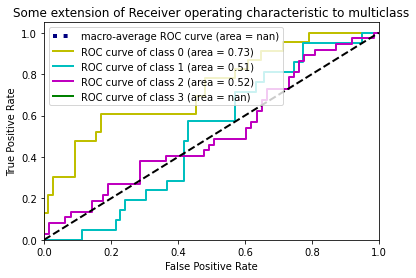

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])


plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(['y','c', 'm', 'g'])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="upper left")
plt.show()

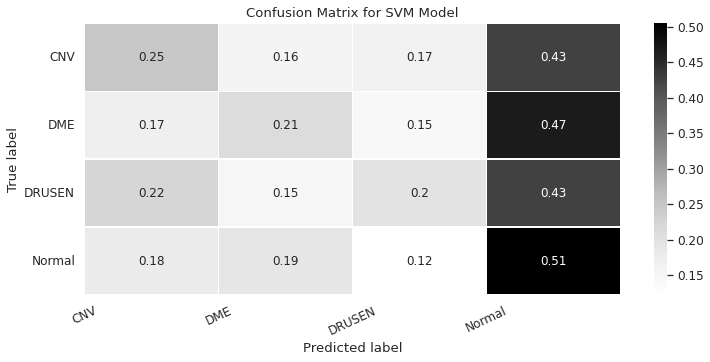

In [ ]:
import seaborn as sns

# Get and reshape confusion matrix data
matrix = confusion_matrix(stest_label, svc_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(12,5))
sns.set(font_scale=1.1)
sns.heatmap(matrix, annot=True, annot_kws={'size':12},
            cmap=plt.cm.Greys, linewidths=0.2)

# Add labels to the plot
class_names = ['CNV', 'DME', 'DRUSEN', 'Normal']
tick_marks = np.arange(len(class_names))
tick_marks2 = tick_marks + 0.5
plt.xticks(tick_marks, class_names, rotation=25)
plt.yticks(tick_marks2, class_names, rotation=0)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for SVM Model')
plt.show()

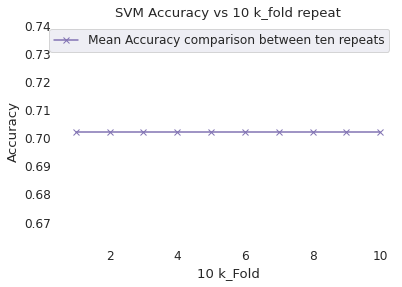

In [ ]:
import math
from scipy import stats
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score



repeat = range(1,11)
results = list()
lines = {'co','y-','m:', 'g*', 'b.','r^', 'k.', 'c--', 'yo', 'm-'}
linecycler = cycle(lines)
k_scores = []
i = 1


for r in repeat:
	# evaluate using a given number of repeats
	cv = KFold(n_splits=10, random_state=10, shuffle=True)
	svc_scores = cross_val_score(svc, svalcv_data, svalcv_label, scoring='accuracy', cv=cv)
	results.append(np.mean(svc_scores))
 
fig, ax = plt.subplots(nrows=1, ncols=1) 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xm-', label='Mean Accuracy comparison between ten repeats')

plt.title('SVM Accuracy vs 10 k_fold repeat')
plt.xlabel("10 k_Fold")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
 
#pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)

#print('>%d mean=%.4f se=%.3f' % (k, np.mean(scores), stats.sem(scores)))
	#k_scores.append(scores)
	#	cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=10)
#plt.figure(facecolor='white')
#next(linecycler)

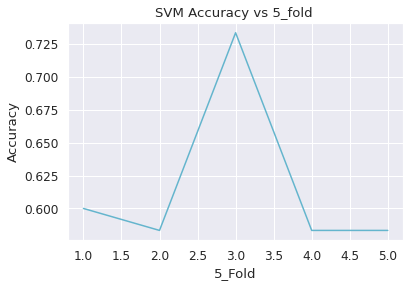

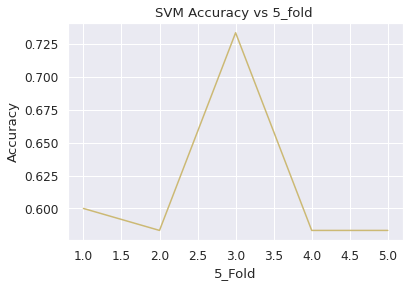

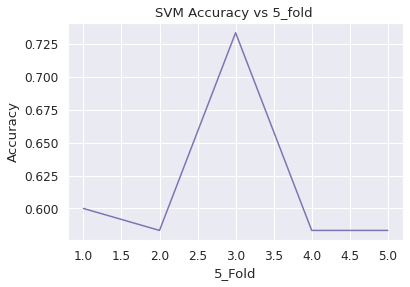

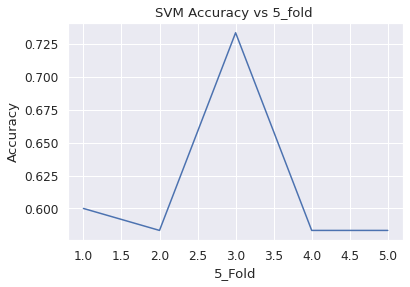

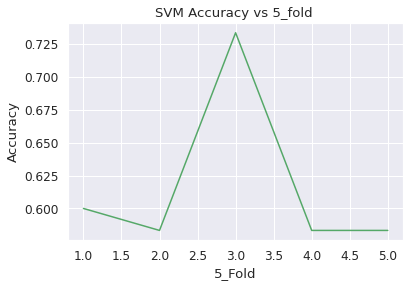

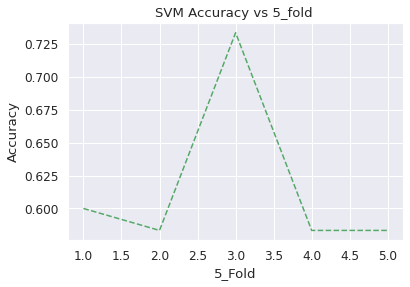

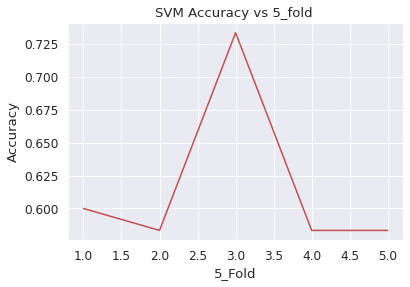

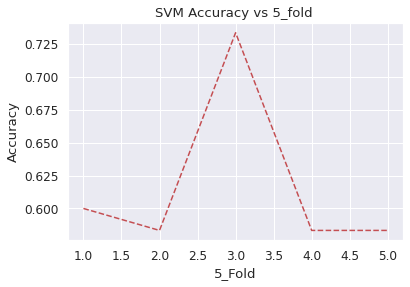

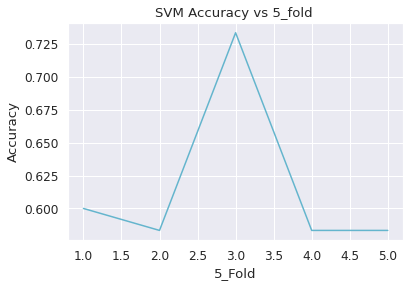

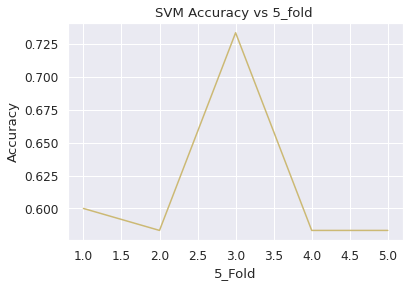

No handles with labels found to put in legend.


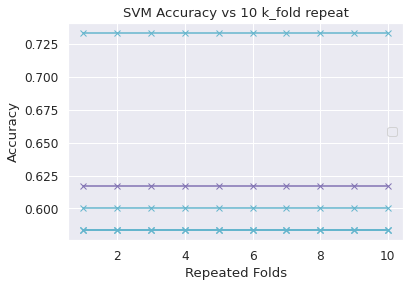

In [ ]:
import matplotlib.pyplot as plt

repeat = range(1,11)
results = list()
lines = {'y-','m-', 'g-', 'c-', 'm-', 'r-', 'b-', 'c-', 'r--', 'g--'}
linecycler = cycle(lines)
repeats = []



for r in repeat:
	# evaluate using a given number of repeats
  scores = cross_val_score(svc, sval_data, sval_label, scoring='accuracy', cv=5)
  results.append(scores)
  #fig = plt.figure(figsize=(6, 6))
  ax1, ax2 = fig.subplots(2, 5, sharey=True, sharex=True)
  plt.plot(range(1, 6), scores, next(linecycler), label='Accuracy scores vs ten folds')
  plt.title('SVM Accuracy vs 5_fold ')
  plt.xlabel("5_Fold")
  plt.ylabel("Accuracy")
  plt.show()
  repeats.append(np.mean(results))
 
ax.set_facecolor("white")
plt.plot(range(1, 11), results, 'xc-')
plt.plot(range(1, 11), repeats, 'xm-')
plt.title('SVM Accuracy vs 10 k_fold repeat')
plt.xlabel("Repeated Folds")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
def evaluate_model(model, cv):

	# evaluate the model
	scores = cross_val_score(svc, sval_data, sval_label, scoring='accuracy', cv=cv, n_jobs=-1)
	# return scores
	return np.mean(scores), scores.min(), scores.max()

In [ ]:
from sklearn.model_selection import LeaveOneOut

ideal, _, _ = evaluate_model(svc,LeaveOneOut())


> folds=1, accuracy=0.617 (0.583,0.733)
> folds=2, accuracy=0.617 (0.583,0.733)
> folds=3, accuracy=0.617 (0.583,0.733)
> folds=4, accuracy=0.617 (0.583,0.733)
> folds=5, accuracy=0.617 (0.583,0.733)
> folds=6, accuracy=0.617 (0.583,0.733)
> folds=7, accuracy=0.617 (0.583,0.733)
> folds=8, accuracy=0.617 (0.583,0.733)
> folds=9, accuracy=0.617 (0.583,0.733)
> folds=10, accuracy=0.617 (0.583,0.733)


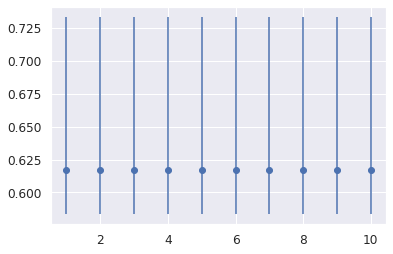

In [ ]:
folds = range(1,11)
# record mean and min/max of each set of results
means, mins, maxs = list(),list(),list()

# evaluate each k value
for k in folds:
	# define the test condition
	cv = KFold(n_splits=5, shuffle=True, random_state=1)
	# evaluate k value
	k_mean, k_min, k_max = evaluate_model(svc, 5)
	# report performance
	print('> folds=%d, accuracy=%.3f (%.3f,%.3f)' % (k, k_mean, k_min, k_max))
	# store mean accuracy
	means.append(k_mean)
	# store min and max relative to the mean
	mins.append(k_mean - k_min)
	maxs.append(k_max - k_mean)
# line plot of k mean values with min/max error bars
plt.errorbar(folds, means, yerr=[mins, maxs], fmt='o')
# plot the ideal case in a separate color
#plt.plot(folds, [ideal for _ in range(len(folds))], color='r')
# show the plot
plt.show()

## <font color='purple'> Using Random Forest and XGBoost And Ensemble Learning </font>

## <font color='blue'> Q5: Does performance of Model for classification of different Retina diseases vary with different evaluation measures, such as Accuracy, Recall, specificity, Confusion Matrix, ROC and Brier Score measures? </font>

In [ ]:
# how to compute the numer of trainable and non trainable weights in a model

from keras import backend as K
import numpy

trainable_count = int(numpy.sum([K.count_params(p) for p in set(model.trainable_weights)]))

non_trainable_count = int(numpy.sum([K.count_params(p) for p in set(model.non_trainable_weights)]))

print(trainable_count,non_trainable_count)

3996394 0


In [ ]:
# how to compute the memory allocated by the activations of a model

batch = 1
shapes_count = int(numpy.sum([numpy.prod(numpy.array([s if isinstance(s, int) 
                                                      else 1 for s in l.output_shape])) 
                              for l in model.layers]))
memory = shapes_count * 4 * batch

print(memory)

3643436


## <font color='purple'> Using Transfer learning VGG16 Net for Classification </font>

In [8]:

from keras.applications.vgg16 import VGG16
vgg_16 = VGG16()

553476096/553467096 [==============================] - 3s 0us/step


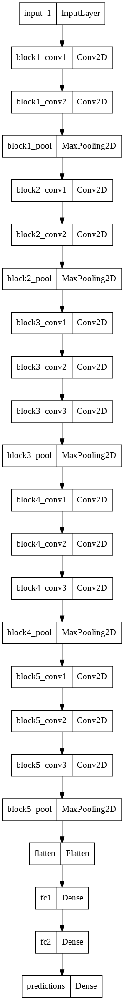

In [9]:
from keras.utils.vis_utils import plot_model

plot_model(vgg_16, to_file='vgg.png')

In [ ]:
# load the model

print(vgg_16.summary())

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [10]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 150
epoch = 10
val_size = 501



In [16]:
vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in vgg16_c.layers:
            layer.trainable = False

vgg16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [12]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
import numpy as np
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import optimizers
from tensorflow.keras.layers import BatchNormalization


In [43]:
vgg16c = Sequential()
vgg16c.add(vgg16)
vgg16c.add(Conv2D(256, (3, 3), activation='sigmoid', padding='same'))
vgg16c.add(BatchNormalization())

vgg16c.add(Conv2D(128, (3, 3), activation='sigmoid', padding='same'))
vgg16c.add(BatchNormalization())

vgg16c.add(Conv2D(64, (3, 3), activation='sigmoid', padding='same'))
vgg16c.add(BatchNormalization())

vgg16c.add(Conv2D(16, (3, 3), activation='sigmoid', padding='same'))
vgg16c.add(BatchNormalization())

vgg16c.add(Conv2D(4, (3, 3), activation='sigmoid', padding='same'))
vgg16c.add(BatchNormalization())
vgg16c.add(Dropout(0.5))

vgg16c.add(MaxPooling2D())

vgg16c.add(Flatten())

vgg16c.add(Dense(4,activation='relu'))
vgg16c.add(Dropout(0.5))
vgg16c.add(Dense(4,activation='softmax'))

In [51]:
vgg16cl = Sequential()
vgg16cl.add(vgg16)
vgg16cl.add(Flatten())
vgg16cl.add(Dense(4,activation='relu'))
vgg16cl.add(Dense(4,activation='relu'))
vgg16cl.add(Dense(4,activation='softmax'))

In [ ]:
flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(64, activation='relu')
dense_layer_2 = layers.Dense(16, activation='relu')
prediction_layer = layers.Dense(4, activation='softmax')


In [18]:
def extract_features(directory, sample_count):
  
  features = np.zeros(shape=(sample_count, 7, 7, 512))
  labels = np.zeros(shape=(sample_count))

  datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    
  
  generator = datagen.flow_from_directory(
      directory,
      target_size=(224, 224),
      batch_size=batch_size,
      class_mode='binary')
 

  i = 0
  for inputs_batch, labels_batch in generator:
    features_batch = vgg16_c.predict(inputs_batch)
    features[i * batch_size : (i + 1) * batch_size] = features_batch
    labels[i * batch_size : (i + 1) * batch_size] = labels_batch
  
    i += 1
    if i * batch_size >= sample_count:
      break
  
  return features, labels

In [19]:
train_features, train_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/train', 7752)
val_features, val_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/val', 501)
test_features, test_labels = extract_features('/content/drive/MyDrive/OCT2017-Data/test', 1000)

Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [20]:
train_features = np.reshape(train_features, (7752, 7 * 7 * 512))
validation_features = np.reshape(val_features, (501, 7 * 7 * 512))
test_features = np.reshape(test_features, (1000, 7* 7 * 512))

In [35]:
def Kermany2018(batch_size,image_size,data_dir):

    '''
    Publication : https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5
    Dataset : https://data.mendeley.com/datasets/rscbjbr9sj/3
    '''
    #train_size = 83484
    #test_size = 1000

    


    train_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    val_datagen = ImageDataGenerator(rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   rescale=1.0/255,
                                   horizontal_flip=True,
                                   fill_mode='nearest')
    test_datagen = ImageDataGenerator(rescale=1.0/255)

 
    train_path = data_dir +'/train'
    val_path = data_dir +'/val'
    test_path = data_dir+'/test'

    classes = ['CNV', 'DME','DRUSEN','NORMAL']

    train_batches = train_datagen.flow_from_directory(train_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    val_batches = val_datagen.flow_from_directory(val_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size,class_mode='categorical')
    test_batches = test_datagen.flow_from_directory(test_path, target_size=(image_size,image_size),color_mode='rgb', classes=classes, batch_size=batch_size, class_mode='categorical')

    return train_batches, val_batches, test_batches

In [36]:
train_batches, val_batches, test_batches = Kermany2018(150, 224, '/content/drive/MyDrive/OCT2017-Data/')


Found 7752 images belonging to 4 classes.
Found 501 images belonging to 4 classes.
Found 1000 images belonging to 4 classes.


In [37]:
num_of_classes = 4
train_size = 7752
test_size = 1000
batch_size = 150
epoch = 10
val_size = 501

In [ ]:
# add new classifier layers
flat1 = Flatten()(model.layers[-1].output)
class1 = Dense(1024, activation='relu')(flat1)
output = Dense(10, activation='softmax')(class1)

In [ ]:
# define new model
model = Model(inputs=model.inputs, outputs=output)

In [22]:
from keras import metrics

In [53]:
sp_sn = tf.keras.metrics.SpecificityAtSensitivity(0.6)
sn_sp = tf.keras.metrics.SensitivityAtSpecificity(0.6)

metrics=['accuracy', 'FalseNegatives', 'Precision', 'Recall', sp_sn, sn_sp, 'AUC']

#vgg16c.compile(loss='categorical_crossentropy',optimizer='sgd', metrics=metrics)  

vgg16cl.compile(loss='categorical_crossentropy',optimizer='sgd', metrics=metrics)  

In [46]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [54]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [55]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017_2/vgg16cl-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [30]:
!pip install -q memory_profiler 

In [31]:
%load_ext memory_profiler

In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit vgg16_c = vgg16cl.fit(train_batches, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batches, epochs=10, class_weight=class_weight, callbacks=callbacks_list, verbose=1)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/10
51/51 [==============================] - 141s 3s/step - loss: 1.3904 - accuracy: 0.3803 - false_negatives: 7650.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - specificity_at_sensitivity_5: 0.2502 - sensitivity_at_specificity_5: 0.3953 - auc: 0.5848 - val_loss: 1.3834 - val_accuracy: 0.4072 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_5: 0.0000e+00 - val_sensitivity_at_specificity_5: 0.4072 - val_auc: 0.6048
Epoch 2/10
51/51 [==============================] - 134s 3s/step - loss: 1.3863 - accuracy: 0.3357 - false_negatives: 7650.0000 - precision: 0.0000e+00 - recall: 0.0000e+00 - specificity_at_sensitivity_5: 0.0061 - sensitivity_at_specificity_5: 0.2146 - auc: 0.5514 - val_loss: 1.3828 - val_accuracy: 0.4072 - val_false_negatives: 501.0000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_specificity_at_sensitivity_5: 0.0000e+00 - val_sensitivity_at_specificity_5: 0.4072 - val_auc: 0.6043


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 1207.853111 duration2= 5582.793907165527


In [ ]:
np.save('/content/drive/MyDrive/OCT2017-Data/history-zfc.npy',zf_c.history)

In [ ]:
history-zfc=np.load('/content/drive/MyDrive/OCT2017-Data/history-zfc.npy',allow_pickle='TRUE').item()


In [ ]:
best_epoch_model = np.argmin(zf_c.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, zf_c.history['val_loss'][best_epoch_model], zf_c.history['val_accuracy'][best_epoch_model]))

best epoch:9 validation loss:1.188 validation acc:0.487


In [ ]:
print(zf_c.history.keys())

dict_keys(['loss', 'accuracy', 'false_negatives', 'precision', 'recall', 'specificity_at_sensitivity_13', 'sensitivity_at_specificity_1', 'auc', 'val_loss', 'val_accuracy', 'val_false_negatives', 'val_precision', 'val_recall', 'val_specificity_at_sensitivity_13', 'val_sensitivity_at_specificity_1', 'val_auc'])


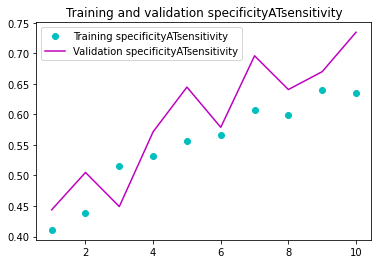

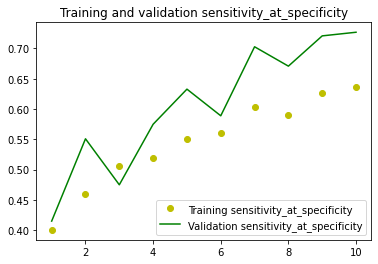

In [ ]:
import matplotlib.pyplot as plt

specificityATsensitivity = zf_c.history['specificity_at_sensitivity_13']
sensitivityATspecificity = zf_c.history['sensitivity_at_specificity_1']
val_specificityATsensitivity = zf_c.history['val_specificity_at_sensitivity_13']
val_sensitivityATspecificity = zf_c.history['val_sensitivity_at_specificity_1']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training specificityATsensitivity')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation specificityATsensitivity')
plt.title('Training and validation specificityATsensitivity')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training sensitivity_at_specificity')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation sensitivity_at_specificity')
plt.title('Training and validation sensitivity_at_specificity')
plt.legend()
plt.show()

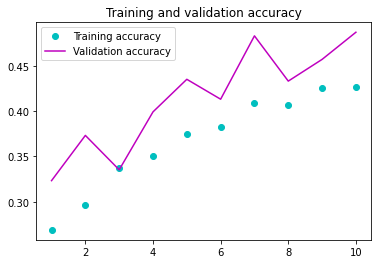

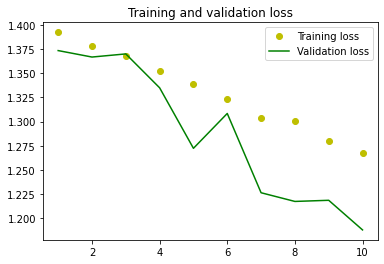

In [ ]:
import matplotlib.pyplot as plt

acc = zf_c.history['accuracy']
val_acc = zf_c.history['val_accuracy']
loss = zf_c.history['loss']
val_loss = zf_c.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'co', label='Training accuracy')
plt.plot(epochs, val_acc, 'm', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'yo', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

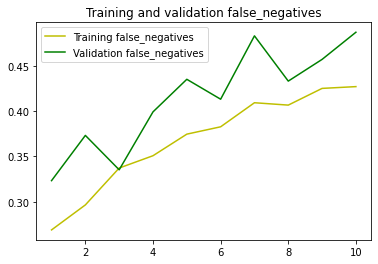

In [ ]:
import matplotlib.pyplot as plt

falseNegatives = zf_c.history['false_negatives']
val_falseNegatives = zf_c.history['val_false_negatives']


epochs = range(1, len(falseNegatives) + 1)

plt.plot(epochs, acc, 'y-', label='Training false_negatives')
plt.plot(epochs, val_acc, 'g', label='Validation false_negatives')
plt.title('Training and validation false_negatives')
plt.legend()



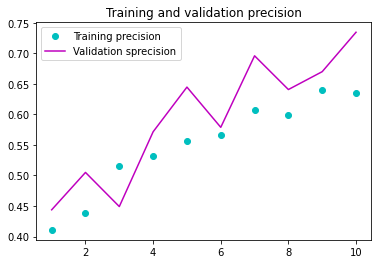

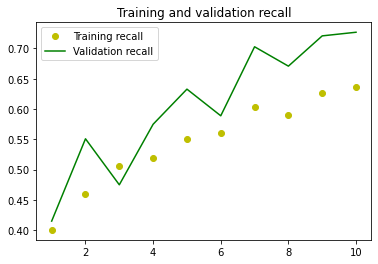

In [ ]:
import matplotlib.pyplot as plt

Precision = zf_c.history['precision']
Recall = zf_c.history['recall']
val_Precision = zf_c.history['val_precision']
val_Recall = zf_c.history['val_recall']

epochs = range(1, len(specificityATsensitivity) + 1)

plt.plot(epochs, specificityATsensitivity, 'co', label='Training precision')
plt.plot(epochs, val_specificityATsensitivity, 'm', label='Validation sprecision')
plt.title('Training and validation precision')
plt.legend()

plt.figure()

plt.plot(epochs, sensitivityATspecificity, 'yo', label='Training recall')
plt.plot(epochs, val_sensitivityATspecificity, 'g', label='Validation recall')
plt.title('Training and validation recall')
plt.legend()
plt.show()

In [ ]:
zf_pred =zf.predict(test_batchez)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


#Confution Matrix and Classification Report
zf_pred = np.argmax(zf_pred, axis=1)

cm_zf = confusion_matrix(test_batchez.classes, zf_pred)

print('Confusion Matrix')
print(cm_zf)


Confusion Matrix
[[ 42  36  38 134]
 [ 41  40  46 123]
 [ 61  25  56 108]
 [ 38  33  42 137]]


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_batchez.classes, zf_pred)


0.275

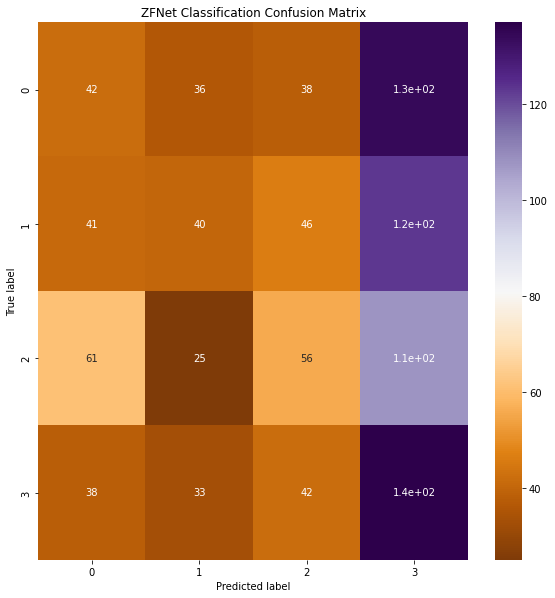

In [ ]:
import seaborn as sns


figure = plt.figure(figsize=(8, 8))
sns.heatmap(cm_zf, annot=True,cmap=plt.cm.PuOr)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.title('ZFNet Classification Confusion Matrix')
plt.show()

In [ ]:
import math

n = 150
#number_of_examples = len(train_batches.filenames)
number_generator = math.ceil(2250 / (1.0 * n)) 
#number_generator = round((2250 / (1.0 * n)), 2)

# 1.0 above is to skip integer division

ztrain_label = []
ztrain_data = []

for i in range(0,int(number_generator)):
    ztrain_label.extend(np.array(train_generator1[i][1]))
    ztrain_data.extend(np.array(train_generator1[i][0]))


In [ ]:
ztrain_label = np.array(ztrain_label)
ztrain_data = np.array(ztrain_data)

In [ ]:
np.array(ztrain_data).shape

(2250, 224, 224, 3)

In [ ]:
ztrain_data = ztrain_data.reshape([2250, 224*224*3])

In [ ]:

n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(750 / (1.0 * n)) 
#number_generator = round((750 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

ztest_label = []
ztest_data = []

for i in range(0,int(number_generator)):
    ztest_label.extend(np.array(test_generator1[i][1]))
    ztest_data.extend(np.array(test_generator1[i][0]))


In [ ]:
ztest_label = np.array(ztest_label)
ztest_data = np.array(ztest_data)

In [ ]:
ztest_label.shape

In [ ]:
ztest_data = ztest_data.reshape([750, 224*224*3])

In [ ]:
n = 150
#number_of_examples = len(test_batches.filenames)
number_generator = math.ceil(300 / (1.0 * n)) 
#number_generator = round((300 / (1.0 * n)), 2)
# 1.0 above is to skip integer division

zval_label1 = []
zval_data1 = []

for i in range(0,int(number_generator)):
    zval_label1.extend(np.array(val_generator1[i][1]))
    zval_data1.extend(np.array(val_generator1[i][0]))


In [ ]:
zval_label = np.array(zval_label1)
zval_data = np.array(zval_data1)

In [ ]:
zval_data.shape

In [ ]:
zval_data = zval_data.reshape (300, 224*224*3)

In [ ]:
!pip install -q memory_profiler 

In [ ]:
%load_ext memory_profiler

In [ ]:
import memory_profiler

In [ ]:
from memory_profiler import profile


In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017_2/zfnet3-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [ ]:
import time

start1 = time.clock()
start2 = time.time()

# Turn profiling on
#scalene_profiler.start()
#scalene.scalene_statistics

#scalene.scalene_signals


%memit zf.fit(train_batchez, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batchez, epochs=10, class_weight=class_weight, callbacks=callbacks_list, verbose=1)


# Turn profiling off
#scalene_profiler.start()

end1 = time.clock()
end2 = time.time()

duration1 = end1 - start1
duration2 = end2 - start2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  This is separate from the ipykernel package so we can avoid doing imports until


Epoch 1/10
51/51 [==============================] - 122s 2s/step - loss: 1.2366 - accuracy: 0.4629 - val_loss: 1.1082 - val_accuracy: 0.5170
Epoch 2/10
51/51 [==============================] - 114s 2s/step - loss: 1.2096 - accuracy: 0.4658 - val_loss: 1.0869 - val_accuracy: 0.5309
Epoch 3/10
51/51 [==============================] - 114s 2s/step - loss: 1.1908 - accuracy: 0.4796 - val_loss: 1.2013 - val_accuracy: 0.4351
Epoch 4/10
51/51 [==============================] - 114s 2s/step - loss: 1.1771 - accuracy: 0.4897 - val_loss: 1.1420 - val_accuracy: 0.4950
Epoch 5/10
51/51 [==============================] - 115s 2s/step - loss: 1.1747 - accuracy: 0.4894 - val_loss: 1.0177 - val_accuracy: 0.5689
Epoch 6/10
51/51 [==============================] - 120s 2s/step - loss: 1.1467 - accuracy: 0.5060 - val_loss: 0.9977 - val_accuracy: 0.5888
Epoch 7/10
51/51 [==============================] - 183s 4s/step - loss: 1.1096 - accuracy: 0.5142 - val_loss: 1.0200 - val_accuracy: 0.5429
Epoch 8/10
51

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [ ]:
print('duration1=', duration1, 'duration2=', duration2)

duration1= 1269.5429570000001 duration2= 1472.9655635356903


In [ ]:
zf_history = zf.fit_generator(train_batchez, shuffle=False, steps_per_epoch=(train_size//batch_size), validation_data=val_batchez, epochs=epoch, callbacks=callbacks_list, verbose=1, class_weight=class_weight)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  """Entry point for launching an IPython kernel.


Epoch 1/10
51/51 [==============================] - 2100s 42s/step - loss: 1.4049 - accuracy: 0.2579 - val_loss: 1.3748 - val_accuracy: 0.3174
Epoch 2/10
51/51 [==============================] - 156s 3s/step - loss: 1.3813 - accuracy: 0.2905 - val_loss: 1.3742 - val_accuracy: 0.3154
Epoch 3/10
51/51 [==============================] - 149s 3s/step - loss: 1.3733 - accuracy: 0.3153 - val_loss: 1.3504 - val_accuracy: 0.3852
Epoch 4/10
51/51 [==============================] - 117s 2s/step - loss: 1.3653 - accuracy: 0.3358 - val_loss: 1.3448 - val_accuracy: 0.3912
Epoch 5/10
51/51 [==============================] - 118s 2s/step - loss: 1.3476 - accuracy: 0.3613 - val_loss: 1.2980 - val_accuracy: 0.4212
Epoch 6/10
51/51 [==============================] - 117s 2s/step - loss: 1.3319 - accuracy: 0.3766 - val_loss: 1.2677 - val_accuracy: 0.4571
Epoch 7/10
51/51 [==============================] - 118s 2s/step - loss: 1.3234 - accuracy: 0.3822 - val_loss: 1.2656 - val_accuracy: 0.4711
Epoch 8/10


In [ ]:
best_epoch_model = np.argmin(zf_history.history['val_loss'])
print("best epoch:%s validation loss:%.3f validation acc:%.3f" %(best_epoch_model, zf_history.history['val_loss'][best_epoch_model], zf_history.history['val_accuracy'][best_epoch_model]))

best epoch:9 validation loss:1.190 validation acc:0.475


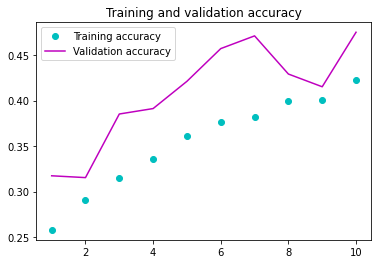

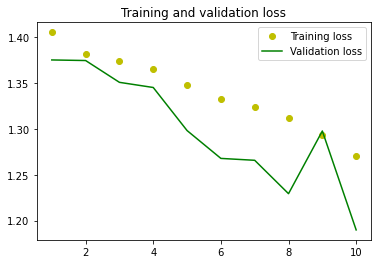

In [ ]:
import matplotlib.pyplot as plt

acc = zf_history.history['accuracy']
val_acc = zf_history.history['val_accuracy']
loss = zf_history.history['loss']
val_loss = zf_history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'co', label='Training accuracy')
plt.plot(epochs, val_acc, 'm', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'yo', label='Training loss')
plt.plot(epochs, val_loss, 'g', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [ ]:
np.save('/content/drive/MyDrive/OCT2017-Data/history1.npy',zf_history.history)

In [ ]:
history1=np.load('/content/drive/MyDrive/OCT2017-Data/history1.npy',allow_pickle='TRUE').item()


In [ ]:
zf_scores = zf.evaluate_generator(val_batchez)
print("%s: %.2f%%" % (zf.metrics_names[1], zf_scores[1]*100))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


accuracy: 48.10%


In [ ]:
import numpy as np
import pandas as pd
import os
from sklearn.model_selection import KFold, StratifiedKFold
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint



#set early stopping criteria
pat = 3 #this is the number of epochs with no improvment after which the training will stop
early_stopping = EarlyStopping(monitor='accuracy', patience=pat, verbose=1)

#define the model checkpoint callback -> this will keep on saving the model as a physical file
model_checkpoint = ModelCheckpoint('zf_oct_1.h5', verbose=1, save_best_only=True)

#define a function to fit the model
def fit_and_evaluate(train, val, EPOCHS=8, BATCH_SIZE=50):
    model = None
    model = zf
    results = model.fit(train, epochs=EPOCHS, batch_size=BATCH_SIZE, callbacks=[early_stopping, model_checkpoint], 
              validation_data=val,  shuffle=True, verbose=1, weights=)  
    print("Val Score: ", model.evaluate(val))
    return results

In [ ]:
n_folds=5
epochs=8
batch_size=150

#save the model history in a list after fitting so that we can plot later
model_history = [] 
s1 = 0
s2 = 0

for i in range(n_folds):
    '''print("Training on Fold: ",i+1)
    td = ztrain_data[s1:600*i]
    tl = ztrain_label[s1:600*i]
    vd = zval_data[s2:60*i]
    vl = zval_label[s2:60*i]
    s1 = 600*i
    s2 = 60*i'''
    h = fit_and_evaluate(test_batchez, val_batchez, epochs, batch_size)
    model_history.append(h)
    print("======="*12, model_history, end="\n\n\n")

Epoch 1/8
7/7 [==============================] - ETA: 0s - loss: 1.2682 - accuracy: 0.4020
Epoch 1: val_loss improved from inf to 1.59671, saving model to zf_oct_1.h5
7/7 [==============================] - 19s 3s/step - loss: 1.2682 - accuracy: 0.4020 - val_loss: 1.5967 - val_accuracy: 0.2655
Epoch 2/8
7/7 [==============================] - ETA: 0s - loss: 1.1956 - accuracy: 0.4650
Epoch 2: val_loss did not improve from 1.59671
7/7 [==============================] - 14s 2s/step - loss: 1.1956 - accuracy: 0.4650 - val_loss: 1.6823 - val_accuracy: 0.2435
Epoch 3/8
7/7 [==============================] - ETA: 0s - loss: 1.2207 - accuracy: 0.4420
Epoch 3: val_loss improved from 1.59671 to 1.49112, saving model to zf_oct_1.h5
7/7 [==============================] - 12s 2s/step - loss: 1.2207 - accuracy: 0.4420 - val_loss: 1.4911 - val_accuracy: 0.2635
Epoch 4/8
7/7 [==============================] - ETA: 0s - loss: 1.1688 - accuracy: 0.4870
Epoch 4: val_loss did not improve from 1.49112
7/7 [

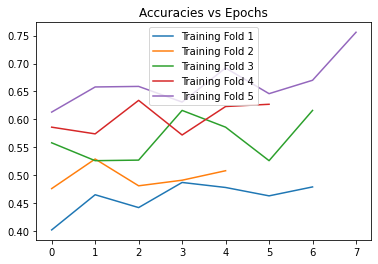

In [ ]:
plt.title('Accuracies vs Epochs')
plt.plot(model_history[0].history['accuracy'], label='Training Fold 1')
plt.plot(model_history[1].history['accuracy'], label='Training Fold 2')
plt.plot(model_history[2].history['accuracy'], label='Training Fold 3')
plt.plot(model_history[3].history['accuracy'], label='Training Fold 4')
plt.plot(model_history[4].history['accuracy'], label='Training Fold 5')
plt.legend()
plt.show()

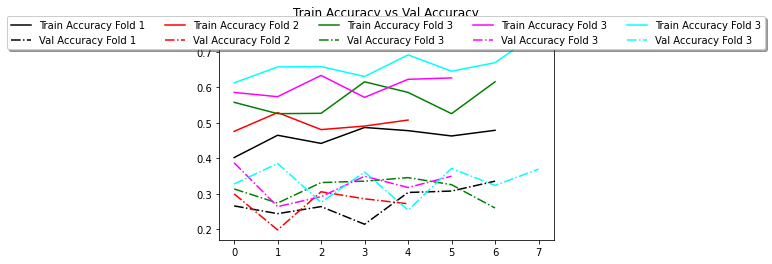

In [ ]:
plt.title('Train Accuracy vs Val Accuracy')
plt.plot(model_history[0].history['accuracy'], label='Train Accuracy Fold 1', color='black')
plt.plot(model_history[0].history['val_accuracy'], label='Val Accuracy Fold 1', color='black', linestyle = "dashdot")
plt.plot(model_history[1].history['accuracy'], label='Train Accuracy Fold 2', color='red', )
plt.plot(model_history[1].history['val_accuracy'], label='Val Accuracy Fold 2', color='red', linestyle = "dashdot")
plt.plot(model_history[2].history['accuracy'], label='Train Accuracy Fold 3', color='green', )
plt.plot(model_history[2].history['val_accuracy'], label='Val Accuracy Fold 3', color='green', linestyle = "dashdot")
plt.plot(model_history[3].history['accuracy'], label='Train Accuracy Fold 3', color='magenta', )
plt.plot(model_history[3].history['val_accuracy'], label='Val Accuracy Fold 3', color='magenta', linestyle = "dashdot")
plt.plot(model_history[4].history['accuracy'], label='Train Accuracy Fold 3', color='cyan', )
plt.plot(model_history[4].history['val_accuracy'], label='Val Accuracy Fold 3', color='cyan', linestyle = "dashdot")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=5, fancybox=True, shadow=True)
#plt.legend()
plt.show()

In [ ]:
from keras.mixed_precision.loss_scale_optimizer import FakeOptimizerForRestoration
filename = 'zfnetc_model.sav'
pickle.dump(FakeOptimizerForRestoration, open(filename, 'wb'))

In [ ]:
rzf_pred = rforest.predict(test_featurez)

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

accuracy_score(test_labelz, rzf_pred)


0.627

In [ ]:
type(zf_pred)
zf_pred.shape

(1000,)

In [ ]:
test_batchez.classes.shape

(1000,)

In [ ]:
from sklearn.metrics import roc_curve
#y_pred_keras = keras_model.predict(X_test).ravel()
fpr_keras, tpr_keras, thresholds_keras = roc_curve(test_batchez.classes, zf_pred.ravel)

ValueError: ignored

In [ ]:
def plot_roc(Pred, Pred_Label):
  fp, tp, _ = sklearn.metrics.roc_curve(labels, predictions).

In [ ]:
from keras.engine.compile_utils import MetricsContainer
from sklearn import metrics
import numpy as np
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

#test_labelz = test_labelz.reshape(-1,1)
zf_score = zf_pred

#Binarize the output
zf_bin = label_binarize(test_batchez.classes, classes=[1, 2, 3, 4])
n_classes = zf_bin.shape[1]

#zf_score = zf_score.reshape(-1,1)
#val_pred  = val_pred.reshape(-1,1)
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = metrics.roc_curve(zf_bin[i], zf_score[i])
    roc_auc[i] = metrics.auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
#fpr["micro"], tpr["micro"], _ = metrics.roc_curve(test_labelz.ravel(), rzf_pred.ravel())
#roc_auc["micro"] = metrics.auc(fpr["micro"], tpr["micro"])

TypeError: ignored

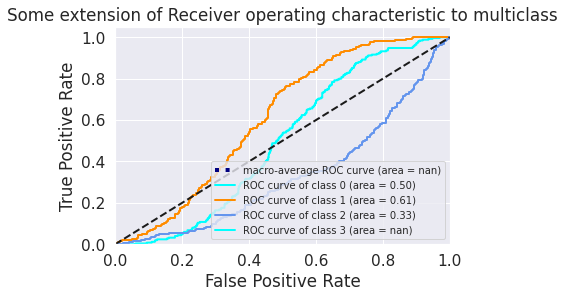

In [ ]:
from cycler import cycle


# Plor ROC Curves
# First aggregate all false positive rates

n_classes = 4

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])

'''# Plot all ROC curves
plt.figure()
plt.plot(
    fpr["micro"],
    tpr["micro"],
    label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
    color="deeppink",
    linestyle=":",
    linewidth=4,
)
'''
plt.plot(
    fpr["macro"],
    tpr["macro"],
    label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for i, color in zip(range(n_classes), colors):
    plt.plot(
        fpr[i],
        tpr[i],
        color=color,
        lw=2,
        label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]),
    )

plt.plot([0, 1], [0, 1], "k--", lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="lower right")
plt.show()

In [ ]:
print(classification_report(test_batchez.classes, zf_pred))


              precision    recall  f1-score   support

           0       0.23      0.17      0.19       250
           1       0.30      0.16      0.21       250
           2       0.31      0.22      0.26       250
           3       0.27      0.55      0.36       250

    accuracy                           0.28      1000
   macro avg       0.28      0.28      0.26      1000
weighted avg       0.28      0.28      0.26      1000



In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017_2/vggnet-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

wj=n_samples / (n_classes * n_samplesj)

wj is the weight for each class(j signifies the class)/
n_samplesis the total number of samples or rows in the dataset/
n_classesis the total number of unique classes in the target/
n_samplesjis the total number of rows of the respective class/

*wc = 7752/(4, 1542)    wdm = 7752/(4,1539)  wdr = 7752/(4,1590)   wn = 7752/(4,3081)*
wc=1.256  wdm= 1.259  wdr= 1.218  wn=0.629

In [ ]:
class_weight = {0: 1.256,
                1: 1.259,
                2: 1.218,
                3: 0.629}

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [ ]:
from keras.callbacks import ModelCheckpoint


filepath="/content/drive/MyDrive/OCT2017-Data/CNN_svC-weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath)
callbacks_list = [checkpoint, earlystop]